In [2]:
import pandas as pd
pd.set_option('display.max_columns', None)

In [3]:
vehicle = pd.read_csv("vehicles.csv")

In [95]:
vehicle[:1000].to_csv("data_file.csv")

In [93]:
vehicle_2 = vehicle[vehicle["posting_date"].notna()]
vehicle_2["posting_date"] = vehicle_2["posting_date"].str[:-5]
vehicle_2["posting_date"] = pd.to_datetime(vehicle_2["posting_date"],format='%Y-%m-%dT%H:%M:%S')
df = pd.DataFrame(vehicle_2.resample('H', on='posting_date')["id"].count())
df = pd.DataFrame(list(df["id"]),list(df.index))
df.rename(columns={0:"Hourly_Transaction"},inplace=True)
df["hour"]=pd.to_datetime(df.index).strftime('%-H')
model1 = smf.ols('Hourly_Transaction ~ C(hour)', data=df).fit()
df['dehourfied_hourly_Transaction'] = model1.resid
df[:50]

,Hourly_Transaction,hour,dehourfied_hourly_Transaction
2021-04-04 00:00:00,1,0,-70.419355
2021-04-04 01:00:00,10,1,-39.483871
2021-04-04 02:00:00,5,2,-30.741935
2021-04-04 03:00:00,63,3,-9.580645
2021-04-04 04:00:00,69,4,-35.129032
2021-04-04 05:00:00,89,5,-33.258065
2021-04-04 06:00:00,91,6,-137.580645
2021-04-04 07:00:00,133,7,-340.483871
2021-04-04 08:00:00,282,8,-555.419355
2021-04-04 09:00:00,365,9,-832.870968


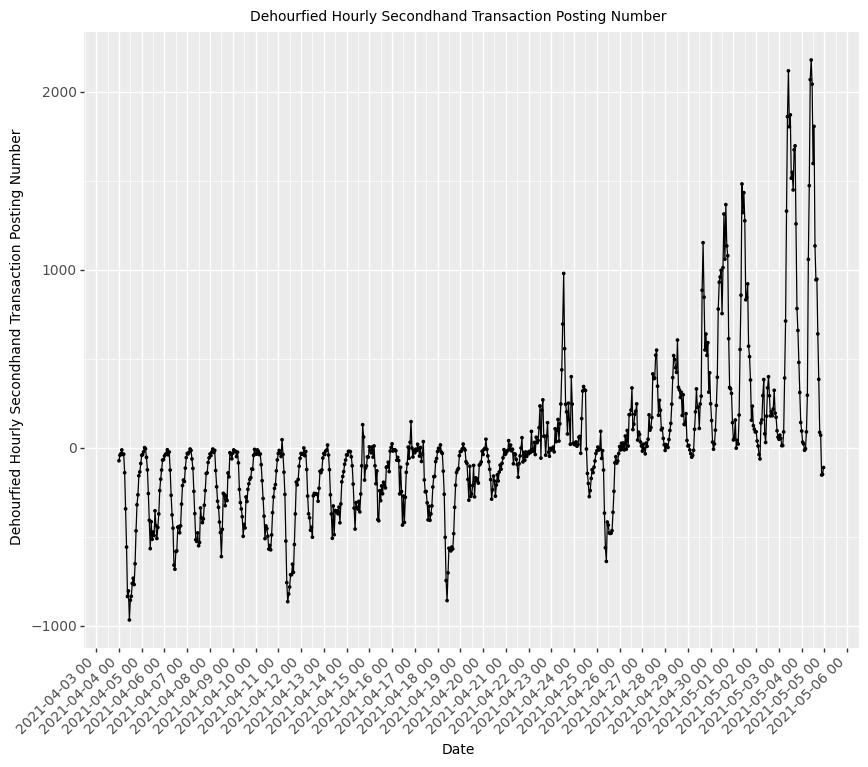

<ggplot: (1457514288261)>

In [91]:
from mizani.formatters import comma_format
from plotnine import *
from plotnine.stats import *
from mizani.breaks import date_breaks
from mizani.formatters import date_format
vehicle_2 = vehicle[vehicle["posting_date"].notna()]
vehicle_2["posting_date"] = vehicle_2["posting_date"].str[:-5]
vehicle_2["posting_date"] = pd.to_datetime(vehicle_2["posting_date"],format='%Y-%m-%dT%H:%M:%S')
df = pd.DataFrame(vehicle_2.resample('H', on='posting_date')["id"].count())
df = pd.DataFrame(list(df["id"]),list(df.index))
df.rename(columns={0:"Hourly_Transaction"},inplace=True)
df["hour"]=pd.to_datetime(df.index).strftime('%-H')
model1 = smf.ols('Hourly_Transaction ~ C(hour)', data=df).fit()
df['dehourfied_hourly_Transaction'] = model1.resid
b = (ggplot(df, aes(df.index, df["dehourfied_hourly_Transaction"]))) + geom_point(size=0.5) + \
geom_line(aes(group = 1)) \
+ theme(figure_size=(10, 8))\
+ theme(text=element_text(size=10))\
+ theme(axis_text_x=element_text(rotation=45, hjust=1))\
+ labs(x='Date', y='Dehourfied Hourly Secondhand Transaction Posting Number') \
+ ggtitle("Dehourfied Hourly Secondhand Transaction Posting Number")\
+ scale_x_datetime(breaks=date_breaks('1 day'), labels=(date_format('%Y-%m-%d %H')))
b

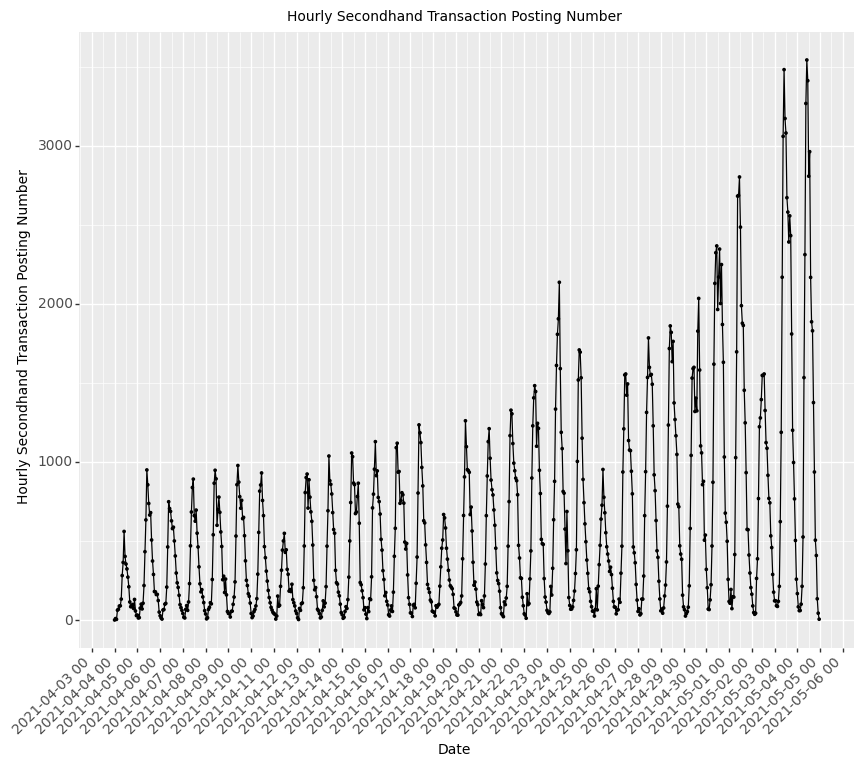

<ggplot: (1457515941678)>

In [68]:
from mizani.formatters import comma_format
from plotnine import *
from plotnine.stats import *
from mizani.breaks import date_breaks
from mizani.formatters import date_format
vehicle_2 = vehicle[vehicle["posting_date"].notna()]
vehicle_2["posting_date"] = vehicle_2["posting_date"].str[:-5]
vehicle_2["posting_date"] = pd.to_datetime(vehicle_2["posting_date"],format='%Y-%m-%dT%H:%M:%S')
df = pd.DataFrame(vehicle_2.resample('H', on='posting_date')["id"].count())
df = pd.DataFrame(list(df["id"]),list(df.index))
b = (ggplot(df, aes(df.index, df[0]))) + geom_point(size=0.5) + geom_line(aes(group = 1)) \
+ theme(figure_size=(10, 8))\
+ theme(text=element_text(size=10))\
+ theme(axis_text_x=element_text(rotation=45, hjust=1))\
+ labs(x='Date', y='Hourly Secondhand Transaction Posting Number') \
+ ggtitle("Hourly Secondhand Transaction Posting Number")\
+ scale_x_datetime(breaks=date_breaks('1 day'), labels=(date_format('%Y-%m-%d %H')))
b

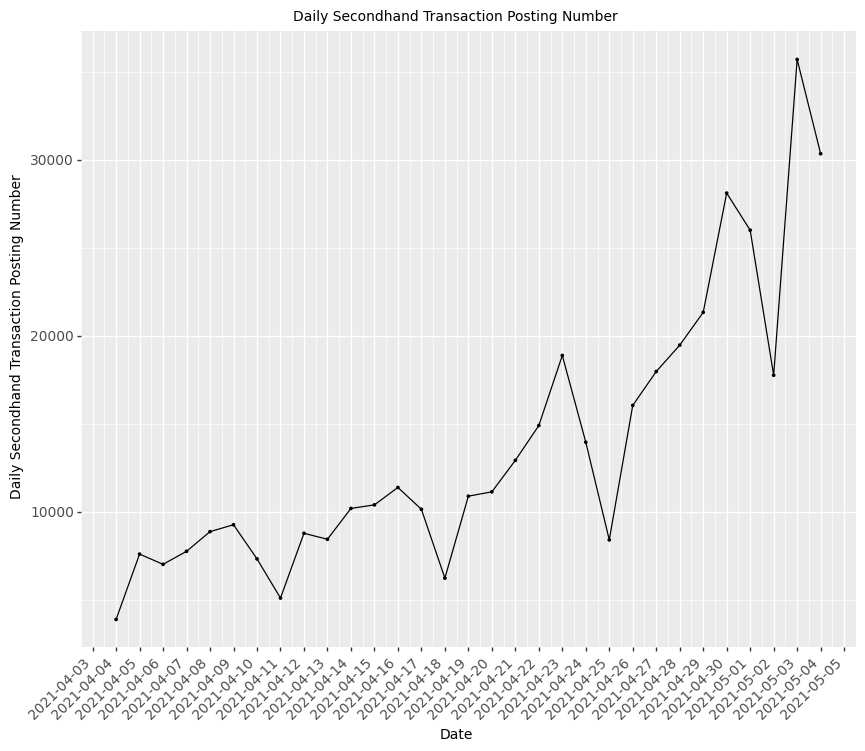

<ggplot: (1457518854919)>

In [53]:
from mizani.formatters import comma_format
from plotnine import *
from plotnine.stats import *
from mizani.breaks import date_breaks
from mizani.formatters import date_format

df_1 = vehicle_2.groupby([vehicle_2['posting_date'].dt.date])["id"].count()
df_1 = pd.DataFrame(list(df_1),list(df_1.index))
b = (ggplot(df_1, aes(df_1.index, df_1[0]))) + geom_point(size=0.5) + geom_line(aes(group = 1)) \
+ theme(figure_size=(10, 8))\
+ theme(text=element_text(size=10))\
+ theme(axis_text_x=element_text(rotation=45, hjust=1))\
+ labs(x='Date', y='Daily Secondhand Transaction Posting Number') \
+ ggtitle("Daily Secondhand Transaction Posting Number")\
+ scale_x_datetime(breaks=date_breaks('1 day'), labels=(date_format('%Y-%m-%d')))
b

In [78]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
df_1 = vehicle_2.groupby([vehicle_2['posting_date'].dt.date])["id"].count()
df_1 = pd.DataFrame(list(df_1),list(df_1.index))
df_1["weekday"]=pd.to_datetime(df_1.index).strftime('%A')
df_1.rename(columns={0:"daily_transaction"},inplace=True)
model1 = smf.ols('daily_transaction ~ C(weekday)', data=df_1).fit()
df_1['deweekfied_daily_transaction'] = model1.resid
df_1

,daily_transaction,weekday,deweekfied_daily_transaction
2021-04-04,3911,Sunday,-4389.20
2021-04-05,7622,Monday,-8198.60
2021-04-06,7041,Tuesday,-7959.20
2021-04-07,7780,Wednesday,-4825.25
2021-04-08,8897,Thursday,-4998.00
2021-04-09,9288,Friday,-7638.50
2021-04-10,7350,Saturday,-7025.00
2021-04-11,5127,Sunday,-3173.20
2021-04-12,8803,Monday,-7017.60
2021-04-13,8464,Tuesday,-6536.20


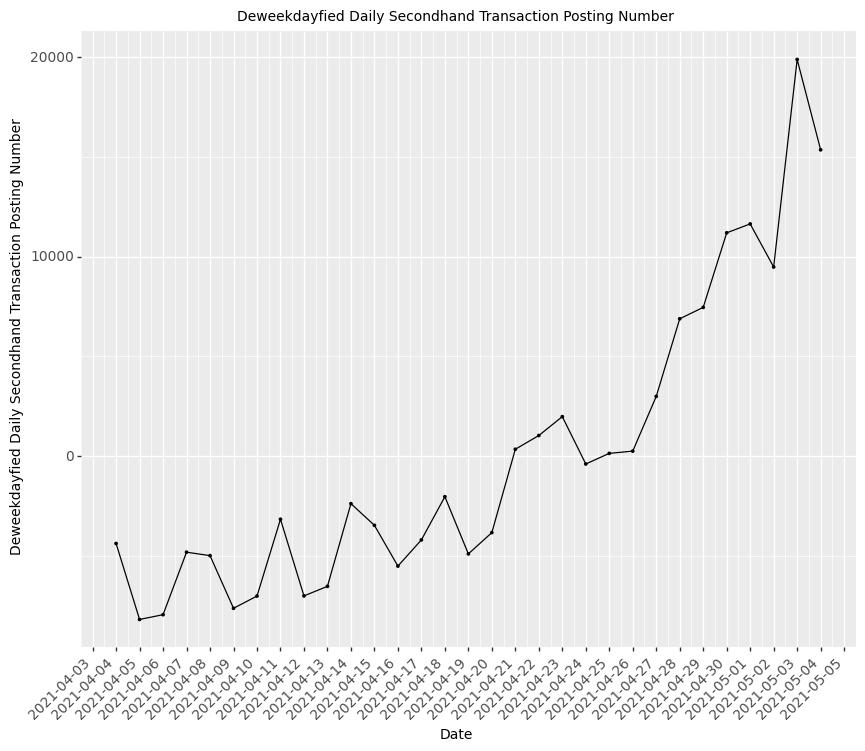

<ggplot: (1457517091291)>

In [81]:
from mizani.formatters import comma_format
from plotnine import *
from plotnine.stats import *
from mizani.breaks import date_breaks
from mizani.formatters import date_format
import statsmodels.api as sm
import statsmodels.formula.api as smf
df_1 = vehicle_2.groupby([vehicle_2['posting_date'].dt.date])["id"].count()
df_1 = pd.DataFrame(list(df_1),list(df_1.index))
df_1["weekday"]=pd.to_datetime(df_1.index).strftime('%A')
df_1.rename(columns={0:"daily_transaction"},inplace=True)
model1 = smf.ols('daily_transaction ~ C(weekday)', data=df_1).fit()
df_1['deweekfied_daily_transaction'] = model1.resid
b = (ggplot(df_1, aes(df_1.index, df_1['deweekfied_daily_transaction']))) + geom_point(size=0.5) + geom_line(aes(group = 1)) \
+ theme(figure_size=(10, 8))\
+ theme(text=element_text(size=10))\
+ theme(axis_text_x=element_text(rotation=45, hjust=1))\
+ labs(x='Date', y='Deweekdayfied Daily Secondhand Transaction Posting Number') \
+ ggtitle("Deweekdayfied Daily Secondhand Transaction Posting Number")\
+ scale_x_datetime(breaks=date_breaks('1 day'), labels=(date_format('%Y-%m-%d')))
b

In [4]:
vehicle_1 = vehicle[vehicle["model"].notna() & vehicle["year"].notna() & vehicle["manufacturer"].notna()\
                    & vehicle["price"].notna()\
                    & vehicle["odometer"].notna() & vehicle["price"]!=0]

In [5]:
vehicle_1["age"] = 2021-vehicle_1["year"].astype(int)

/tmp/ipykernel_130750/2315890347.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicle_1["age"] = 2021-vehicle_1["year"].astype(int)


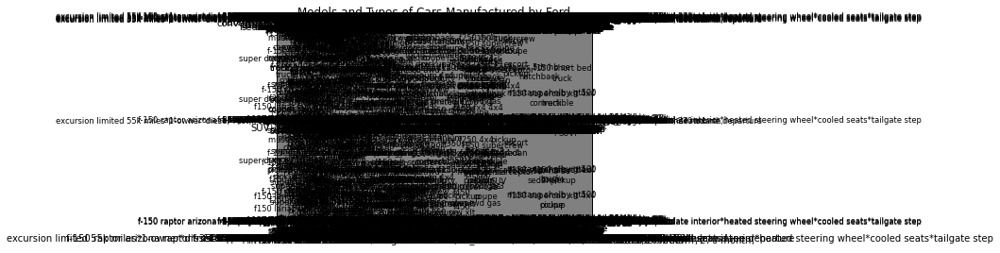

In [28]:
from collections import Counter
model = "ford"
list_1 = ["SUV","convertible","coupe","hatchback","pickup","sedan","truck"]
vehicle_2 = vehicle_1[vehicle_1["manufacturer"]==model]
vehicle_2 = vehicle_2[vehicle_2["type"].isin(list_1)]
vehicle_3 = vehicle_2[vehicle_2["model"].isin([x[0] for x in Counter(list(vehicle_2["model"])).most_common()][:10])]
vehicle_3_df = vehicle_3.pivot_table(index='model',columns='type',values='id',aggfunc=lambda x: len(x.unique())).fillna(0)
from statsmodels.graphics.mosaicplot import mosaic
t1 = mosaic(vehicle_2, ['model','type'],title="Models and Types of Cars Manufactured by "+model.capitalize(),\
            properties=props)

In [23]:
vehicle_2_df

type,SUV,convertible,coupe,hatchback,other,pickup,sedan,truck,van,wagon
model,,,,,,,,,,
edge,400.0,0.0,0.0,0.0,7.0,0.0,27.0,0.0,0.0,4.0
escape,917.0,0.0,0.0,0.0,17.0,0.0,5.0,1.0,0.0,25.0
expedition,281.0,0.0,0.0,0.0,17.0,0.0,1.0,1.0,0.0,14.0
explorer,736.0,0.0,0.0,0.0,19.0,2.0,0.0,2.0,0.0,14.0
f-150,2.0,0.0,0.0,1.0,40.0,1420.0,0.0,1246.0,1.0,0.0
f-250,0.0,0.0,1.0,0.0,8.0,369.0,0.0,55.0,0.0,0.0
f150,0.0,0.0,0.0,0.0,26.0,120.0,0.0,84.0,0.0,0.0
focus,0.0,0.0,8.0,191.0,37.0,0.0,389.0,0.0,0.0,2.0
fusion,3.0,0.0,0.0,1.0,26.0,0.0,631.0,0.0,0.0,0.0


<AxesSubplot: xlabel='age', ylabel='Count'>

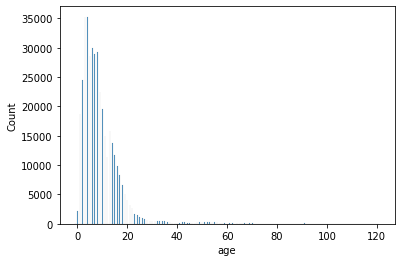

In [17]:
import seaborn as sns
sns.histplot(vehicle_1["age"])

In [30]:
df = vehicle_1[vehicle_1["model"]=='f-150']
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
df.shape

/tmp/ipykernel_1568744/3826991033.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_1568744/3826991033.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_1568744/3826991033.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

(3430, 27)

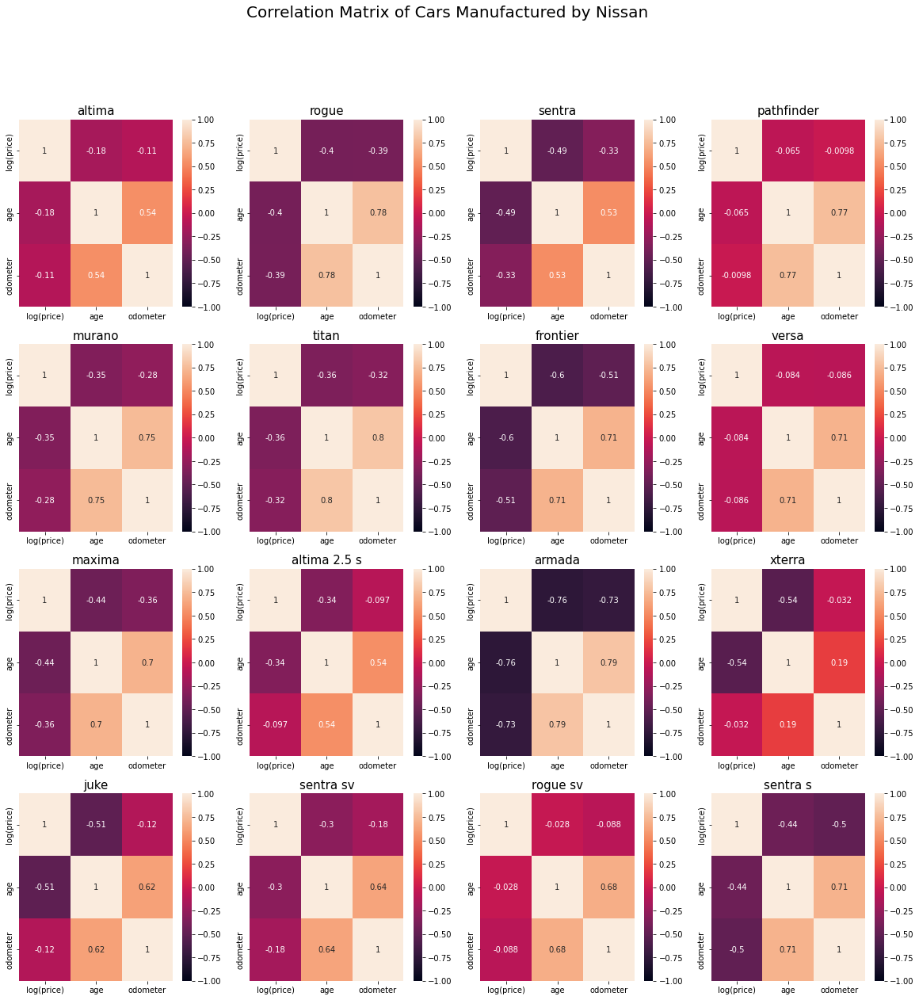

In [10]:
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
import warnings
warnings.filterwarnings('ignore')
fig, axs = plt.subplots(4, 4, figsize=(20, 20))
model = "nissan"
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
fig.suptitle("Correlation Matrix of Cars Manufactured by "+model.capitalize(),\
             fontsize=20)
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
df["log(price)"] = np.log(df["price"])
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][0:16]
for i in range(len(car_list)):
    matrix_1 = df[df["model"]==car_list[i]]\
    [["log(price)", "age", "odometer"]].corr()
    g1 = sns.heatmap(matrix_1,annot=True,ax=axs[i//4,i%4], vmin=-1, vmax=1)
    g1.set_title(car_list[i], fontsize=15)

/tmp/ipykernel_2639724/1030447802.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_2639724/1030447802.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_2639724/1030447802.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

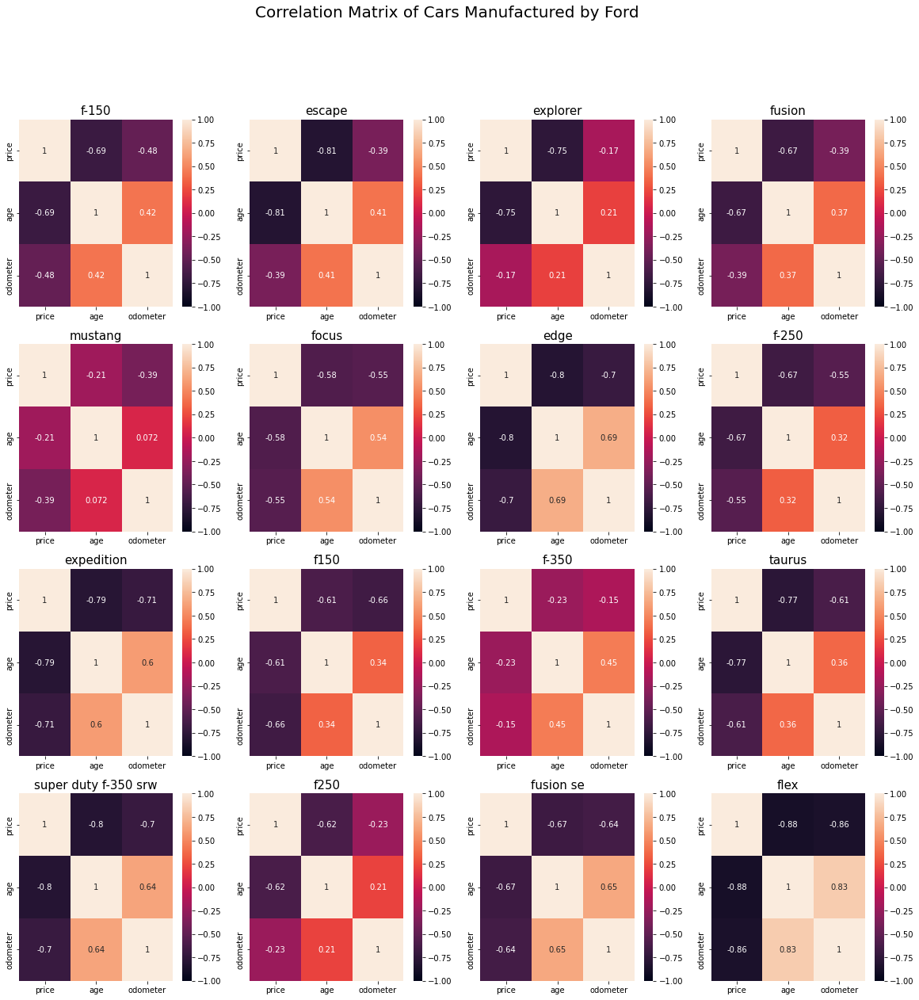

In [47]:
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
fig, axs = plt.subplots(4, 4, figsize=(20, 20))
model = "ford"
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
fig.suptitle("Correlation Matrix of Cars Manufactured by "+model.capitalize(),\
             fontsize=20)
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
df["log(price)"] = np.log(df["price"])
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][0:16]
for i in range(len(car_list)):
    matrix_1 = df[df["model"]==car_list[i]]\
    [["price", "age", "odometer"]].corr()
    g1 = sns.heatmap(matrix_1,annot=True,ax=axs[i//4,i%4], vmin=-1, vmax=1)
    g1.set_title(car_list[i], fontsize=15)

In [96]:
Counter(list(vehicle_1[vehicle_1["manufacturer"].notna()]["manufacturer"])).most_common()[:20]

[('ford', 25651),
 ('chevrolet', 18388),
 ('toyota', 11116),
 ('honda', 7005),
 ('nissan', 6750),
 ('ram', 6604),
 ('jeep', 6560),
 ('gmc', 5477),
 ('dodge', 4679),
 ('bmw', 4401),
 ('hyundai', 3558),
 ('mercedes-benz', 3478),
 ('subaru', 3394),
 ('kia', 2952),
 ('volkswagen', 2559),
 ('lexus', 2320),
 ('chrysler', 2134),
 ('cadillac', 2086),
 ('audi', 2019),
 ('mazda', 1602)]

In [16]:
[x[0] for x in Counter(list(vehicle_1[vehicle_1["manufacturer"].notna()]["manufacturer"])).most_common()][:5]

['ford', 'chevrolet', 'toyota', 'honda', 'nissan']

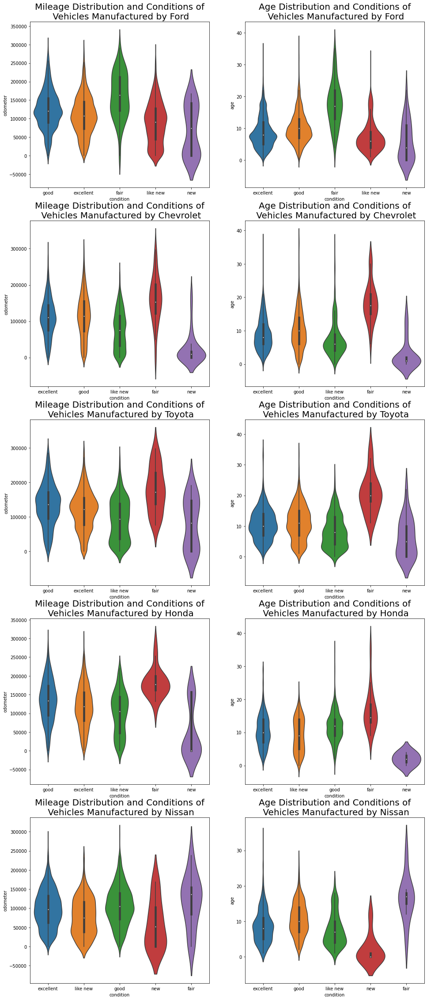

In [20]:
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
manu_list = [x[0] for x in Counter(list(vehicle_1[vehicle_1["manufacturer"].notna()]["manufacturer"])).most_common()][:5]
n=4
fig, axs = plt.subplots(5, 2, figsize=(8*2, 8*5))
for i in range(len(manu_list)):
    model=manu_list[i]
    df = vehicle_1[vehicle_1["manufacturer"]==model]
    df["year"] = df["year"].astype(int)
    df["age"] = 2021 - df["year"]
    df["price"] = df["price"].astype(float)
    df=df[["model","manufacturer","condition","type","price","age","odometer"]]
    df = df[(df["odometer"]<=300000) & (df["odometer"]>0) & (df["age"]<40)]
    df=df[df["condition"].isin([x[0] for x in Counter(list(df["condition"])).most_common()][0:6])]
    g = sns.violinplot(data=df, x="condition", y="odometer",ylim=[-20000,3000],ax=axs[i,0])
    g.set_title("Mileage Distribution and Conditions of\n Vehicles Manufactured by "+model.capitalize(),fontsize=20)
    df=df[df["type"].isin([x[0] for x in Counter(list(df["type"])).most_common()][1:6])]
    g = sns.violinplot(data=df, x="condition", y="age",ylim=[-20000,3000],ax=axs[i,1])
    g.set_title("Age Distribution and Conditions of\n Vehicles Manufactured by "+model.capitalize(),fontsize=20)

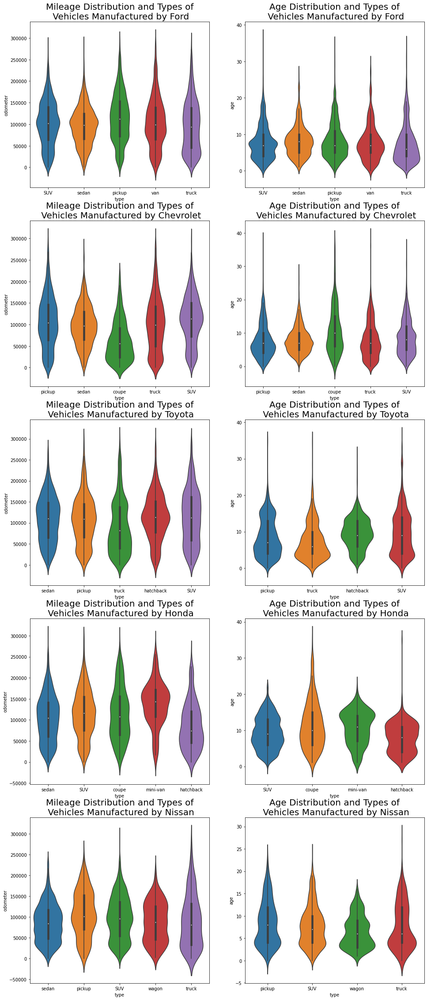

In [18]:
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
manu_list = [x[0] for x in Counter(list(vehicle_1[vehicle_1["manufacturer"].notna()]["manufacturer"])).most_common()][:5]
n=4
fig, axs = plt.subplots(5, 2, figsize=(8*2, 8*5))
for i in range(len(manu_list)):
    model=manu_list[i]
    df = vehicle_1[vehicle_1["manufacturer"]==model]
    df["year"] = df["year"].astype(int)
    df["age"] = 2021 - df["year"]
    df["price"] = df["price"].astype(float)
    df=df[["model","manufacturer","condition","type","price","age","odometer"]]
    df = df[(df["odometer"]<=300000) & (df["odometer"]>0) & (df["age"]<40)]
    df=df[df["type"].isin([x[0] for x in Counter(list(df["type"])).most_common()][0:6])]
    g = sns.violinplot(data=df, x="type", y="odometer",ylim=[-20000,3000],ax=axs[i,0])
    g.set_title("Mileage Distribution and Types of\n Vehicles Manufactured by "+model.capitalize(),fontsize=20)
    df=df[df["type"].isin([x[0] for x in Counter(list(df["type"])).most_common()][1:6])]
    g = sns.violinplot(data=df, x="type", y="age",ylim=[-20000,3000],ax=axs[i,1])
    g.set_title("Age Distribution and Types of\n Vehicles Manufactured by "+model.capitalize(),fontsize=20)

Price and Mileage of Cars Manufactured by Bmw of Different Models


/tmp/ipykernel_2639724/8670581.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_2639724/8670581.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_2639724/8670581.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

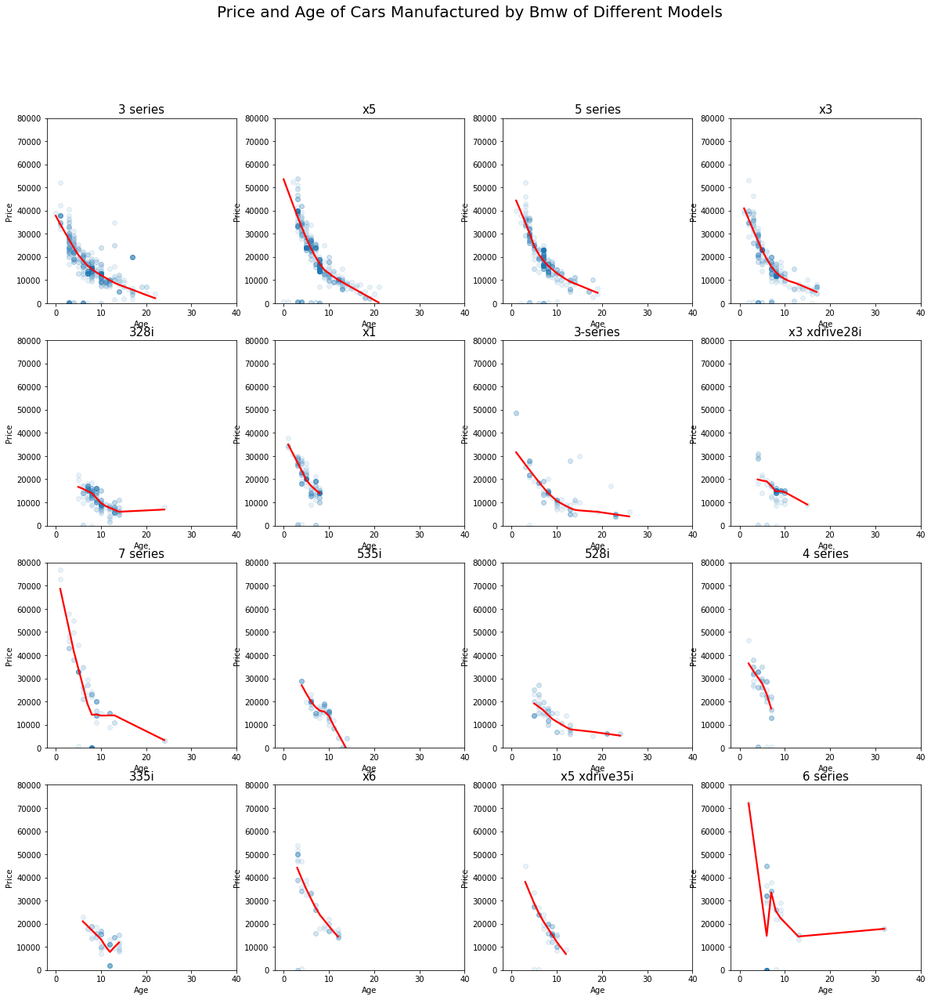

In [29]:
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
import seaborn as sns
model="bmw"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Price and Age of Cars Manufactured by "+\
             model.capitalize()+" of Different Models", fontsize=20)
print("Price and Mileage of Cars Manufactured by "+\
      model.capitalize()+" of Different Models")
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]]
    g1 = sns.regplot(x="age",y="price",data=df_1,ax=axs[i//n,i%n],\
                     scatter_kws={'alpha':0.1},lowess=True,\
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-2,40])
    g1.set_ylim([0,80000])
    g1.set_xlabel("Age")
    g1.set_ylabel("Price")

In [42]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
df_1 = vehicle_1[vehicle_1["model"]=="f-150"]
df_1["log_price"] = np.log(df_1["price"])
model1 = sm.RLM(df_2["log_price"], sm.add_constant(df_2["age"]), M=sm.robust.norms.HuberT(t=2)).fit()
model1.params["age"]

-0.1308455505353119

In [99]:
import sklearn.decomposition as skd
import sklearn.preprocessing as skp
df_1[["price","age","odometer"]] = df_1[["price","age","odometer"]].astype(float)
df_1[["price","age","odometer"]] = skp.scale(df_1[["price","age","odometer"]])
df_1["log price"] = np.log(df_1["price"])
df_1 = df_1[["model","price","log price","age","odometer"]]

In [100]:
pca_model = skd.PCA().fit(df_1[["age","odometer"]])

In [101]:
pca_model.components_

array([[ 0.70710678,  0.70710678],
       [-0.70710678,  0.70710678]])

Price and Age of Cars Manufactured by Ford of Different Models


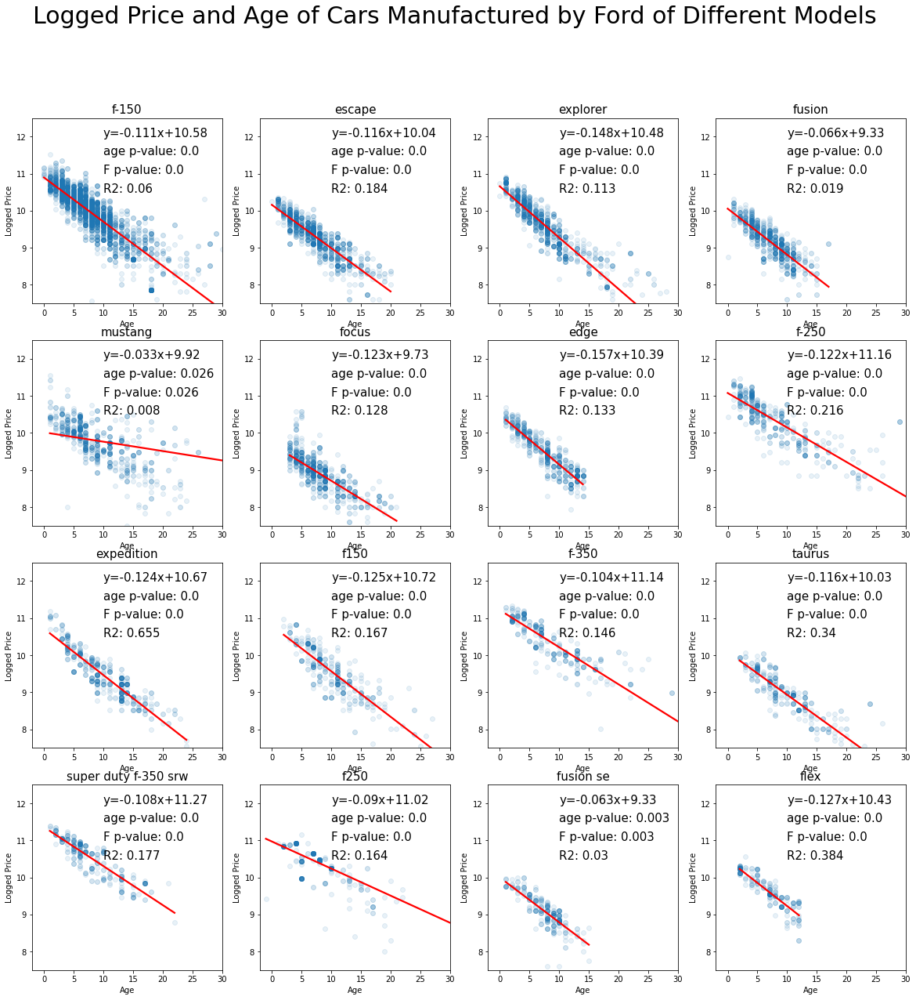

In [33]:
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import warnings
warnings.filterwarnings('ignore')
model=""
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Logged Price and Age of Cars Manufactured by "+model.capitalize()+" of Different Models", fontsize=30)
print("Price and Age of Cars Manufactured by "+model.capitalize()+" of Different Models")
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]] 
    df_1["log_price"] = np.log(df_1["price"])
    df_2 = df_1[(df_1["age"]>=2) & (df_1["age"]<=15)]
    model1 = smf.ols('log_price ~ age', data=df_2).fit()
    g1 = sns.regplot(x="age",y=np.log(df_1["price"]),data=df_1,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1},lowess=False,\
                     robust=True,ci=None,\
                    line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-2,30])
    g1.set_ylim([7.5,12.5])
    g1.set_xlabel("Age", fontsize=10)
    g1.set_ylabel("Logged Price", fontsize=10)
    g1.text(10,12,"y="+str(round(model1.params["age"],3))+"x+"+str(round(model1.params["Intercept"],2)), fontsize=15)
    g1.text(10,11.5,"age p-value: "+str(round(model1.pvalues["age"],3)), fontsize=15)
    try: 
        g1.text(10,11,"F p-value: "+str(round(model1.f_pvalue,3)), fontsize=15)
    except:
        pass
    g1.text(10,10.5,"R2: "+str(round(model1.rsquared,3)), fontsize=15)

Price and Age of Cars Manufactured by Ford of Different Models


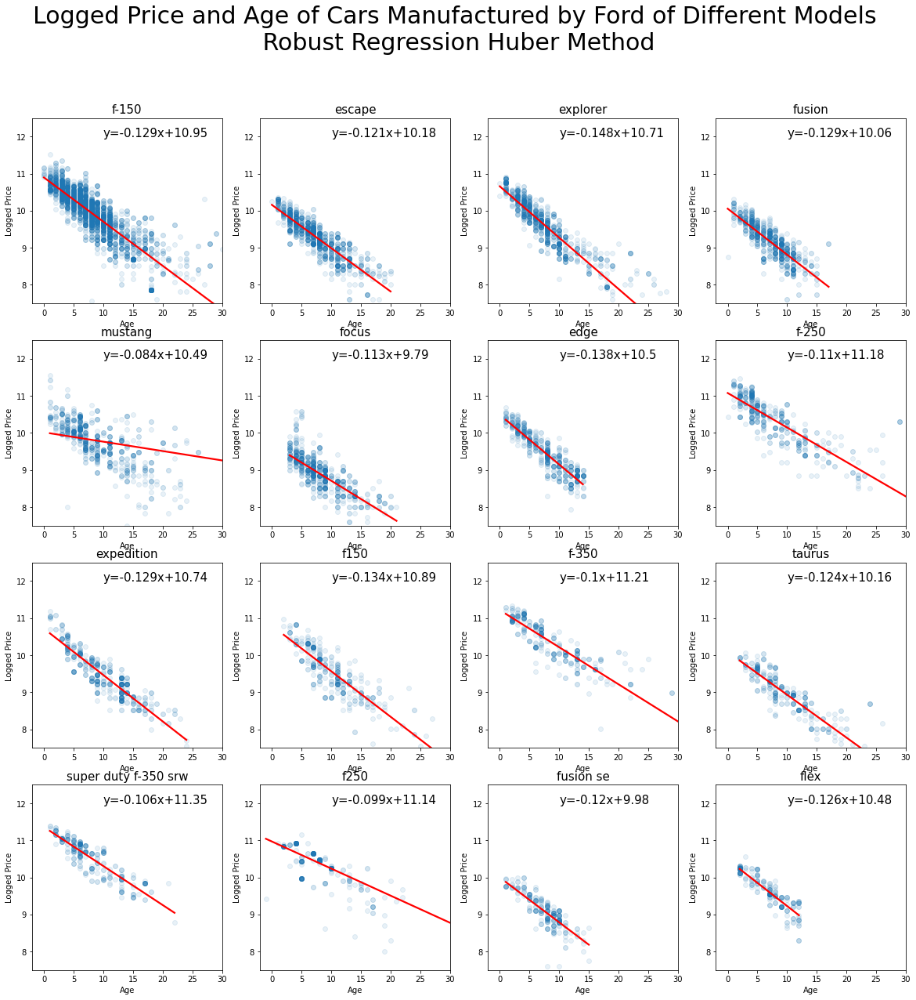

In [82]:
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import warnings
warnings.filterwarnings('ignore')
model="ford"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Logged Price and Age of Cars Manufactured by "+model.capitalize()+\
             " of Different Models\n Robust Regression Huber Method", fontsize=30)
print("Price and Age of Cars Manufactured by "+model.capitalize()+" of Different Models")
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]] 
    df_1["log_price"] = np.log(df_1["price"])
    df_2 = df_1[(df_1["age"]>=1) & (df_1["age"]<=np.quantile(list(df_1["age"]), .95))]
    data = sm.datasets.stackloss.load()
    data.exog = sm.add_constant(data.exog)
    try:
        model1 = sm.RLM(df_2["log_price"], sm.add_constant(df_2["age"]), M=sm.robust.norms.HuberT(t=2)).fit()
    except:
        pass
    g1 = sns.regplot(x="age",y=np.log(df_1["price"]),data=df_1,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1},lowess=False,\
                     robust=True,ci=None,\
                    line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-2,30])
    g1.set_ylim([7.5,12.5])
    g1.set_xlabel("Age", fontsize=10)
    g1.set_ylabel("Logged Price", fontsize=10)
    try:
        g1.text(10,12,"y="+str(round(model1.params["age"],3))+"x+"+str(round(model1.params["const"],2)), fontsize=15)
    except:
        pass

In [6]:
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import warnings
warnings.filterwarnings('ignore')

manufacturer_list = []
model_list = []
dict_age_depre_rate = {}
age_const = []
dict_mileage_depre_rate = {}
mileage_const = []
for model in [x[0] for x in Counter(list(vehicle_1[vehicle_1["manufacturer"].notna()]\
                                         ["manufacturer"])).\
              most_common()][:20]:
    n = 4
    print("Price and Age of Cars Manufactured by "+model.capitalize()+" of Different Models")
    df = vehicle_1[vehicle_1["manufacturer"]==model]
    df["year"] = df["year"].astype(int)
    df["age"] = 2021 - df["year"]
    df["price"] = df["price"].astype(float)
    car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                           ["model"])).most_common()][:n**2]
    for i in range(len(car_list)):
        df_1 = vehicle_1[vehicle_1["model"]==car_list[i]] 
        df_1["log_price"] = np.log(df_1["price"])
        df_2 = df_1[(df_1["age"]>=2) & (df_1["age"]<=15) & (df_1["age"]<=np.quantile\
                                                            (list(df_1["age"]), .90))]
        df_3 = df_1[(df_1["odometer"]>=8000) & (df_1["odometer"]<=300000)\
                & (df_1["odometer"]<=np.quantile(list(df_1["odometer"]), .85))]
        try:
            model1 = sm.RLM(df_2["log_price"], sm.add_constant(df_2["age"]), \
                            M=sm.robust.norms.HuberT(t=2)).fit()
            model2 = sm.RLM(df_3["log_price"], sm.add_constant(df_3["odometer"]), \
                            M=sm.robust.norms.HuberT(t=2)).fit()
            age_const.append(round(model1.params["const"],4))
            mileage_const.append(round(model2.params["const"],4))
            dict_age_depre_rate[model+" "+car_list[i]] = round(model1.params["age"],4)
            dict_mileage_depre_rate[model+" "+car_list[i]] = round(model2.params["odometer"]\
                                                                   *10**6,3)   
            manufacturer_list.append(model)
            model_list.append(car_list[i])
        except:
            pass

Price and Age of Cars Manufactured by Ford of Different Models
Price and Age of Cars Manufactured by Chevrolet of Different Models
Price and Age of Cars Manufactured by Toyota of Different Models
Price and Age of Cars Manufactured by Honda of Different Models
Price and Age of Cars Manufactured by Nissan of Different Models
Price and Age of Cars Manufactured by Ram of Different Models
Price and Age of Cars Manufactured by Jeep of Different Models
Price and Age of Cars Manufactured by Gmc of Different Models
Price and Age of Cars Manufactured by Dodge of Different Models
Price and Age of Cars Manufactured by Bmw of Different Models
Price and Age of Cars Manufactured by Hyundai of Different Models
Price and Age of Cars Manufactured by Mercedes-benz of Different Models
Price and Age of Cars Manufactured by Subaru of Different Models
Price and Age of Cars Manufactured by Kia of Different Models
Price and Age of Cars Manufactured by Volkswagen of Different Models
Price and Age of Cars Manufa

In [100]:
print(len(dict_age_depre_rate.keys()),\
      len(dict_age_depre_rate.values()),len(dict_mileage_depre_rate.values()),\
      len(age_const),len(mileage_const),len(manufacturer_list),len(model_list))

310 310 310 310 310 310 310


In [7]:
df_4 = pd.DataFrame({"model and manufacturer":dict_age_depre_rate.keys(),\
              "age_depre_rate":dict_age_depre_rate.values(),\
              "mileage_depre_rate (*10**6)":dict_mileage_depre_rate.values(),\
              "age_const":age_const,\
              "mileage_const":mileage_const,\
              "model":model_list,\
              "manufacturer":manufacturer_list})
df_4["age_0_price"]=np.exp(df_4["age_const"])
df_4["mileage_0_price"]=np.exp(df_4["mileage_const"])
df_4.to_csv("car_depre_rate.csv")
df_4

,model and manufacturer,age_depre_rate,mileage_depre_rate (*10**6),age_const,mileage_const,model,manufacturer,age_0_price,mileage_0_price
0,ford f-150,-0.1308,-7.364,10.9655,10.7615,f-150,ford,57843.710160,47169.369045
1,ford escape,-0.1191,-8.536,10.1533,10.1316,escape,ford,25675.692341,25124.531540
2,ford explorer,-0.1531,-10.454,10.7180,10.7270,explorer,ford,45161.489480,45569.777425
3,ford fusion,-0.1274,-8.031,10.0453,9.9310,fusion,ford,23047.210003,20557.888194
4,ford mustang,-0.0910,-8.584,10.5313,10.4475,mustang,ford,37470.153935,34458.121634
...,...,...,...,...,...,...,...,...,...
305,mazda mazda5,-0.0975,-9.329,9.8407,9.8351,mazda5,mazda,18782.859421,18677.969374
306,mazda mazda2,-0.1571,-4.706,10.0953,9.2187,mazda2,mazda,24228.865728,10083.946673
307,mazda cx-5 grand touring,0.2177,19.387,7.8597,7.8765,cx-5 grand touring,mazda,2590.743036,2634.635181
308,mazda cx-5 touring,-0.0620,-2.453,9.8803,9.6496,cx-5 touring,mazda,19541.584258,15515.580631


In [8]:
vehicle["model and manufacturer"] = vehicle["manufacturer"]+" "+vehicle["model"]
df_5 = vehicle[vehicle["model and manufacturer"].isin(df_4["model and manufacturer"])].\
pivot_table(index='model and manufacturer',columns='type',values='id',aggfunc=lambda x: len(x.unique())).fillna(0)
df_6 = (df_5.div(df_5.sum(axis=1), axis=0)*100).round(2).astype(str) + '%'

In [9]:
vehicle["model and manufacturer"] = vehicle["manufacturer"]+" "+vehicle["model"]
df_5 = vehicle[vehicle["model and manufacturer"].isin(df_4["model and manufacturer"])].\
pivot_table(index='model and manufacturer',columns='type',values='id',aggfunc=lambda x: len(x.unique())).fillna(0)
df_6 = (df_5.div(df_5.sum(axis=1), axis=0)*100).round(2).astype(str) + '%'
df_6["types"] = np.empty((len(df_6), 0)).tolist()
df_6.insert(len(df_6.columns),"types_str", "")
for i in range(len(df_6.columns)-2):
    for j in range(len(df_6.index)):
        if float(df_6.iloc[j,i][:-1])>=25:
            df_6["types"][j].append(df_6.columns[i])
for j in range(len(df_6.index)):
    df_6["types_str"][j] = ", ".join(df_6["types"][j])
df_4 = df_4.merge(df_6[["types","types_str"]],right_on="model and manufacturer",left_on=df_6.index)
df_4

,model and manufacturer,age_depre_rate,mileage_depre_rate (*10**6),age_const,mileage_const,model,manufacturer,age_0_price,mileage_0_price,types,types_str
0,ford f-150,-0.1308,-7.364,10.9655,10.7615,f-150,ford,57843.710160,47169.369045,[sedan],sedan
1,ford escape,-0.1191,-8.536,10.1533,10.1316,escape,ford,25675.692341,25124.531540,[sedan],sedan
2,ford explorer,-0.1531,-10.454,10.7180,10.7270,explorer,ford,45161.489480,45569.777425,[coupe],coupe
3,ford fusion,-0.1274,-8.031,10.0453,9.9310,fusion,ford,23047.210003,20557.888194,[sedan],sedan
4,ford mustang,-0.0910,-8.584,10.5313,10.4475,mustang,ford,37470.153935,34458.121634,"[hatchback, sedan]","hatchback, sedan"
...,...,...,...,...,...,...,...,...,...,...,...
305,mazda mazda5,-0.0975,-9.329,9.8407,9.8351,mazda5,mazda,18782.859421,18677.969374,[sedan],sedan
306,mazda mazda2,-0.1571,-4.706,10.0953,9.2187,mazda2,mazda,24228.865728,10083.946673,[hatchback],hatchback
307,mazda cx-5 grand touring,0.2177,19.387,7.8597,7.8765,cx-5 grand touring,mazda,2590.743036,2634.635181,"[mini-van, van]","mini-van, van"
308,mazda cx-5 touring,-0.0620,-2.453,9.8803,9.6496,cx-5 touring,mazda,19541.584258,15515.580631,[SUV],SUV


Text(0, 0.5, 'Mileage Depreciation Rate')

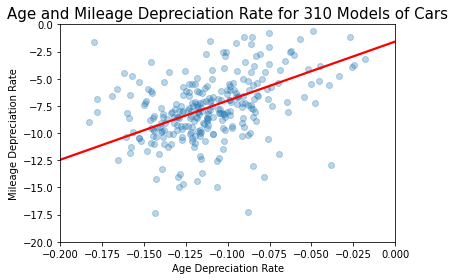

In [126]:
g = sns.regplot(x="age_depre_rate",y="mileage_depre_rate (*10**6)",\
data=df_4,scatter_kws={'alpha':0.3},lowess=False,\
                     robust=True,ci=None,\
                    line_kws={"color": "red"})
g.set_xlim([-0.2,0])
g.set_ylim([-20,0])
g.set_title("Age and Mileage Depreciation Rate for 310 Models of Cars", fontsize=15)
g.set_xlabel("Age Depreciation Rate", fontsize=10)
g.set_ylabel("Mileage Depreciation Rate", fontsize=10)

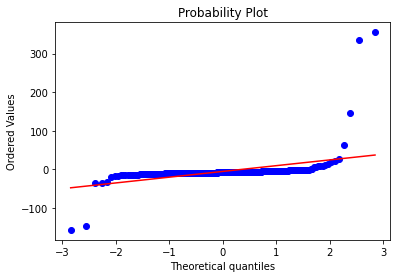

In [69]:
import numpy as np 
import pylab 
import scipy.stats as stats
g2 = stats.probplot(df_4["mileage_depre_rate (*10**6)"], dist="norm", plot=pylab)
pylab.show()

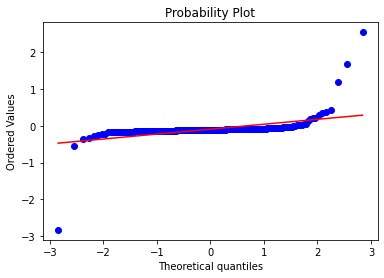

In [46]:
import numpy as np 
import pylab 
import scipy.stats as stats
stats.probplot(df_4["age_depre_rate"], dist="norm", plot=pylab)
pylab.show()

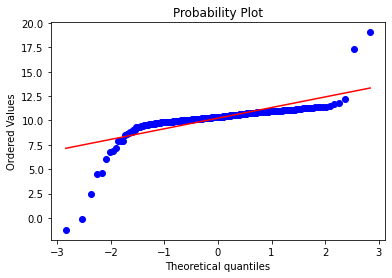

In [47]:
import numpy as np 
import pylab 
import scipy.stats as stats
stats.probplot(df_4["age_const"], dist="norm", plot=pylab)
pylab.show()

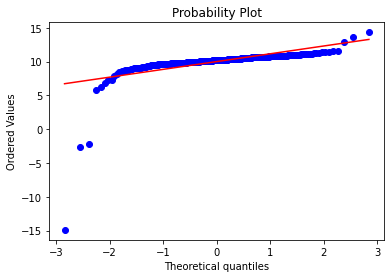

In [48]:
import numpy as np 
import pylab 
import scipy.stats as stats
stats.probplot(df_4["mileage_const"], dist="norm", plot=pylab)
pylab.show()

In [60]:
df_4['age_0_price'].sort_values(['age_0_price'])

TypeError: unhashable type: 'list'

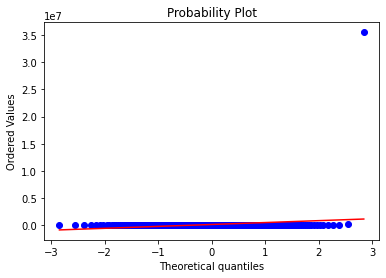

In [56]:
import numpy as np 
import pylab 
import scipy.stats as stats
stats.probplot(df_4[df_4['age_0_price']!=df_4['age_0_price'].max()]["age_0_price"], dist="norm", plot=pylab)
pylab.show()

In [11]:
set(list(vehicle["type"]))

{'SUV',
 'bus',
 'convertible',
 'coupe',
 'hatchback',
 'mini-van',
 nan,
 'offroad',
 'other',
 'pickup',
 'sedan',
 'truck',
 'van',
 'wagon'}

In [30]:
from collections import Counter
Counter(list(vehicle["type"])).most_common()

[(nan, 92858),
 ('sedan', 87056),
 ('SUV', 77284),
 ('pickup', 43510),
 ('truck', 35279),
 ('other', 22110),
 ('coupe', 19204),
 ('hatchback', 16598),
 ('wagon', 10751),
 ('van', 8548),
 ('convertible', 7731),
 ('mini-van', 4825),
 ('offroad', 609),
 ('bus', 517)]

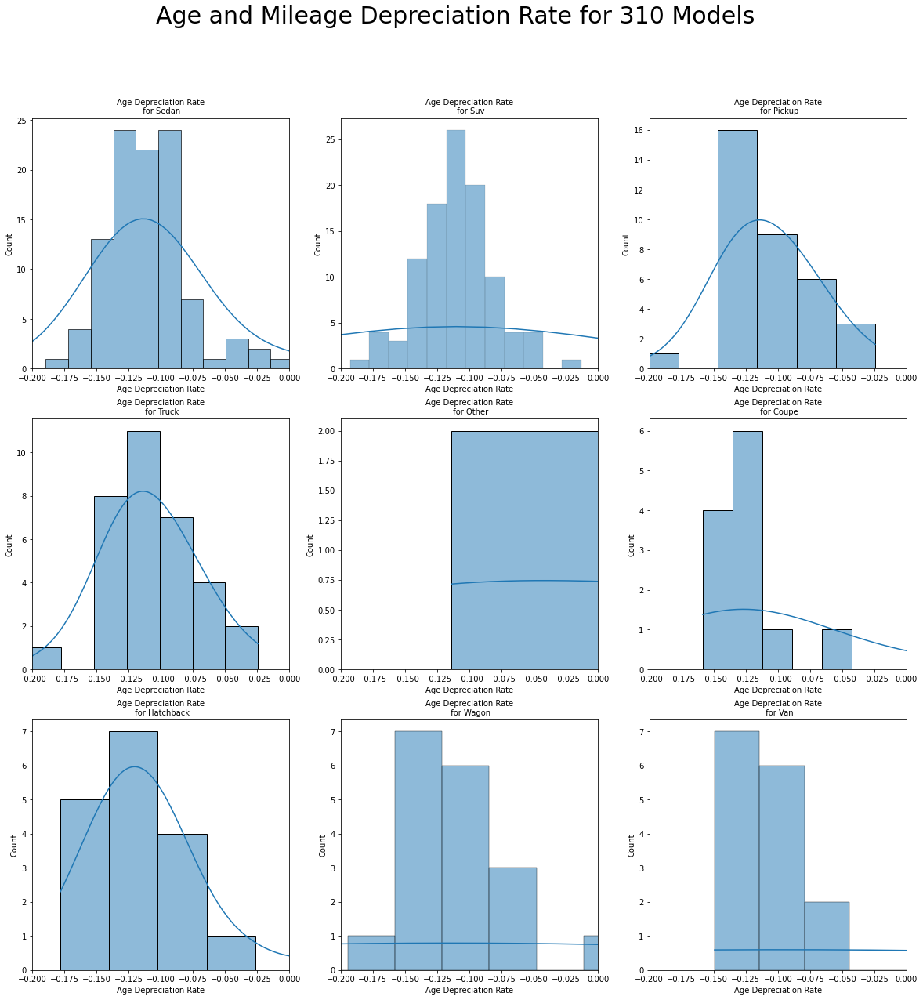

In [34]:
from collections import Counter
n = 3
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Age and Mileage Depreciation Rate for 310 Models", fontsize=30)
type_list = [x[0] for x in Counter(list(vehicle["type"])).most_common()]
type_list = [x for x in type_list if str(x) != 'nan'][:n**2]
for i in range(len(type_list)):
    car_type = type_list[i]
    new_df = df_4[df_4["types_str"].str.contains(car_type,case=False)]
    g = sns.histplot(x="age_depre_rate",\
    data=new_df,ax=axs[i//n,i%n],kde=True)
    g.set_xlim([-0.2,0])
    g.set_title("Age Depreciation Rate\n for "+car_type.capitalize(), fontsize=10)
    g.set_xlabel("Age Depreciation Rate", fontsize=10)

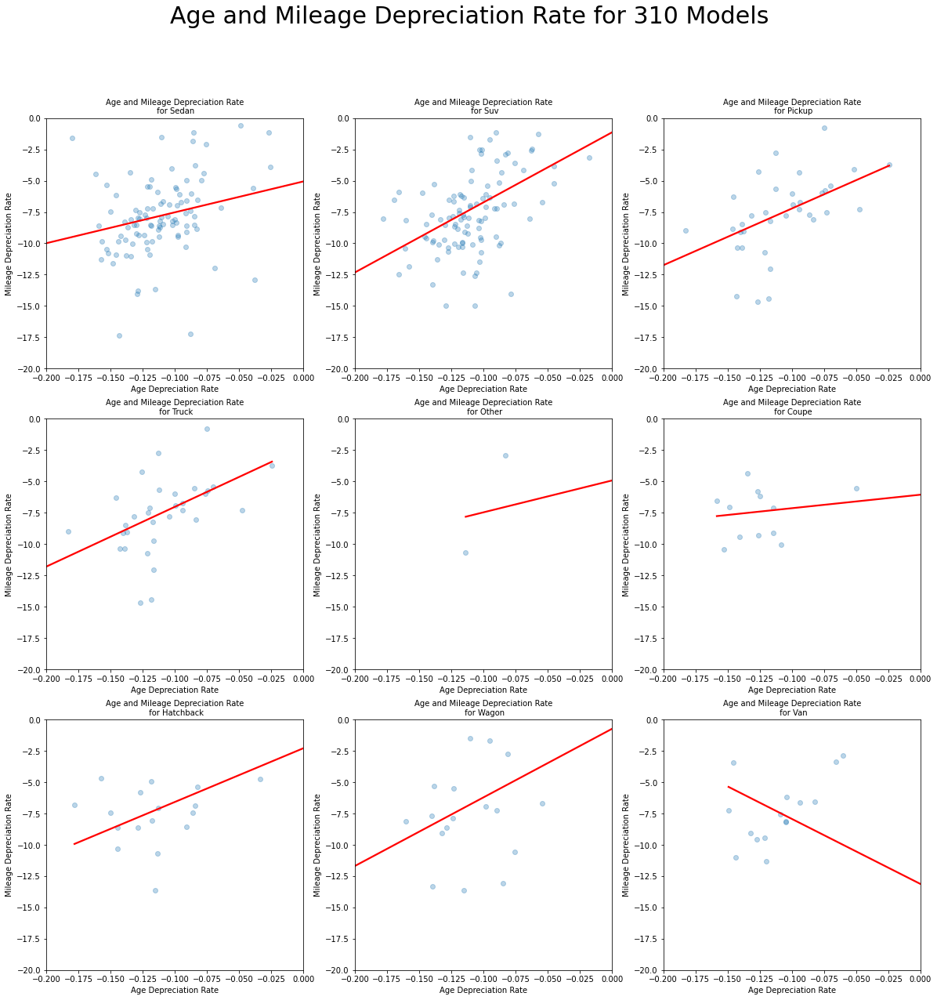

In [32]:
from collections import Counter
n = 3
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Age and Mileage Depreciation Rate for 310 Models", fontsize=30)
type_list = [x[0] for x in Counter(list(vehicle["type"])).most_common()]
type_list = [x for x in type_list if str(x) != 'nan'][:n**2]
for i in range(len(type_list)):
    car_type = type_list[i]
    new_df = df_4[df_4["types_str"].str.contains(car_type,case=False)]
    g = sns.regplot(x="age_depre_rate",y="mileage_depre_rate (*10**6)",\
    data=new_df,scatter_kws={'alpha':0.3},lowess=False,\
                         robust=True,ci=None,\
                        line_kws={"color": "red"},ax=axs[i//n,i%n])
    g.set_xlim([-0.2,0])
    g.set_ylim([-20,0])
    g.set_title("Age and Mileage Depreciation Rate\n for "+car_type.capitalize(), fontsize=10)
    g.set_xlabel("Age Depreciation Rate", fontsize=10)
    g.set_ylabel("Mileage Depreciation Rate", fontsize=10)

AttributeError: 'AxesSubplot' object has no attribute 'map_dataframe'

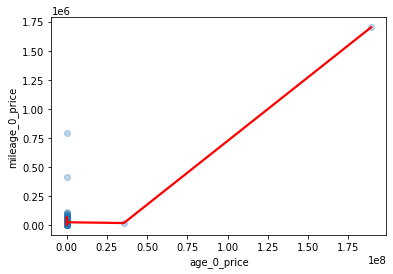

In [63]:
g = sns.regplot(x="age_0_price",y="mileage_0_price",\
data=df_4,scatter_kws={'alpha':0.3},lowess=True,\
                     robust=False,\
                    line_kws={"color": "red"})
g.map_dataframe(sns.lineplot, 'x', 'y_line', color='g')
g.set_xlim([0,100000])
g.set_ylim([0,100000])
g.set_title(" Prices for 310 Models of Cars When Age and Mileage are 0", fontsize=15)
g.set_xlabel("Price When Age is 0", fontsize=10)
g.set_ylabel("Price When Mileage is 0", fontsize=10)

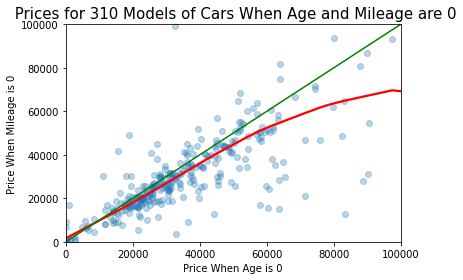

In [67]:
fig, ax = plt.subplots(figsize=(6, 4))
g = sns.regplot(x="age_0_price",y="mileage_0_price",\
data=df_4,scatter_kws={'alpha':0.3},lowess=True,\
                     robust=False,\
                    line_kws={"color": "red"}, ax=ax)
g.set_xlim([0,100000])
g.set_ylim([0,100000])
g.set_title(" Prices for 310 Models of Cars When Age and Mileage are 0", fontsize=15)
g.set_xlabel("Price When Age is 0", fontsize=10)
g.set_ylabel("Price When Mileage is 0", fontsize=10)
p2 = sns.lineplot(x=np.linspace(100000,10), y=np.linspace(100000,10), color='g', ax=ax)

Text(0, 0.5, 'Price When Mileage is 0')

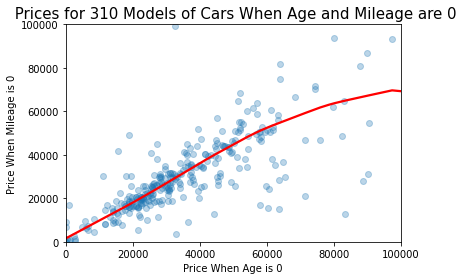

In [131]:
g = sns.regplot(x="age_0_price",y="mileage_0_price",\
data=df_4,scatter_kws={'alpha':0.3},lowess=True,\
                     robust=False,\
                    line_kws={"color": "red"})
g.set_xlim([0,100000])
g.set_ylim([0,100000])
g.set_title(" Prices for 310 Models of Cars When Age and Mileage are 0", fontsize=15)
g.set_xlabel("Price When Age is 0", fontsize=10)
g.set_ylabel("Price When Mileage is 0", fontsize=10)

Text(0, 0.5, 'Price When Mileage is 0')

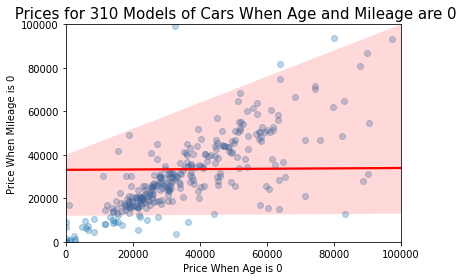

In [61]:
g = sns.regplot(x="age_0_price",y="mileage_0_price",\
data=df_4,scatter_kws={'alpha':0.3},lowess=False,\
                     robust=False,\
                    line_kws={"color": "red"})
g.set_xlim([0,100000])
g.set_ylim([0,100000])
g.set_title(" Prices for 310 Models of Cars When Age and Mileage are 0", fontsize=15)
g.set_xlabel("Price When Age is 0", fontsize=10)
g.set_ylabel("Price When Mileage is 0", fontsize=10)

Text(0, 0.5, 'Price When Mileage is 0')

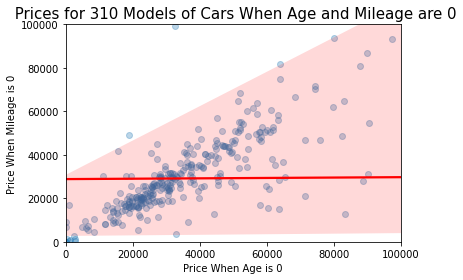

In [62]:
g = sns.regplot(x="age_0_price",y="mileage_0_price",\
data=df_4,scatter_kws={'alpha':0.3},lowess=False,\
                     robust=True,\
                    line_kws={"color": "red"})
g.set_xlim([0,100000])
g.set_ylim([0,100000])
g.set_title(" Prices for 310 Models of Cars When Age and Mileage are 0", fontsize=15)
g.set_xlabel("Price When Age is 0", fontsize=10)
g.set_ylabel("Price When Mileage is 0", fontsize=10)

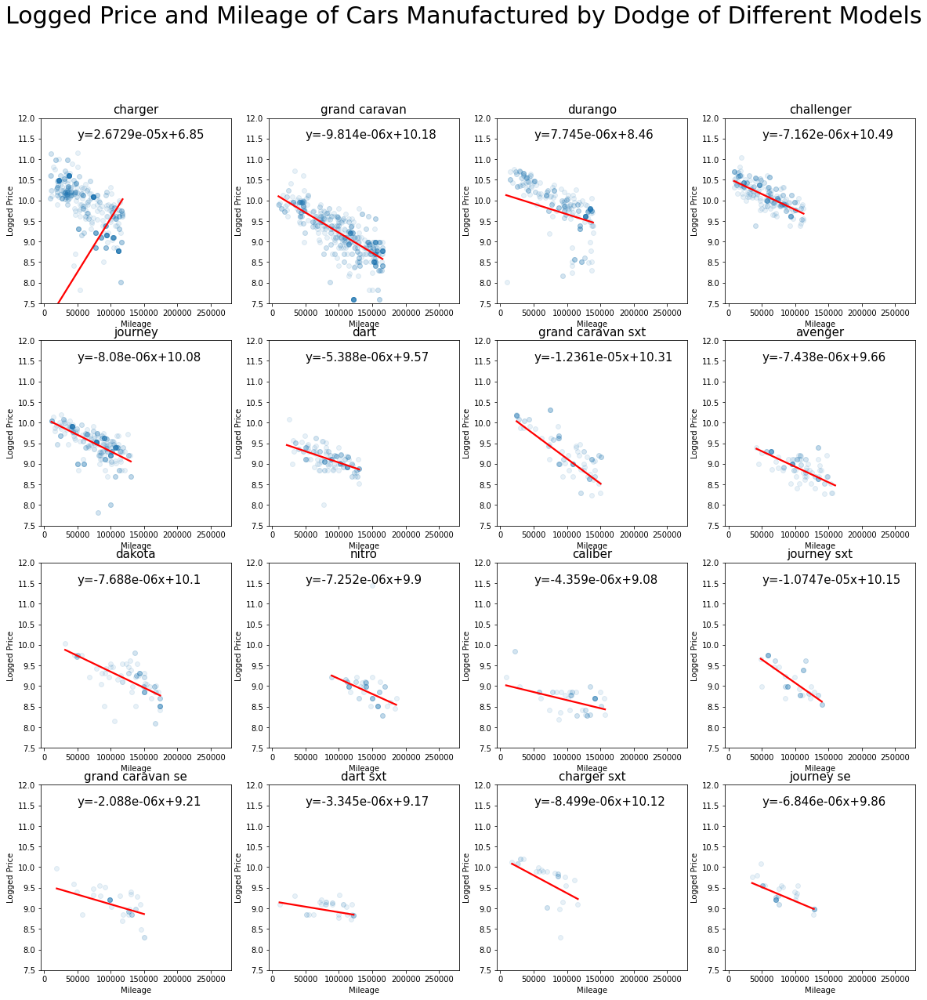

In [73]:
model="dodge"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Logged Price and Mileage of Cars Manufactured by "+\
             model.capitalize()+" of Different Models", fontsize=30)
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]] 
    df_1["log_price"] = np.log(df_1["price"])
    df_2 = df_1[(df_1["odometer"]>=8000) & (df_1["odometer"]<=300000)\
                & (df_1["odometer"]<=np.quantile(list(df_1["odometer"]), .85))]
    data = sm.datasets.stackloss.load()
    data.exog = sm.add_constant(data.exog)
    try:
        model1 = sm.RLM(df_2["log_price"], sm.add_constant(df_2["odometer"]),\
                        M=sm.robust.norms.HuberT(t=2)).fit()
    except:
        pass
    g1 = sns.regplot(x="odometer",y=np.log(df_2["price"]),data=df_2,ax=axs[i//n,i%n],\
                     scatter_kws={'alpha':0.1},lowess=False,\
                     robust=True,ci=None,\
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-5000,280000])
    g1.set_ylim([7.5,12])
    g1.set_xlabel("Mileage", fontsize=10)
    g1.set_ylabel("Logged Price", fontsize=10)
    try:
        g1.text(50000,11.5,"y="+str(round(model1.params["odometer"],9))+"x+"+\
                str(round(model1.params["const"],2)), fontsize=15)
    except:
        pass

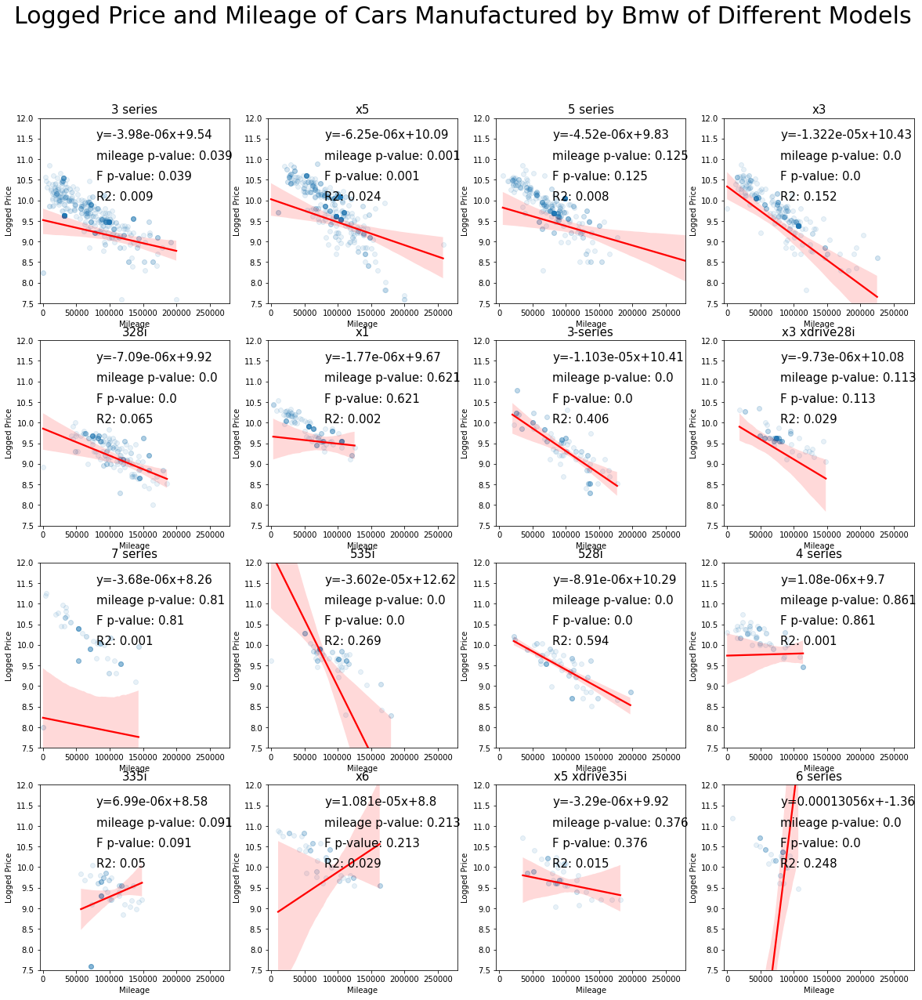

In [30]:
model="bmw"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Logged Price and Mileage of Cars Manufactured by "+model.capitalize()+" of Different Models", fontsize=30)
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"]
.astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]] 
    df_1["log_price"] = np.log(df_1["price"])
    df_2 = df_1[(df_1["odometer"]>=1000) & (df_1["odometer"]<=200000)]
    model1 = smf.ols('log_price ~ odometer', data=df_2).fit()
    g1 = sns.regplot(x="odometer",y=np.log(df_1["price"]),data=df_1,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1},lowess=False,\
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-5000,280000])
    g1.set_ylim([7.5,12])
    g1.set_xlabel("Mileage", fontsize=10)
    g1.set_ylabel("Logged Price", fontsize=10)
    g1.text(80000,11.5,"y="+str(round(model1.params["odometer"],8))+"x+"+str(round(model1.params["Intercept"],2)), fontsize=15)
    g1.text(80000,11,"mileage p-value: "+str(round(model1.pvalues["odometer"],3)), fontsize=15)
    g1.text(80000,10.5,"F p-value: "+str(round(model1.f_pvalue,3)), fontsize=15)
    g1.text(80000,10,"R2: "+str(round(model1.rsquared,3)), fontsize=15)

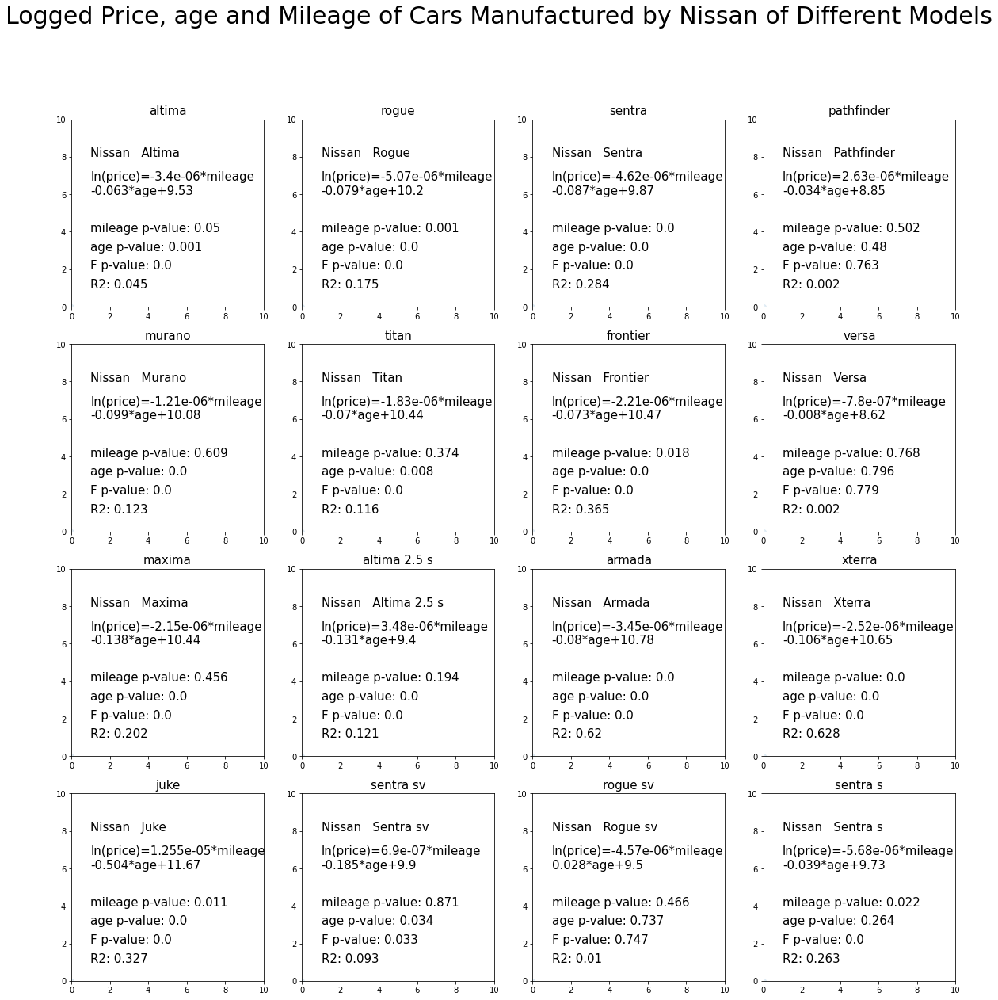

In [120]:
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
model="nissan"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Logged Price, age and Mileage of Cars Manufactured by "+\
             model.capitalize()+" of Different Models", fontsize=30)
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]] 
    df_1["log_price"] = np.log(df_1["price"])
    #pca_model = skd.PCA().fit(df_hept_norm.iloc[:,:7])
    df_2 = df_1[(df_1["odometer"]>=10) & (df_1["odometer"]<=300000)\
                & (df_1["age"]>=1) & (df_1["age"]<=20)]
    model1 = smf.ols('log_price ~ age + odometer', data=df_2).fit()
    g1 = sns.regplot(x=[0],y=[0],data=df_1,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1},lowess=True,\
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([0,10])
    g1.set_ylim([0,10])
    g1.set_xlabel("", fontsize=10)
    g1.set_ylabel("", fontsize=10)
    g1.text(1,8,model.capitalize()+"   "+car_list[i].capitalize(), fontsize=15)
    g1.text(1,6,"ln(price)="+str(round(model1.params["odometer"],8))+"*mileage\n"\
            +str(round(model1.params["age"],3))+"*age+"\
            +str(round(model1.params["Intercept"],2)), fontsize=15)
    g1.text(1,4,"mileage p-value: "+str(round(model1.pvalues["odometer"],3)), fontsize=15)
    g1.text(1,3,"age p-value: "+str(round(model1.pvalues["age"],3)), fontsize=15)
    g1.text(1,2,"F p-value: "+str(round(model1.f_pvalue,3)), fontsize=15)
    g1.text(1,1,"R2: "+str(round(model1.rsquared,3)), fontsize=15)

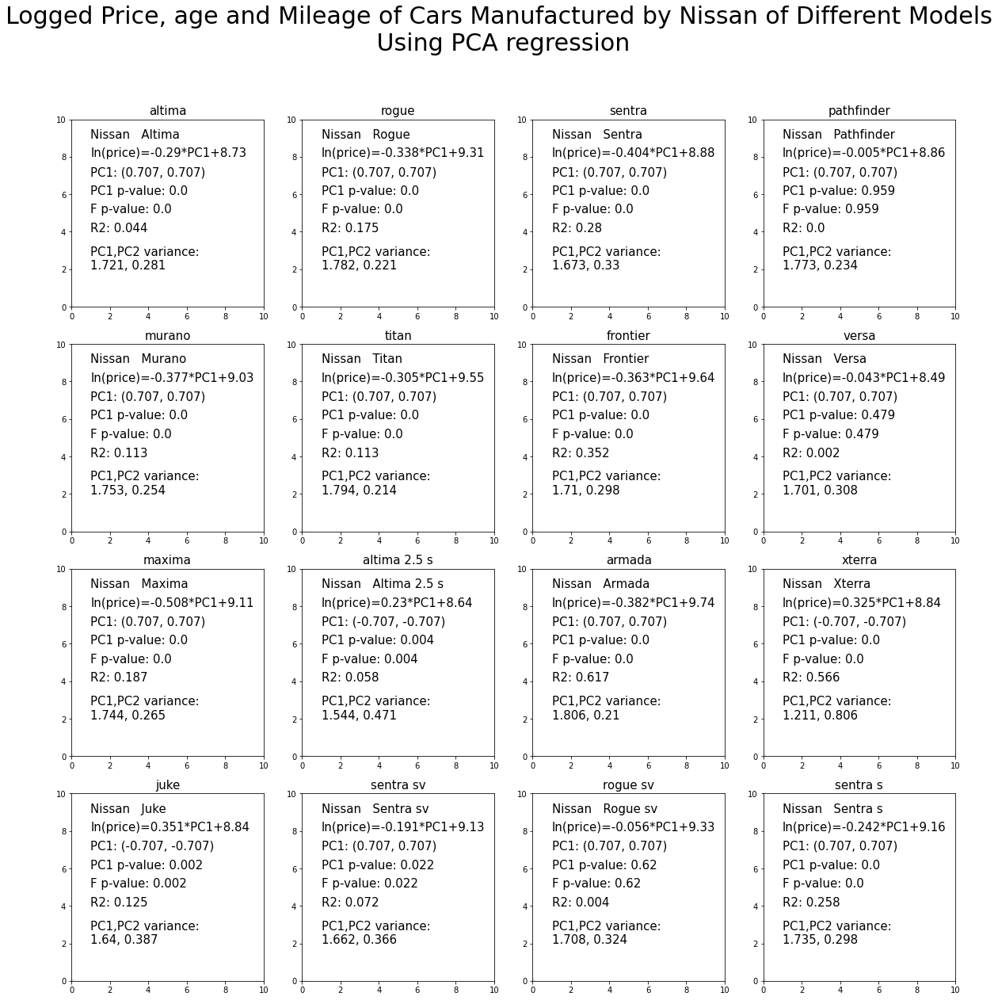

In [117]:
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
import sklearn.decomposition as skd
import sklearn.preprocessing as skp

model="nissan"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Logged Price, age and Mileage of Cars Manufactured by "+\
             model.capitalize()+" of Different Models\n Using PCA regression", fontsize=30)
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]] 
    df_1["log_price"] = np.log(df_1["price"])
    #pca_model = skd.PCA().fit(df_hept_norm.iloc[:,:7])
    df_2 = df_1[(df_1["odometer"]>=10) & (df_1["odometer"]<=300000)\
                & (df_1["age"]>=1) & (df_1["age"]<=20)]
    df_2[["price","age","odometer"]] = df_2[["price","age","odometer"]].astype(float)
    df_2[["price","age","odometer"]] = skp.scale(df_2[["price","age","odometer"]])
    df_2 = df_2[["model","price","log_price","age","odometer"]]
    pca_model = skd.PCA().fit(df_2[["age","odometer"]])
    df_2[["PC1","PC2"]] = pca_model.transform(df_2[["age","odometer"]])
    model1 = smf.ols('log_price ~ PC1', data=df_2).fit()
    g1 = sns.regplot(x=[0],y=[0],data=df_1,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1},lowess=True,\
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([0,10])
    g1.set_ylim([0,10])
    g1.set_xlabel("", fontsize=10)
    g1.set_ylabel("", fontsize=10)
    g1.text(1,9,model.capitalize()+"   "+car_list[i].capitalize(), fontsize=15)
    g1.text(1,8,"ln(price)="\
            +str(round(model1.params["PC1"],3))+"*PC1+"\
            +str(round(model1.params["Intercept"],2)), fontsize=15)
    g1.text(1,7,"PC1: ("+str(round(pca_model.components_[0][0],3))\
            +", "+str(round(pca_model.components_[0][1],3))+")", fontsize=15)
    g1.text(1,6,"PC1 p-value: "+str(round(model1.pvalues["PC1"],3)), fontsize=15)
    g1.text(1,5,"F p-value: "+str(round(model1.f_pvalue,3)), fontsize=15)
    g1.text(1,4,"R2: "+str(round(model1.rsquared,3)), fontsize=15)
    g1.text(1,2,"PC1,PC2 variance: \n"+str(round(pca_model.explained_variance_[0],3))\
            +", "+str(round(pca_model.explained_variance_[1],3)), fontsize=15)

In [ ]:
model="ford"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Logged Price and Mileage of Cars Manufactured by "+model.capitalize()+" of Different Models", fontsize=30)
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]] 
    df_1["log_price"] = np.log(df_1["price"])
    df_2 = df_1[(df_1["odometer"]>=1000) & (df_1["odometer"]<=200000)]
    model1 = smf.ols('odometer ~ age', data=df_2).fit()
    g1 = sns.regplot(x="odometer",y=np.log(df_1["price"]),data=df_1,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1},lowess=True,\
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-5000,280000])
    g1.set_ylim([7.5,12])
    g1.set_xlabel("Age", fontsize=10)
    g1.set_ylabel("Mileage", fontsize=10)
    g1.text(80000,11.5,"y="+str(round(model1.params["odometer"],8))+"x+"+str(round(model1.params["Intercept"],2)), fontsize=15)
    g1.text(80000,11,"Age p-value: "+str(round(model1.pvalues["odometer"],3)), fontsize=15)

Price and Logged Age of Cars Manufactured by Chevrolet of Different Models


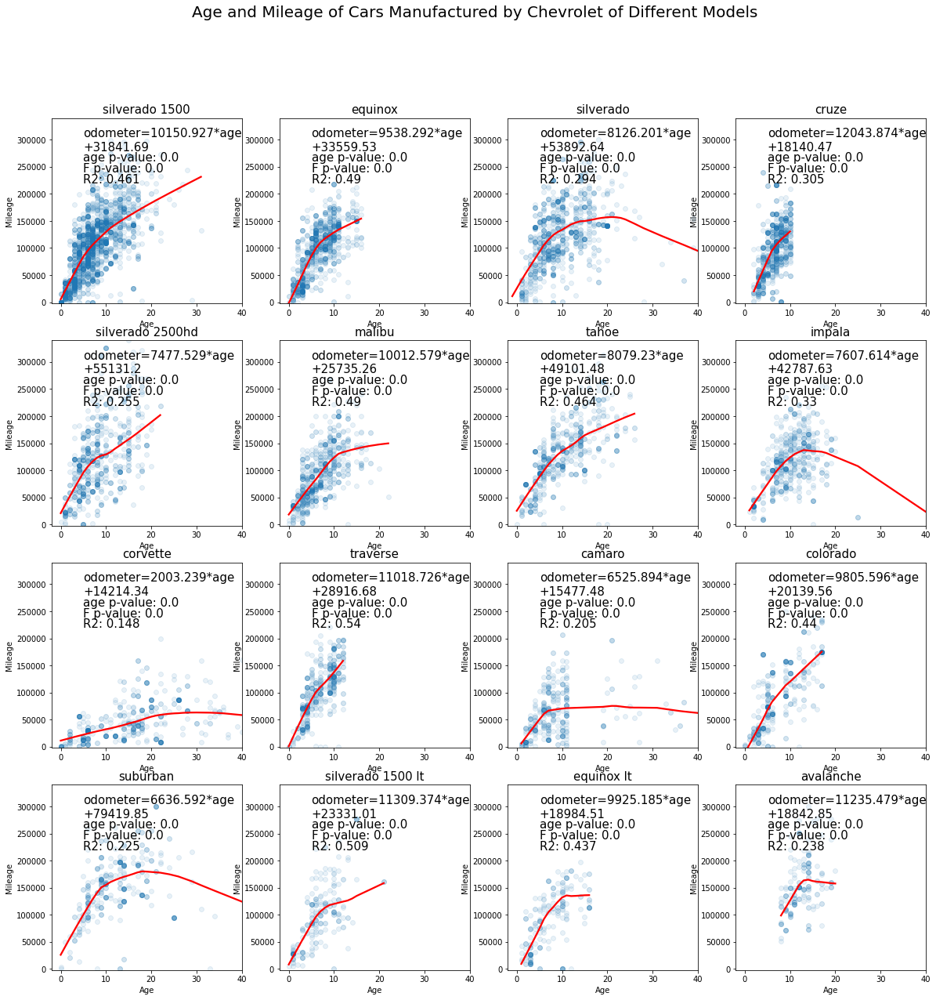

In [81]:
model="chevrolet"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Age and Mileage of Cars Manufactured by "+model.capitalize()+" of Different Models", fontsize=20)
print("Price and Logged Age of Cars Manufactured by "+model.capitalize()+" of Different Models")
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]]
    df_2 = df_1[(df_1["odometer"]>=10) & (df_1["odometer"]<=300000)\
                & (df_1["age"]>=1) & (df_1["age"]<=15)]
    model1 = smf.ols('odometer ~ age', data=df_2).fit()
    g1 = sns.regplot(x="age",y="odometer",data=df_1,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1}\
                     ,lowess=True, \
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-2,40])
    g1.set_ylim([-2000,340000])
    g1.set_xlabel("Age")
    g1.set_ylabel("Mileage")
    g1.text(5,280000,"odometer="+str(round(model1.params["age"],3))+"*age\n+"\
            +str(round(model1.params["Intercept"],2)), fontsize=15)
    g1.text(5,260000,"age p-value: "+str(round(model1.pvalues["age"],3)), fontsize=15)
    g1.text(5,240000,"F p-value: "+str(round(model1.f_pvalue,3)), fontsize=15)
    g1.text(5,220000,"R2: "+str(round(model1.rsquared,3)), fontsize=15)

Price and Logged Age of Cars Manufactured by Ford of Different Models


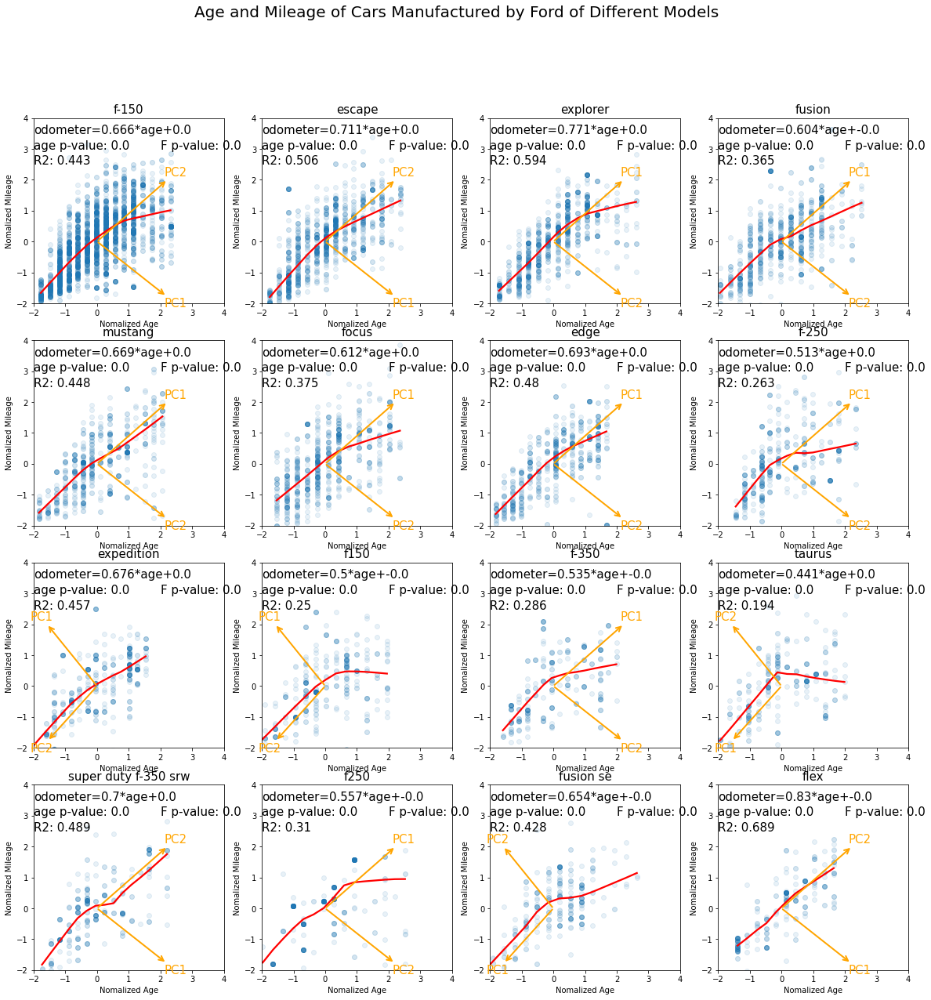

In [141]:
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
import sklearn.decomposition as skd
import sklearn.preprocessing as skp

model="ford"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Age and Mileage of Cars Manufactured by "+model.capitalize()+" of Different Models", fontsize=20)
print("Price and Logged Age of Cars Manufactured by "+model.capitalize()+" of Different Models")
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]]
    df_2 = df_1[(df_1["odometer"]>=10) & (df_1["odometer"]<=300000)\
                & (df_1["age"]>=1) & (df_1["age"]<=15)]
    df_2[["price","age","odometer"]] = df_2[["price","age","odometer"]].astype(float)
    df_2[["price","age","odometer"]] = skp.scale(df_2[["price","age","odometer"]])
    df_2["log_price"] = np.log(df_2["price"])
    df_2 = df_2[["model","price","log_price","age","odometer"]]
    pca_model = skd.PCA().fit(df_2[["age","odometer"]])
    df_2[["PC1","PC2"]] = pca_model.transform(df_2[["age","odometer"]])
    model1 = smf.ols('odometer ~ age', data=df_2).fit()
    g1 = sns.regplot(x="age",y="odometer",data=df_2,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1}\
                     ,lowess=True, \
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-2,4])
    g1.set_ylim([-2,4])
    g1.set_xlabel("Nomalized Age")
    g1.set_ylabel("Nomalized Mileage")
    # Scatterplot of disaggregated data

    # Add variable unit vector projections
    X = pca_model.transform(df_2[["age","odometer"]])
    V = pca_model.transform(np.identity(X.shape[1]))
    for i, v in enumerate(V):
        g1.annotate(df_2[["PC1","PC2"]].columns[i], 
                     xy=(0,0), xytext=v[:2]*3, 
                     fontsize=15, color='orange',
                     arrowprops=dict(
                        arrowstyle='<-', linewidth=2, color='orange'))
    g1.text(-2,3.5,"odometer="+str(round(model1.params["age"],3))+"*age+"\
            +str(round(model1.params["Intercept"],2)), fontsize=15)
    g1.text(-2,3,"age p-value: "+str(round(model1.pvalues["age"],3)), fontsize=15)
    g1.text(2,3,"F p-value: "+str(round(model1.f_pvalue,3)), fontsize=15)
    g1.text(-2,2.5,"R2: "+str(round(model1.rsquared,3)), fontsize=15)

Price and Logged Age of Cars Manufactured by Nissan of Different Models


/tmp/ipykernel_1568744/1396034511.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_1568744/1396034511.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_1568744/1396034511.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

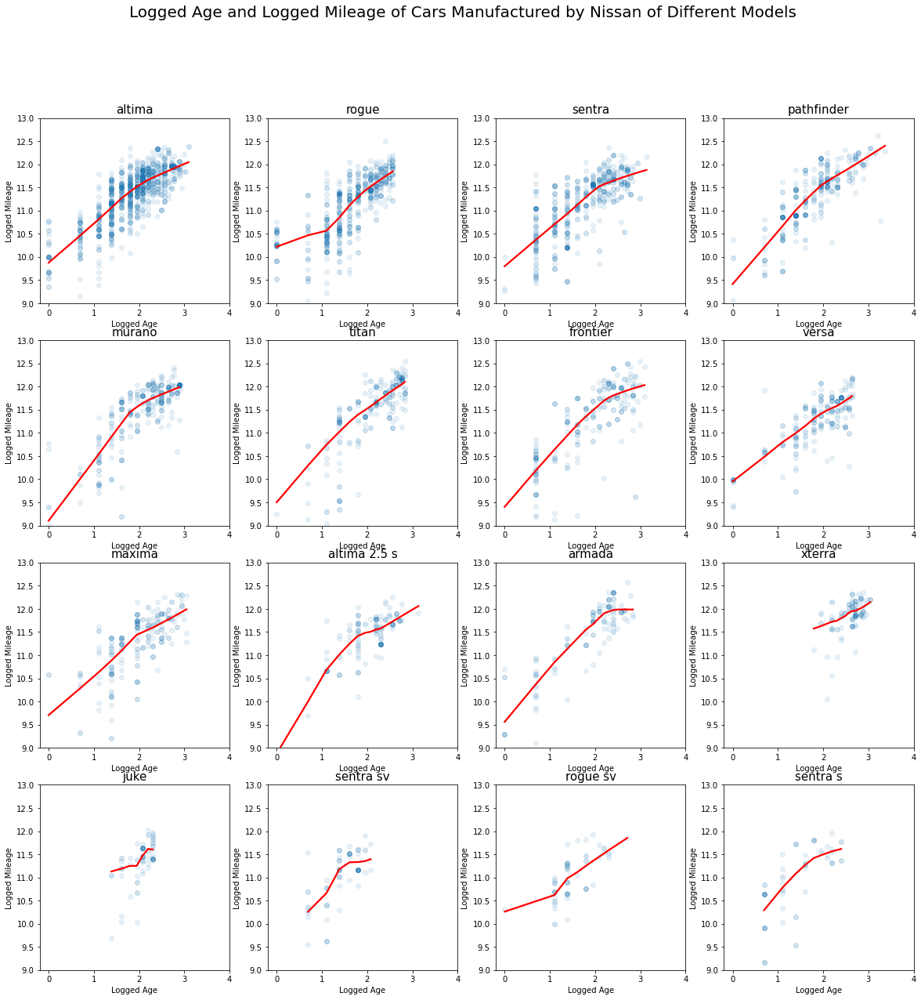

In [127]:
model="nissan"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Logged Age and Logged Mileage of Cars Manufactured by "+model.capitalize()+" of Different Models", fontsize=20)
print("Price and Logged Age of Cars Manufactured by "+model.capitalize()+" of Different Models")
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]]
    g1 = sns.regplot(x=np.log(df_1["age"]),y=np.log(df_1["odometer"]),data=df_1,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1}\
                     ,lowess=True, \
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-0.2,4])
    g1.set_ylim([9,13])
    g1.set_xlabel("Logged Age")
    g1.set_ylabel("Logged Mileage")

In [35]:
Counter(list(vehicle_1[vehicle_1["manufacturer"].notna()]["manufacturer"])).most_common()[:20]

[('ford', 25651),
 ('chevrolet', 18388),
 ('toyota', 11116),
 ('honda', 7005),
 ('nissan', 6750),
 ('ram', 6604),
 ('jeep', 6560),
 ('gmc', 5477),
 ('dodge', 4679),
 ('bmw', 4401),
 ('hyundai', 3558),
 ('mercedes-benz', 3478),
 ('subaru', 3394),
 ('kia', 2952),
 ('volkswagen', 2559),
 ('lexus', 2320),
 ('chrysler', 2134),
 ('cadillac', 2086),
 ('audi', 2019),
 ('mazda', 1602)]

Price and Logged Age of Cars Manufactured by Bmw of Different Models


/tmp/ipykernel_2639724/3918321930.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_2639724/3918321930.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_2639724/3918321930.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

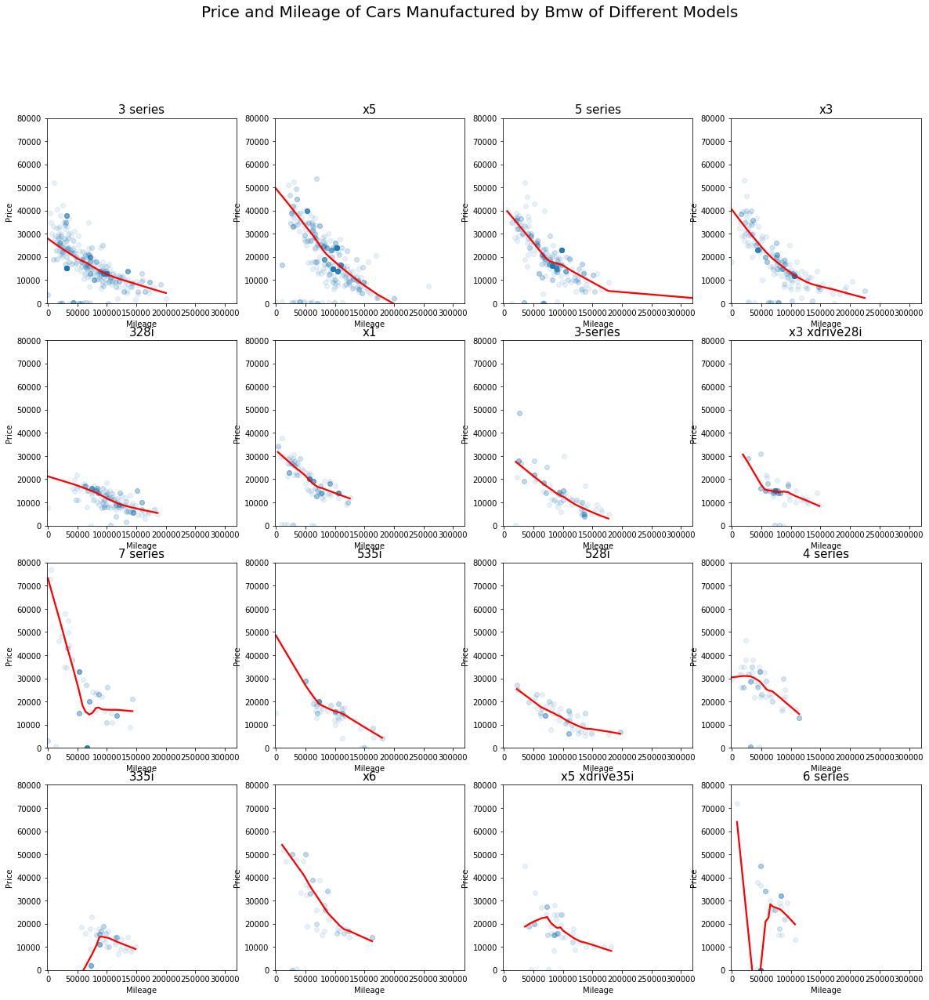

In [42]:
model="bmw"
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Price and Mileage of Cars Manufactured by "+model.capitalize()+" of Different Models", fontsize=20)
print("Price and Logged Age of Cars Manufactured by "+model.capitalize()+" of Different Models")
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]]
    g1 = sns.regplot(x="odometer",y="price",data=df_1,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1},lowess=True, \
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-2000,320000])
    g1.set_ylim([0,80000])
    g1.set_xlabel("Mileage")
    g1.set_ylabel("Price")

/tmp/ipykernel_2639724/3083148546.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_2639724/3083148546.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_2639724/3083148546.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

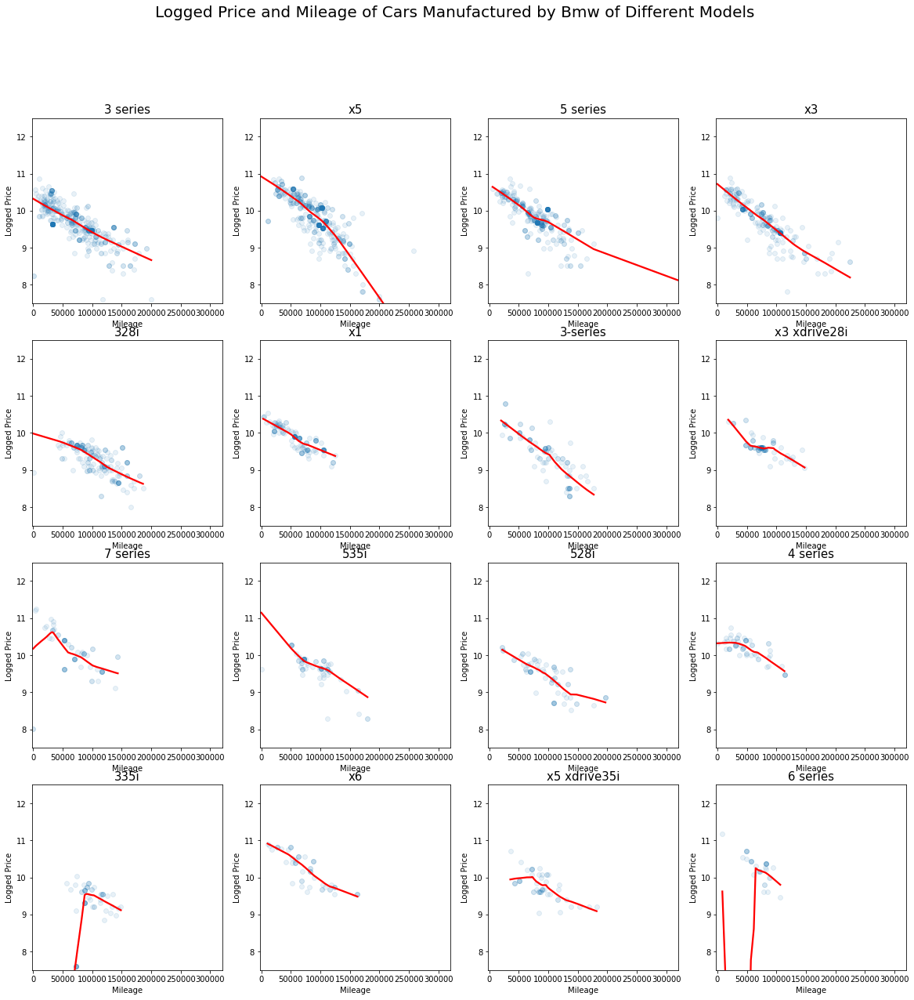

In [43]:
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Logged Price and Mileage of Cars Manufactured by "+model.capitalize()+" of Different Models", fontsize=20)
df = vehicle_1[vehicle_1["manufacturer"]==model]
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)
car_list = [x[0] for x in Counter(list(df[df["model"].notna()]\
                                       ["model"])).most_common()][:n**2]
for i in range(len(car_list)):
    df_1 = vehicle_1[vehicle_1["model"]==car_list[i]]
    g1 = sns.regplot(x="odometer",y=np.log(df_1["price"]),data=df_1,ax=axs[i//n,i%n],scatter_kws={'alpha':0.1},lowess=True, \
                     line_kws={"color": "red"})
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-2000,320000])
    g1.set_ylim([7.5,12.5])
    g1.set_xlabel("Mileage")
    g1.set_ylabel("Logged Price")

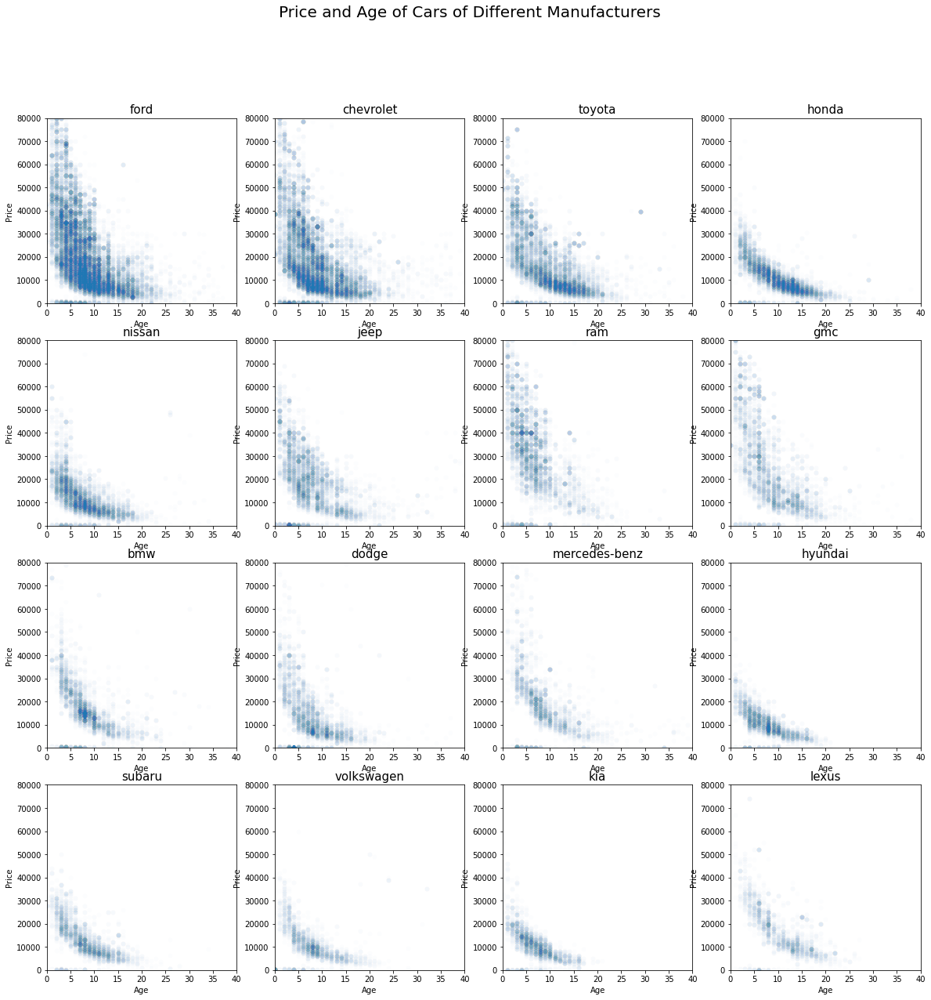

In [53]:
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Price and Age of Cars Manufactured by Ford of Different Models", fontsize=20)
for i in range(len(car_list))[:n**2]:
    df_1 = vehicle_1[vehicle_1["manufacturer"]==car_list[i]]
    g1 = sns.scatterplot(x="age",y="price",data=df_1,ax=axs[i//n,i%n],alpha=0.01)
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([0,40])
    g1.set_ylim([0,80000])
    g1.set_xlabel("Age")
    g1.set_ylabel("Price")

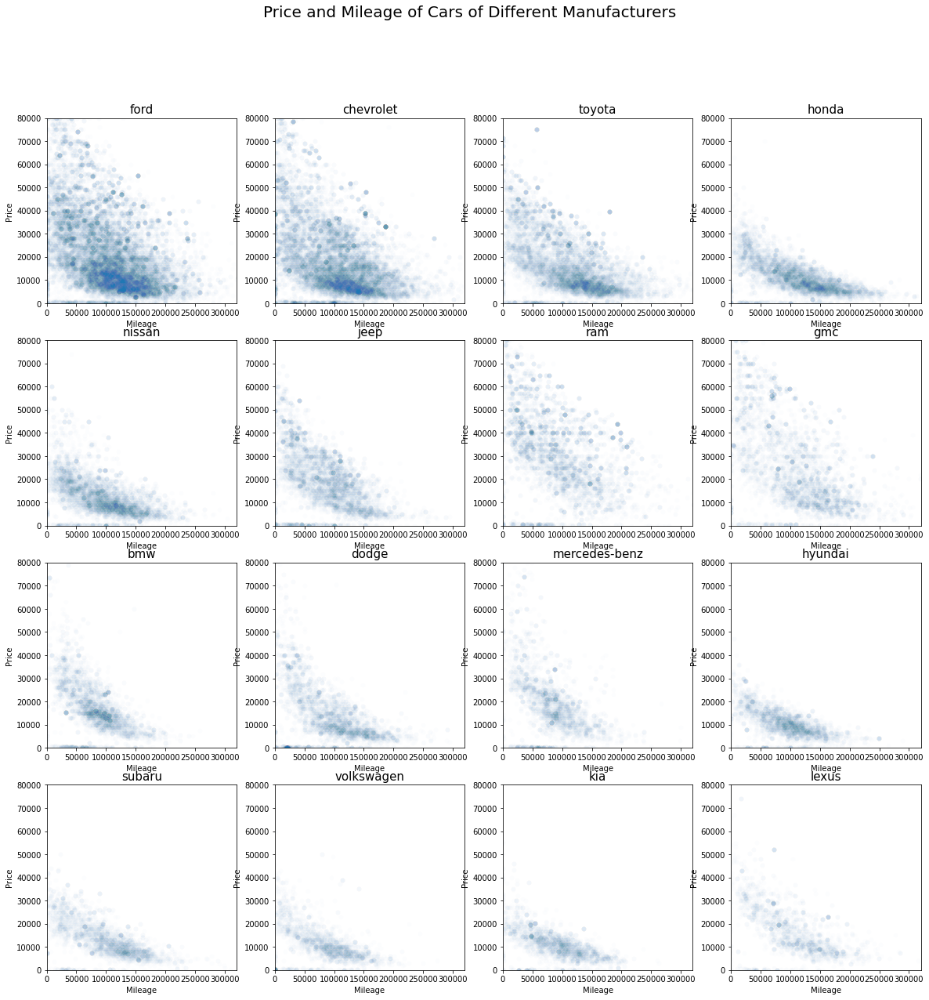

In [55]:
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Price and Mileage of Cars of Different Manufacturers", fontsize=20)
for i in range(len(car_list))[:n**2]:
    df_1 = vehicle_1[vehicle_1["manufacturer"]==car_list[i]]
    g1 = sns.scatterplot(x="odometer",y="price",data=df_1,ax=axs[i//n,i%n],alpha=0.01)
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([0,320000])
    g1.set_ylim([0,80000])
    g1.set_xlabel("Mileage")
    g1.set_ylabel("Price")

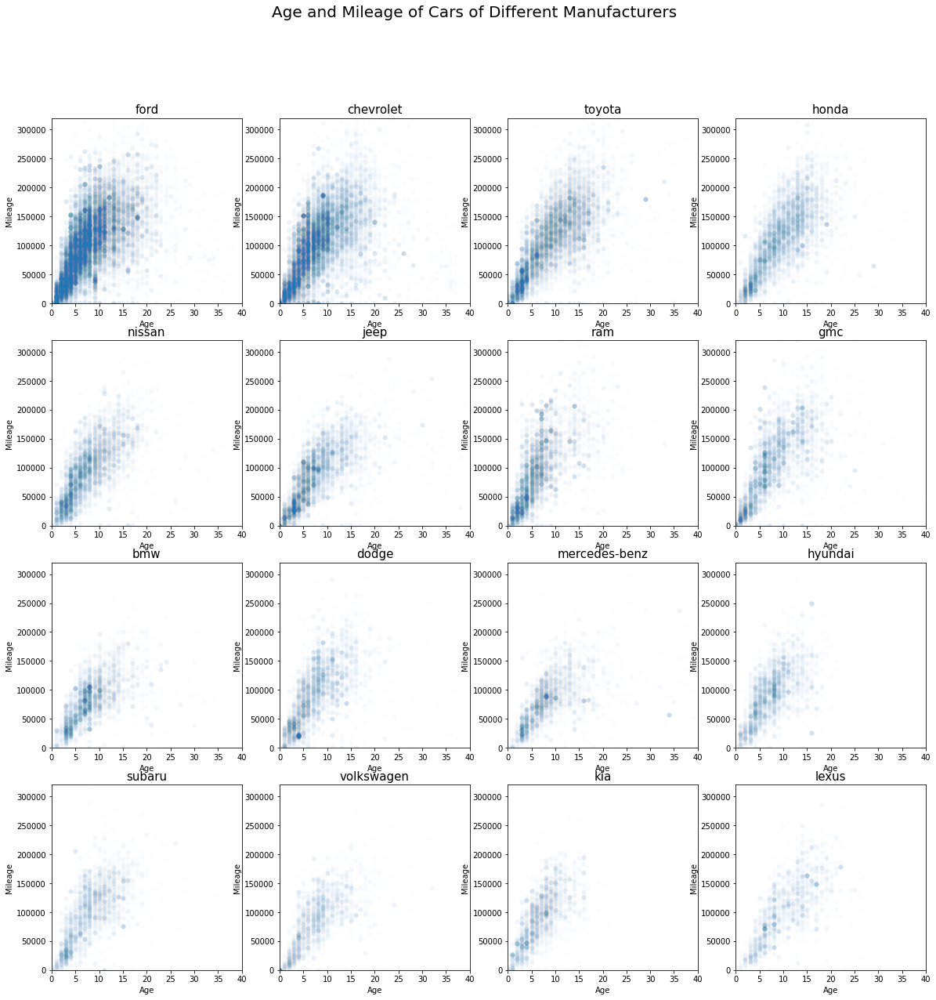

In [57]:
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Age and Mileage of Cars of Different Manufacturers", fontsize=20)
for i in range(len(car_list))[:n**2]:
    df_1 = vehicle_1[vehicle_1["manufacturer"]==car_list[i]]
    g1 = sns.scatterplot(x="age",y="odometer",data=df_1,ax=axs[i//n,i%n],alpha=0.01)
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([0,40])
    g1.set_ylim([0,320000])
    g1.set_xlabel("Age")
    g1.set_ylabel("Mileage")

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402:

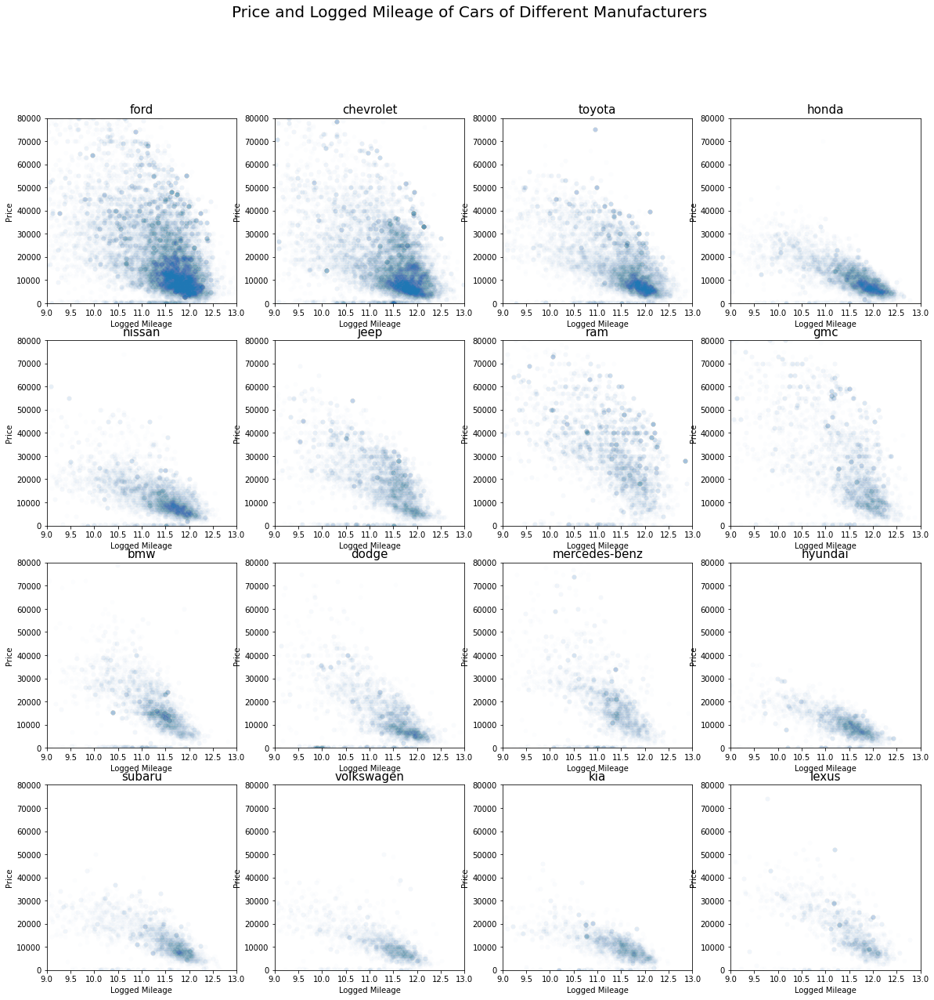

In [59]:
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Price and Logged Mileage of Cars of Different Manufacturers", fontsize=20)
for i in range(len(car_list))[:n**2]:
    df_1 = vehicle_1[vehicle_1["manufacturer"]==car_list[i]]
    g1 = sns.scatterplot(x=np.log(df_1["odometer"]),y="price",data=df_1,ax=axs[i//n,i%n],alpha=0.01)
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([9,13])
    g1.set_ylim([0,80000])
    g1.set_xlabel("Logged Mileage")
    g1.set_ylabel("Price")

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: R

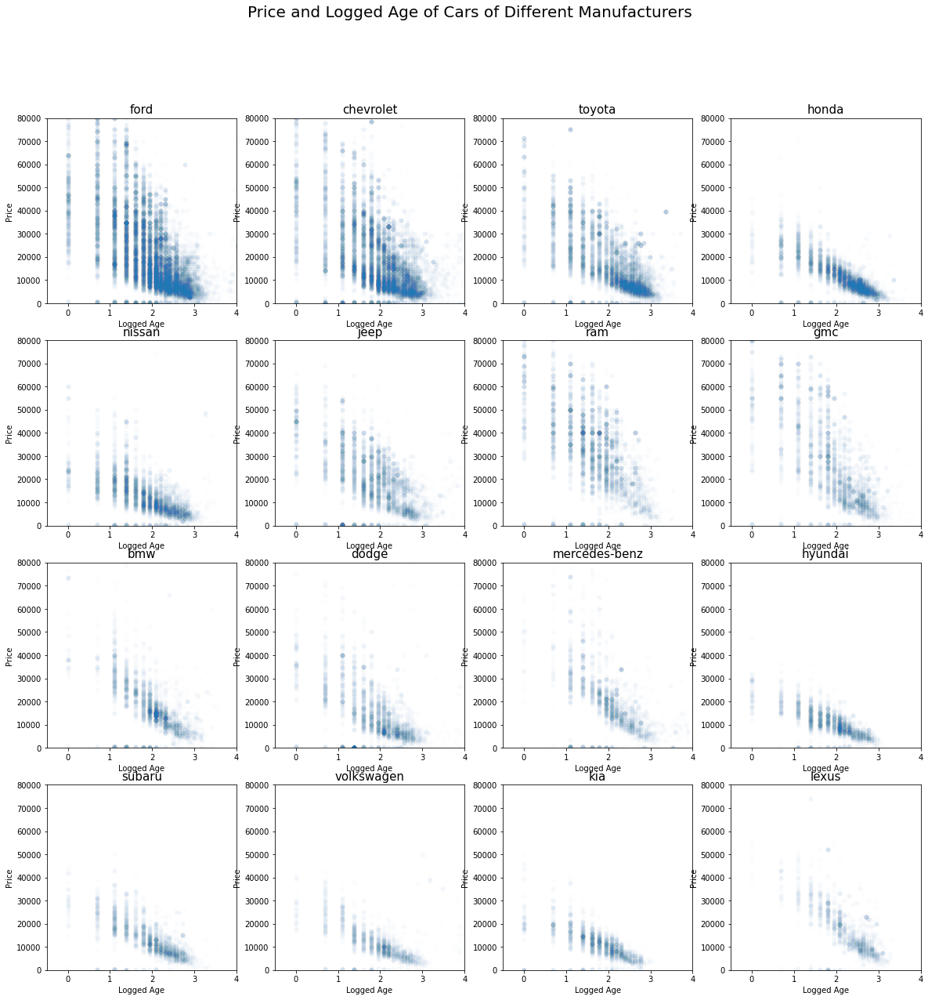

In [61]:
import numpy as np
n = 4
fig, axs = plt.subplots(n, n, figsize=(20, 20))
fig.suptitle("Price and Logged Age of Cars of Different Manufacturers", fontsize=20)
for i in range(len(car_list))[:n**2]:
    df_1 = vehicle_1[vehicle_1["manufacturer"]==car_list[i]]
    g1 = sns.scatterplot(x=np.log(df_1["age"]),y="price",data=df_1,ax=axs[i//n,i%n],alpha=0.01)
    g1.set_title(car_list[i], fontsize=15)
    g1.set_xlim([-0.5,4])
    g1.set_ylim([0,80000])
    g1.set_xlabel("Logged Age")
    g1.set_ylabel("Price")

Text(0.5, 1.0, 'Correlation Matrix of Cars')

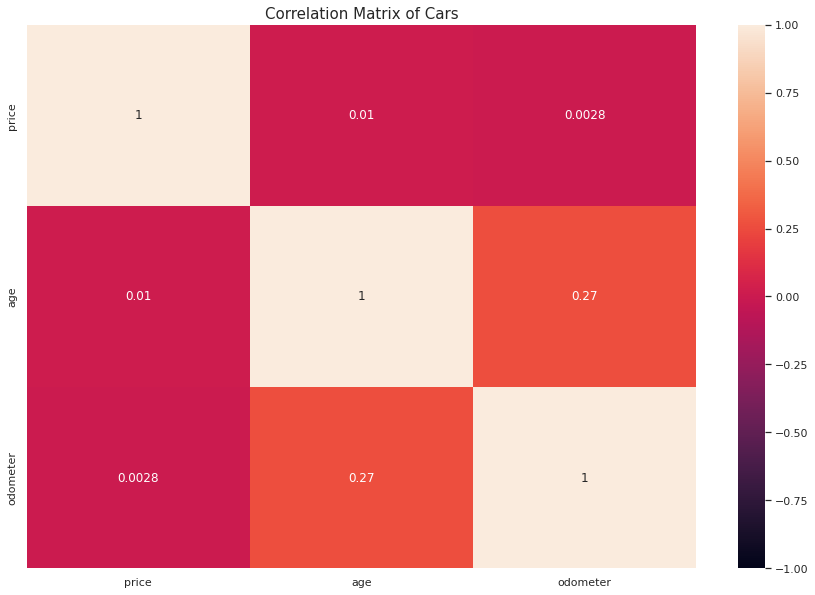

In [59]:
matrix_8 = vehicle_1[["price", "age", "odometer"]].corr()
g8 = sns.heatmap(matrix_8,annot=True, vmin=-1, vmax=1)
g8.set_title('Correlation Matrix of Cars', fontsize=15)

Text(0.5, 0, 'Conditions')

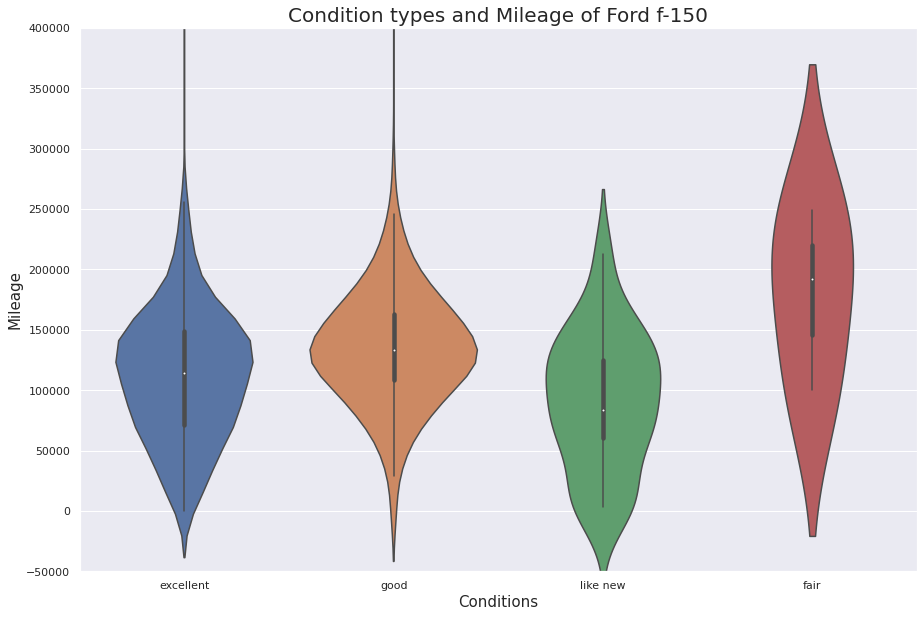

In [32]:
sns.set(rc={'figure.figsize':(15,10)})
ax = sns.violinplot(data=df, x="condition", y="odometer")
ax.set_ylim([-50000, 400000]) 
ax.set_title("Condition types and Mileage of Ford f-150",fontsize=20) 
ax.set_ylabel("Mileage",fontsize=15)
ax.set_xlabel("Conditions",fontsize=15)

Text(0.5, 0, 'Conditions')

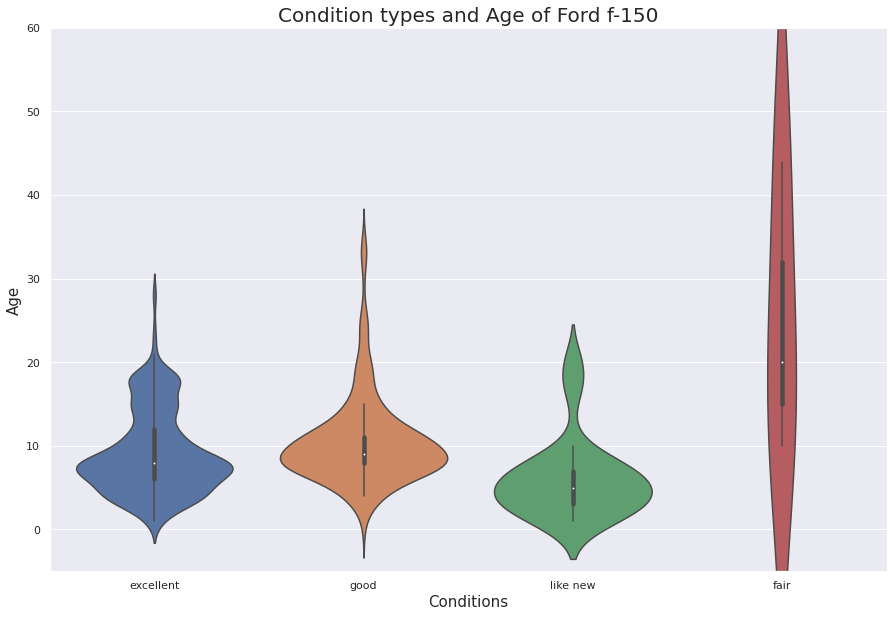

In [33]:
sns.set(rc={'figure.figsize':(15,10)})
ax = sns.violinplot(data=df, x="condition", y="age")
ax.set_ylim([-5, 60]) 
ax.set_title("Condition types and Age of Ford f-150",fontsize=20) 
ax.set_ylabel("Age",fontsize=15)
ax.set_xlabel("Conditions",fontsize=15)

Text(0.5, 0, 'Conditions')

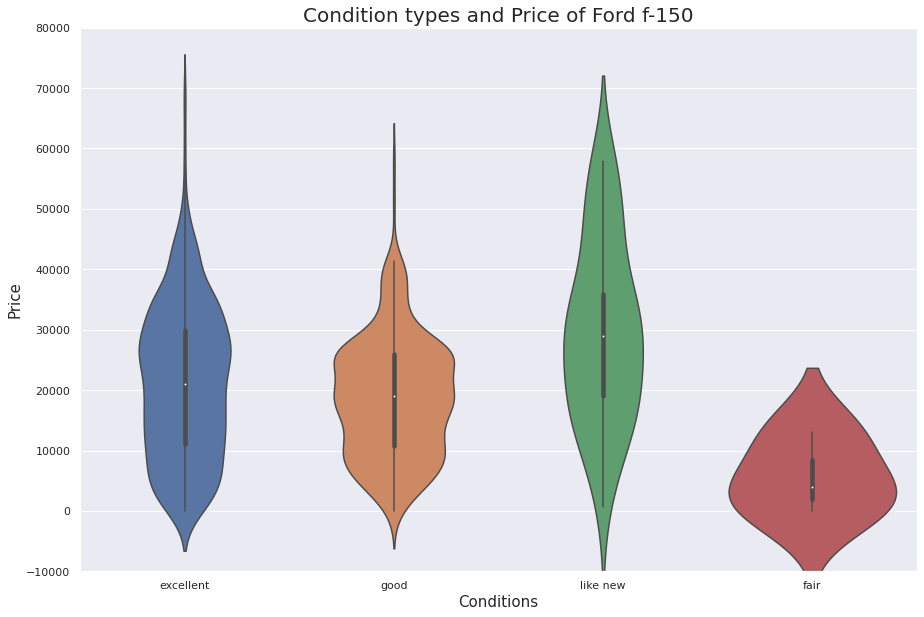

In [38]:
sns.set(rc={'figure.figsize':(15,10)})
ax = sns.violinplot(data=df, x="condition", y="price")
ax.set_ylim([-10000, 80000]) 
ax.set_title("Condition types and Price of Ford f-150",fontsize=20) 
ax.set_ylabel("Price",fontsize=15)
ax.set_xlabel("Conditions",fontsize=15)

In [38]:
from collections import Counter
Counter(df["condition"])

Counter({'good': 949,
         'excellent': 1773,
         'like new': 237,
         'fair': 134,
         'salvage': 11,
         'new': 8})

In [39]:
Counter(df["fuel"])

Counter({'gas': 3097, 'diesel': 3, 'other': 11, 'hybrid': 1})

In [40]:
Counter(df["cylinders"])

Counter({'8 cylinders': 1372,
         '6 cylinders': 926,
         nan: 791,
         '3 cylinders': 1,
         '10 cylinders': 11,
         '4 cylinders': 8,
         'other': 3})

In [41]:
Counter(df["type"])

Counter({'truck': 1527,
         'pickup': 1169,
         nan: 378,
         'van': 7,
         'other': 16,
         'sedan': 6,
         'offroad': 3,
         'hatchback': 1,
         'coupe': 1,
         'SUV': 4})

<AxesSubplot: xlabel='age', ylabel='Count'>

<Figure size 1080x360 with 0 Axes>

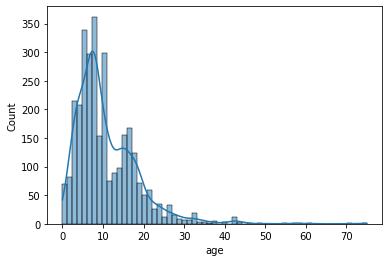

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
fig, ax = plt.subplots()
sns.histplot(df["age"],kde=True,ax=ax)

(-5.0, 50.0)

<Figure size 1080x360 with 0 Axes>

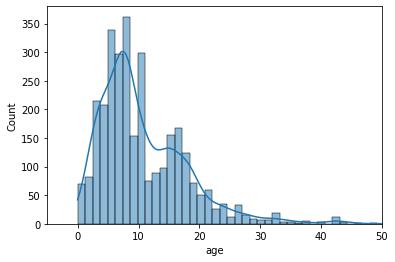

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
fig, ax = plt.subplots()
sns.histplot(df["age"],kde=True,ax=ax)
ax.set_xlim(-5,50)

(-5000.0, 500000.0)

<Figure size 1440x360 with 0 Axes>

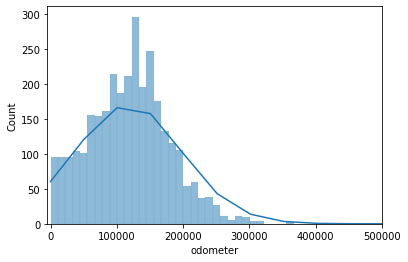

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(20,5))
fig, ax = plt.subplots()
sns.histplot(df["odometer"],kde=True, ax=ax)
ax.set_xlim(-5000, 500000)

(-5000.0, 300000.0)

<Figure size 1440x360 with 0 Axes>

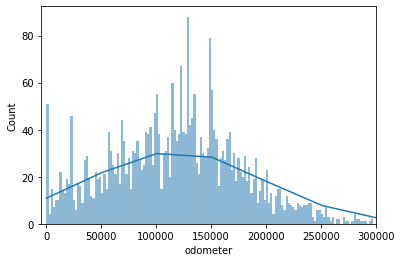

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(20,5))
fig, ax = plt.subplots()
sns.histplot(df["odometer"],kde=True, ax=ax,binwidth=2000)
ax.set_xlim(-5000, 300000)

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


(0.0, 20.0)

<Figure size 1440x360 with 0 Axes>

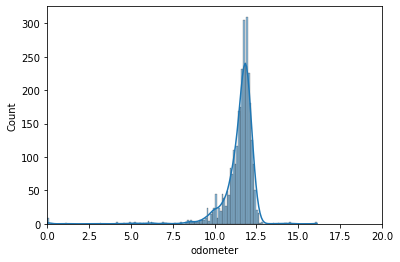

In [47]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
logged_odometer = np.log(df["odometer"])
plt.figure(figsize=(20,5))
fig, ax = plt.subplots()
sns.histplot(logged_odometer,kde=True, ax=ax)
ax.set_xlim(0, 20)

<AxesSubplot: xlabel='odometer', ylabel='Count'>

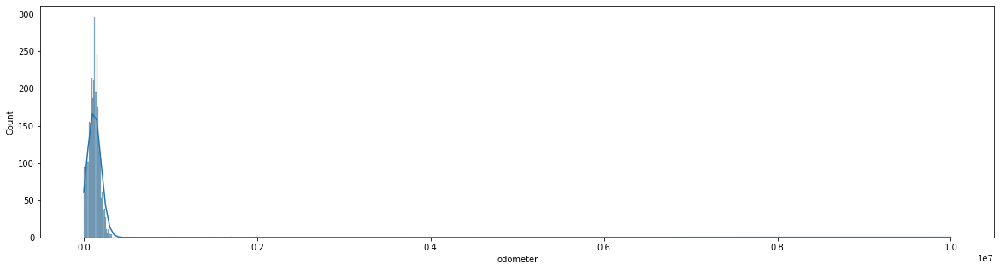

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(20,5))
sns.histplot(df["odometer"],kde=True)

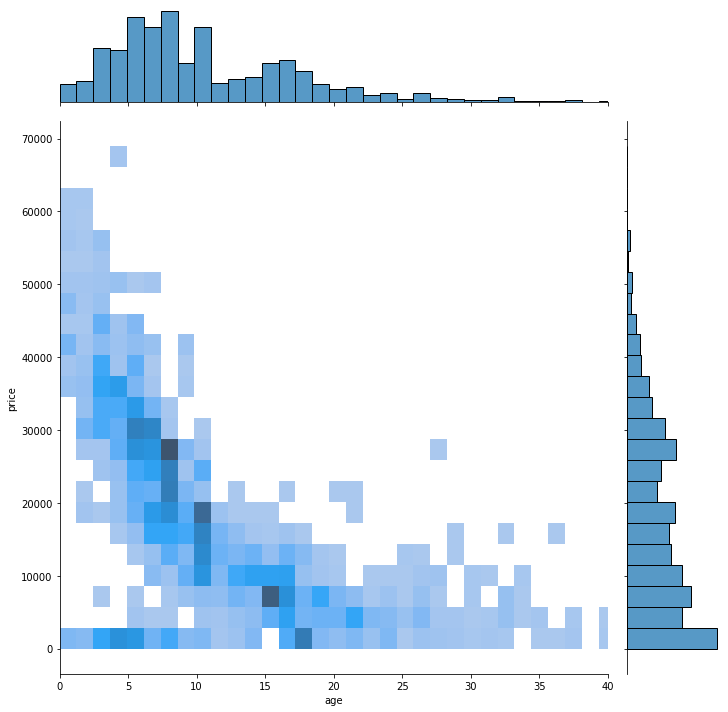

In [69]:
sns.jointplot(x='age',y='price',data=df,kind="hist",height=10,xlim=(0,40))

/tmp/ipykernel_2985797/4078052607.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x='age',y='price',data=df,cmap="Reds", shade=True, bw_adjust=.5)


<AxesSubplot: xlabel='age', ylabel='price'>

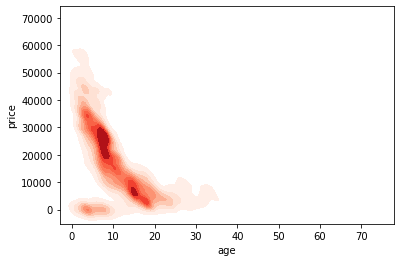

In [74]:
sns.kdeplot(x='age',y='price',data=df,cmap="Reds", shade=True, bw_adjust=.5)

/tmp/ipykernel_2985797/2079726061.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x='age',y='price',data=df,cmap="Reds", shade=True, thresh=0)


<AxesSubplot: xlabel='age', ylabel='price'>

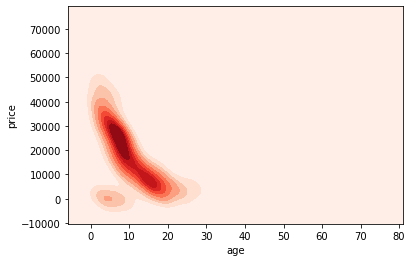

In [75]:
sns.kdeplot(x='age',y='price',data=df,cmap="Reds", shade=True, thresh=0)

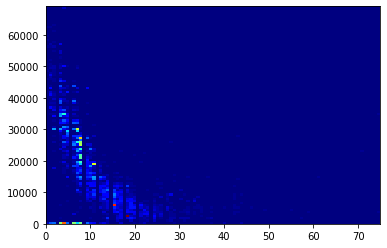

In [79]:
import matplotlib.pyplot as plt
plt.hist2d(x='age',y='price',data=df, bins=(100, 100), cmap=plt.cm.jet)
plt.show()

In [14]:
df = vehicle_1[vehicle_1["model"]=='f-150']
df["year"] = df["year"].astype(int)
df["age"] = (2021 - df["year"]).astype(float)
df["price"] = df["price"].astype(float)
df = df[df["price"]!=0]
df.shape

/tmp/ipykernel_4151917/4065695957.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_4151917/4065695957.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = (2021 - df["year"]).astype(float)
/tmp/ipykernel_4151917/4065695957.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

(3430, 27)

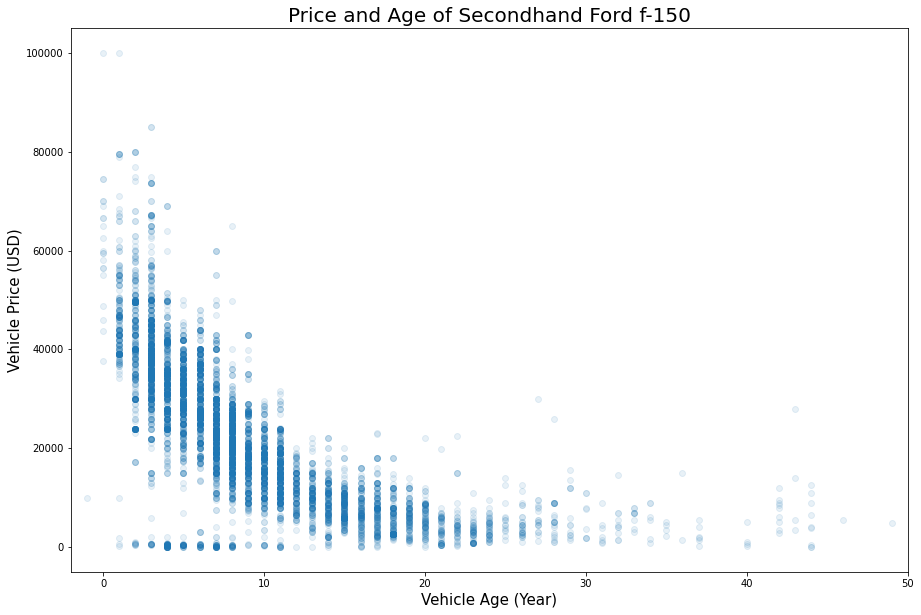

In [143]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,10))
plt.scatter(x="age", y="price",data=df,alpha=0.1)
plt.xlabel("Vehicle Age (Year)", fontsize=15)
plt.ylabel("Vehicle Price (USD)", fontsize=15)
plt.title("Price and Age of Secondhand Ford f-150", fontsize=20)
plt.xlim([-2,50])
plt.show()  

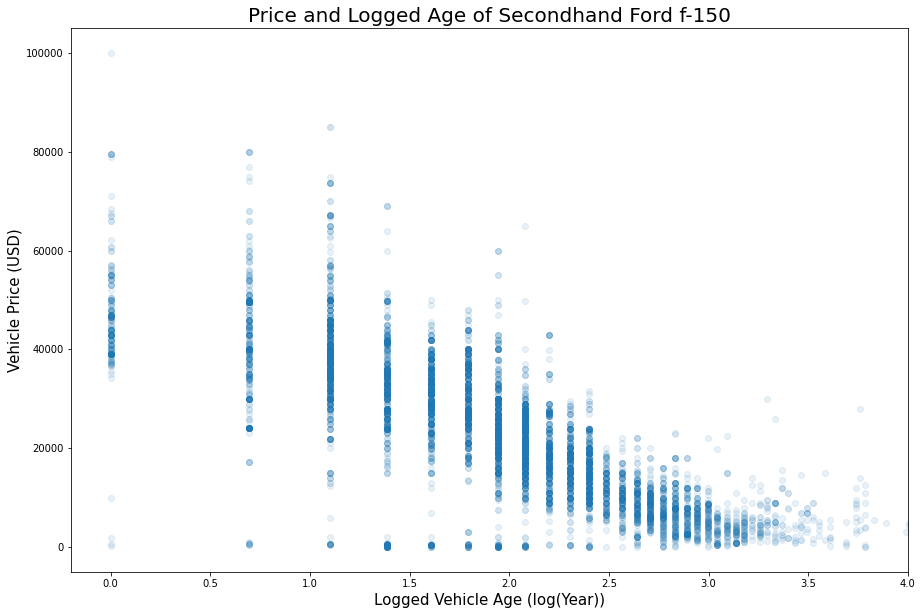

In [144]:
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(15,10))
plt.scatter(x=np.log(df["age"]), y="price",data=df,alpha=0.1)
plt.xlabel("Logged Vehicle Age (log(Year))", fontsize=15)
plt.ylabel("Vehicle Price (USD)", fontsize=15)
plt.title("Price and Logged Age of Secondhand Ford f-150", fontsize=20)
plt.xlim([-0.2,4])
plt.show()

In [13]:
df["price"].dtypes

dtype('float64')

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
plt.figure(figsize=(15,10))
g = sns.lmplot(x=np.log(df["age"]), y="price",data=df,alpha=0.1)
plt.xlabel("Logged Vehicle Age (log(Year))", fontsize=15)
plt.ylabel("Vehicle Price (USD)", fontsize=15)
plt.title("Price and Logged Age of Secondhand Ford f-150", fontsize=20)
plt.xlim([-0.2,4])
plt.show()

TypeError: lmplot() got an unexpected keyword argument 'alpha'

<Figure size 1080x720 with 0 Axes>

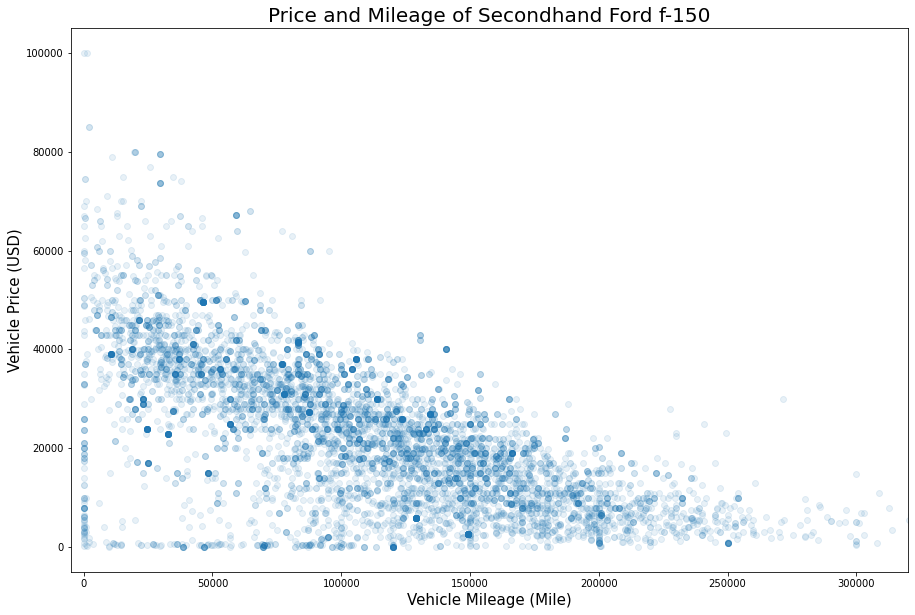

In [145]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,10))
plt.scatter(x="odometer", y="price",data=df,alpha=0.1)
plt.xlabel("Vehicle Mileage (Mile)", fontsize=15)
plt.ylabel("Vehicle Price (USD)", fontsize=15)
plt.title("Price and Mileage of Secondhand Ford f-150", fontsize=20)
plt.xlim([-5000,320000])
plt.show()  

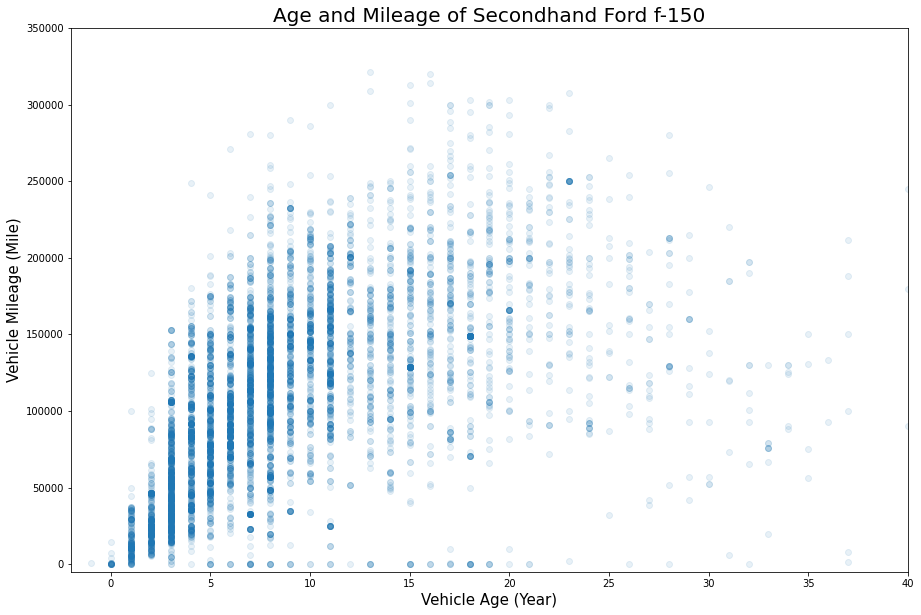

In [146]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,10))
plt.scatter(x="age", y="odometer",data=df,alpha=0.1)
plt.xlabel("Vehicle Age (Year)", fontsize=15)
plt.ylabel("Vehicle Mileage (Mile)", fontsize=15)
plt.title("Age and Mileage of Secondhand Ford f-150", fontsize=20)
plt.xlim([-2,40])
plt.ylim([-5000,350000])
plt.show()  

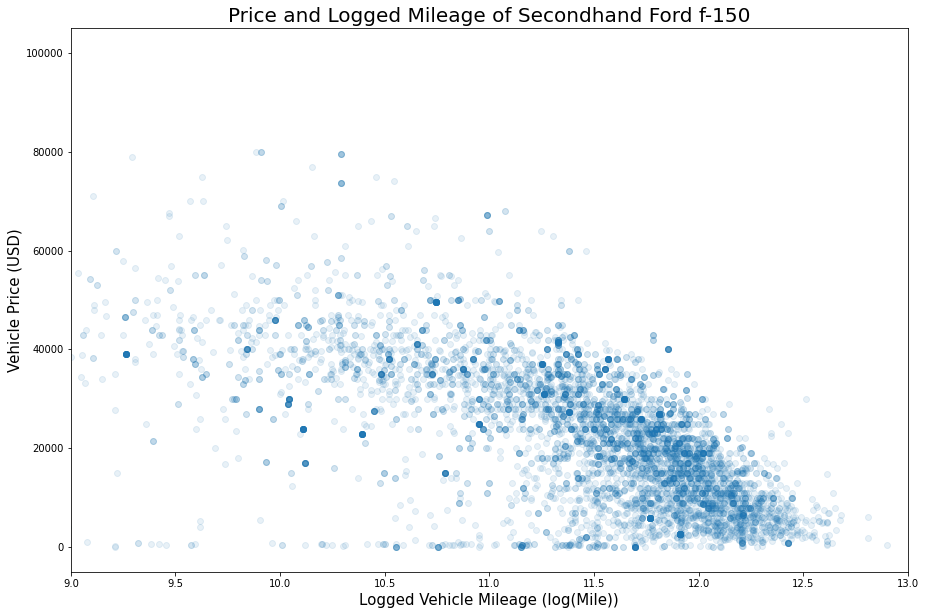

In [147]:
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(15,10))
plt.scatter(x=np.log(df["odometer"]), y="price",data=df,alpha=0.1)
plt.xlabel("Logged Vehicle Mileage (log(Mile))", fontsize=15)
plt.ylabel("Vehicle Price (USD)", fontsize=15)
plt.title("Price and Logged Mileage of Secondhand Ford f-150", fontsize=20)
plt.xlim([9,13])
plt.show()

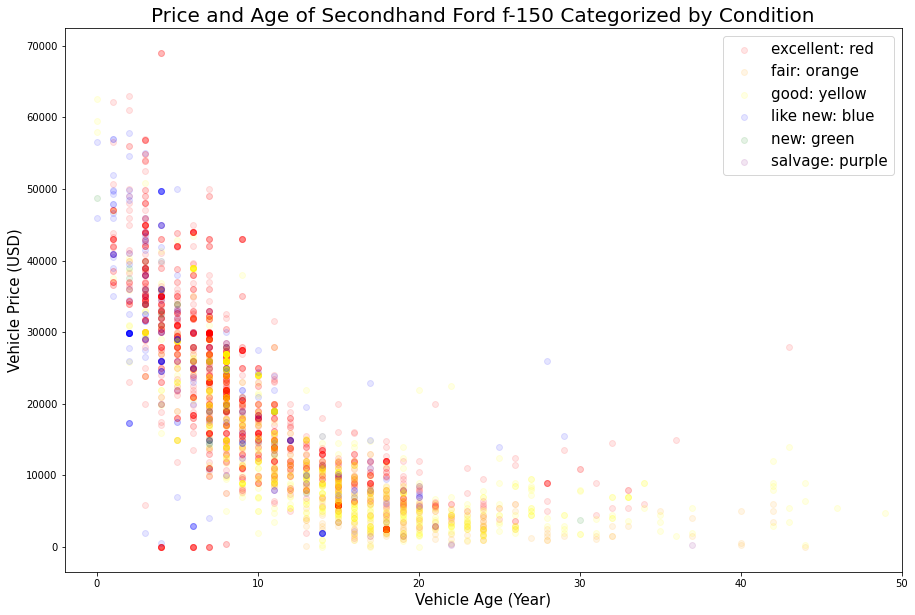

In [148]:
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
plt.figure(figsize=(15,10))
plt.scatter(x="age", y="price",data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.1)
plt.scatter(x="age", y="price",data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.1)
plt.scatter(x="age", y="price",data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.1)
plt.scatter(x="age", y="price",data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.1)
plt.scatter(x="age", y="price",data=df[df["condition"]=="new"],\
            color=colors["new"],alpha=0.1)
plt.scatter(x="age", y="price",data=df[df["condition"]=="salvage"],\
            color=colors["salvage"],alpha=0.1)
plt.xlabel("Vehicle Age (Year)", fontsize=15)
plt.ylabel("Vehicle Price (USD)", fontsize=15)
plt.title("Price and Age of Secondhand Ford f-150 Categorized by Condition",\
          fontsize=20)
plt.legend(['excellent: red', 'fair: orange', \
          'good: yellow', 'like new: blue', \
          'new: green', 'salvage: purple'], loc ="upper right", fontsize=15)
plt.xlim([-2,50])
plt.show()  

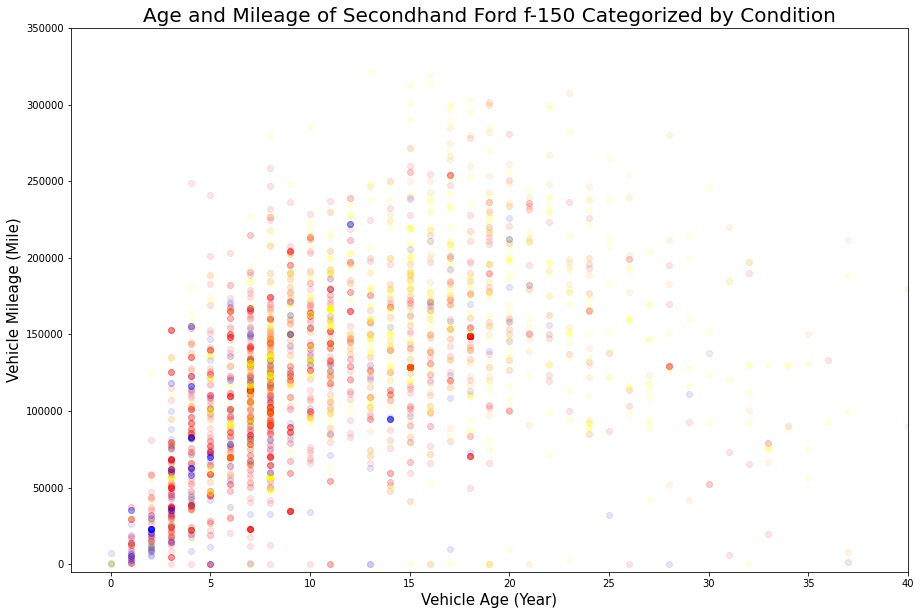

In [149]:
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
plt.figure(figsize=(15,10))
plt.scatter(x="age", y="odometer",data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.1)
plt.scatter(x="age", y="odometer",data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.1)
plt.scatter(x="age", y="odometer",data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.1)
plt.scatter(x="age", y="odometer",data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.1)
plt.scatter(x="age", y="odometer",data=df[df["condition"]=="new"],\
            color=colors["new"],alpha=0.1)
plt.scatter(x="age", y="odometer",data=df[df["condition"]=="salvage"],\
            color=colors["salvage"],alpha=0.1)
plt.xlabel("Vehicle Age (Year)", fontsize=15)
plt.ylabel("Vehicle Mileage (Mile)", fontsize=15)
plt.title("Age and Mileage of Secondhand Ford f-150 Categorized by Condition", fontsize=20)
plt.xlim([-2,40])
plt.ylim([-5000,350000])
plt.show()   

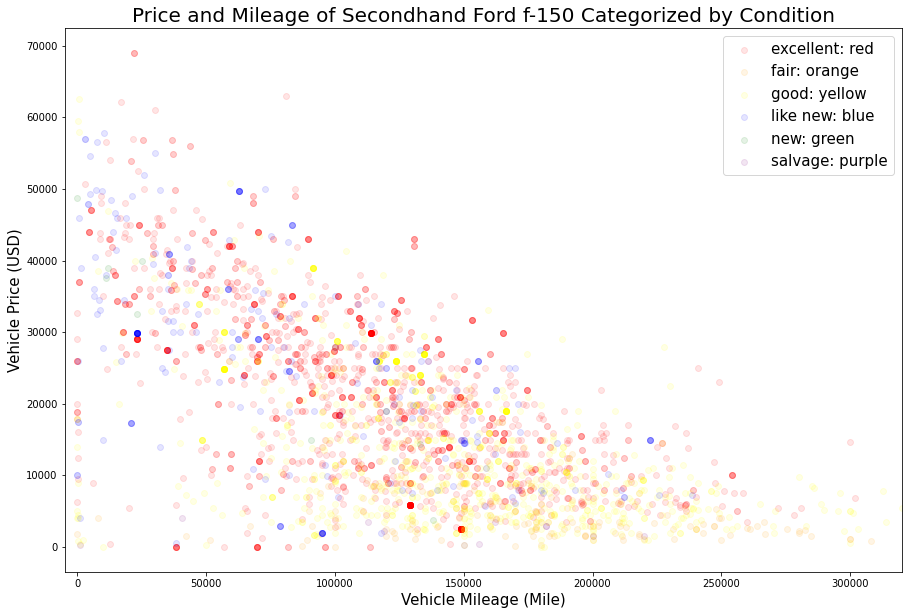

In [150]:
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
plt.figure(figsize=(15,10))
plt.scatter(x="odometer", y="price",data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.1)
plt.scatter(x="odometer", y="price",data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.1)
plt.scatter(x="odometer", y="price",data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.1)
plt.scatter(x="odometer", y="price",data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.1)
plt.scatter(x="odometer", y="price",data=df[df["condition"]=="new"],\
            color=colors["new"],alpha=0.1)
plt.scatter(x="odometer", y="price",data=df[df["condition"]=="salvage"],\
            color=colors["salvage"],alpha=0.1)
plt.xlabel("Vehicle Mileage (Mile)", fontsize=15)
plt.ylabel("Vehicle Price (USD)", fontsize=15)
plt.title("Price and Mileage of Secondhand Ford f-150 Categorized by Condition", fontsize=20)
plt.legend(['excellent: red', 'fair: orange', \
          'good: yellow', 'like new: blue', \
          'new: green', 'salvage: purple'], loc ="upper right", fontsize=15)
plt.xlim([-5000,320000])
plt.show()  

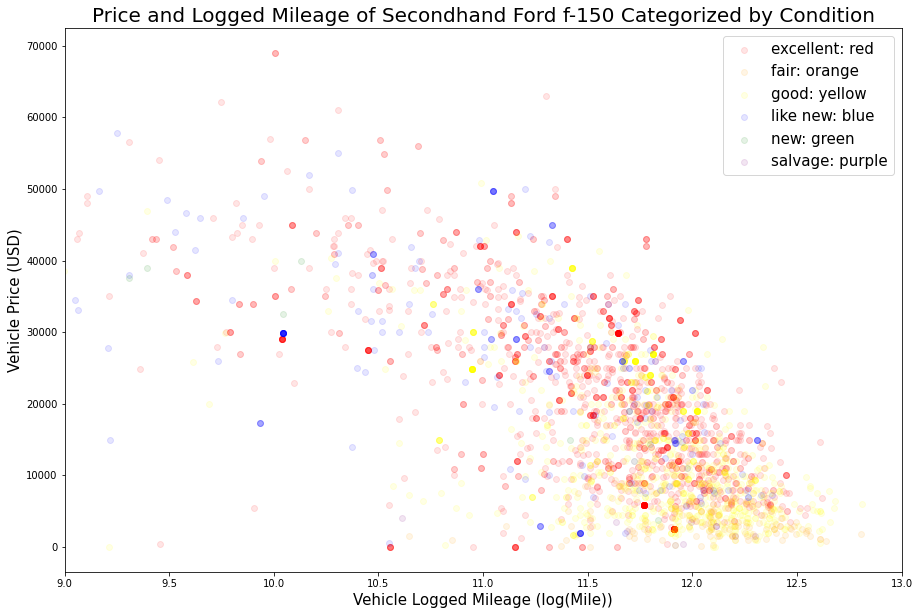

In [151]:
import matplotlib.pyplot as plt
import numpy as np
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
plt.figure(figsize=(15,10))
plt.scatter(x=np.log(df[df["condition"]=="excellent"]["odometer"]), y="price",\
            data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.1)
plt.scatter(x=np.log(df[df["condition"]=="fair"]["odometer"]), y="price",\
            data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.1)
plt.scatter(x=np.log(df[df["condition"]=="good"]["odometer"]), y="price",\
            data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.1)
plt.scatter(x=np.log(df[df["condition"]=="like new"]["odometer"]), y="price",\
            data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.1)
plt.scatter(x=np.log(df[df["condition"]=="new"]["odometer"]), y="price",\
            data=df[df["condition"]=="new"],\
            color=colors["new"],alpha=0.1)
plt.scatter(x=np.log(df[df["condition"]=="salvage"]["odometer"]), y="price",\
            data=df[df["condition"]=="salvage"],\
            color=colors["salvage"],alpha=0.1)
plt.xlabel("Vehicle Logged Mileage (log(Mile))", fontsize=15)
plt.ylabel("Vehicle Price (USD)", fontsize=15)
plt.title("Price and Logged Mileage of Secondhand Ford f-150 Categorized by Condition", fontsize=20)
plt.legend(['excellent: red', 'fair: orange', \
          'good: yellow', 'like new: blue', \
          'new: green', 'salvage: purple'], loc ="upper right", fontsize=15)
plt.xlim([9,13])
plt.show() 

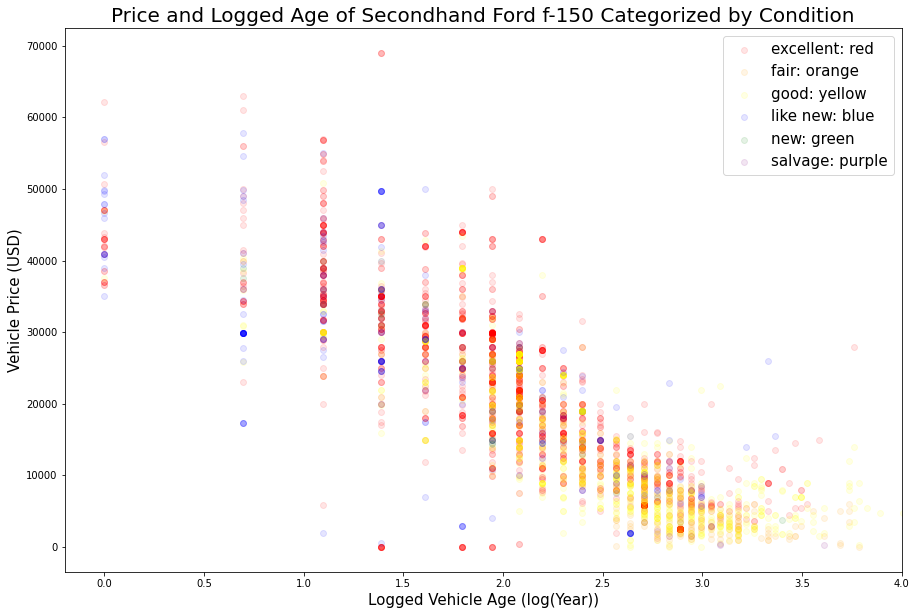

In [152]:
import matplotlib.pyplot as plt
import numpy as np
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
plt.figure(figsize=(15,10))
plt.scatter(x=np.log(df[df["condition"]=="excellent"]["age"]), y="price",\
            data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.1)
plt.scatter(x=np.log(df[df["condition"]=="fair"]["age"]), y="price",\
            data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.1)
plt.scatter(x=np.log(df[df["condition"]=="good"]["age"]), y="price",\
            data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.1)
plt.scatter(x=np.log(df[df["condition"]=="like new"]["age"]), y="price",\
            data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.1)
plt.scatter(x=np.log(df[df["condition"]=="new"]["age"]), y="price",\
            data=df[df["condition"]=="new"],\
            color=colors["new"],alpha=0.1)
plt.scatter(x=np.log(df[df["condition"]=="salvage"]["age"]), y="price",\
            data=df[df["condition"]=="salvage"],\
            color=colors["salvage"],alpha=0.1)
plt.xlabel("Logged Vehicle Age (log(Year))", fontsize=15)
plt.ylabel("Vehicle Price (USD)", fontsize=15)
plt.title("Price and Logged Age of Secondhand Ford f-150 Categorized by Condition", fontsize=20)
plt.legend(['excellent: red', 'fair: orange', \
          'good: yellow', 'like new: blue', \
          'new: green', 'salvage: purple'], loc ="upper right", fontsize=15)
plt.xlim([-0.2,4])
plt.show()  

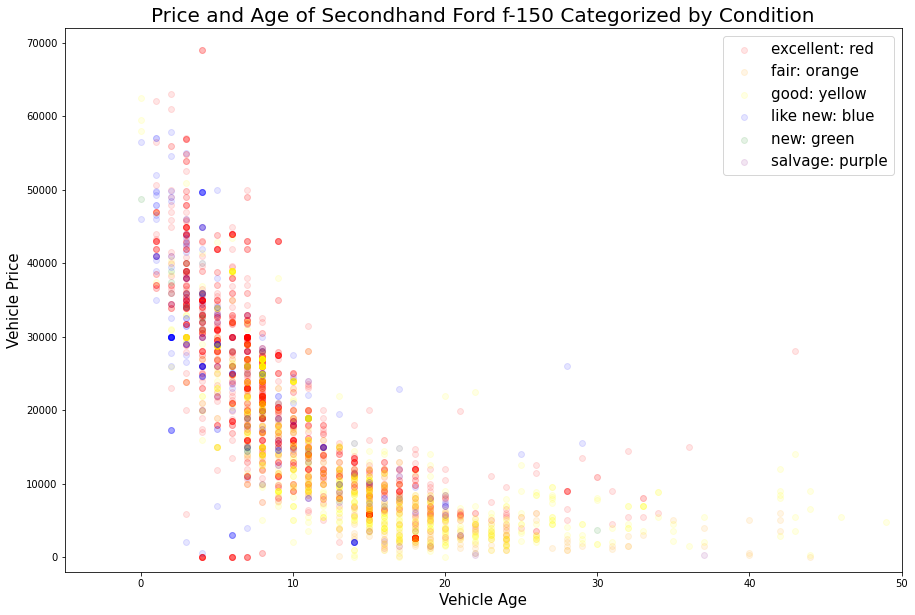

In [153]:
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
plt.figure(figsize=(15,10))
plt.scatter(x="age", y="price",data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.1)
plt.scatter(x="age", y="price",data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.1)
plt.scatter(x="age", y="price",data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.1)
plt.scatter(x="age", y="price",data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.1)
plt.scatter(x="age", y="price",data=df[df["condition"]=="new"],\
            color=colors["new"],alpha=0.1)
plt.scatter(x="age", y="price",data=df[df["condition"]=="salvage"],\
            color=colors["salvage"],alpha=0.1)
plt.xlabel("Vehicle Age", fontsize=15)
plt.ylabel("Vehicle Price", fontsize=15)
plt.title("Price and Age of Secondhand Ford f-150 Categorized by Condition", fontsize=20)
plt.legend(['excellent: red', 'fair: orange', \
          'good: yellow', 'like new: blue', \
          'new: green', 'salvage: purple'], loc ="upper right", fontsize=15)
plt.xlim([-5,50])
plt.ylim([-2000,72000])
plt.show()  

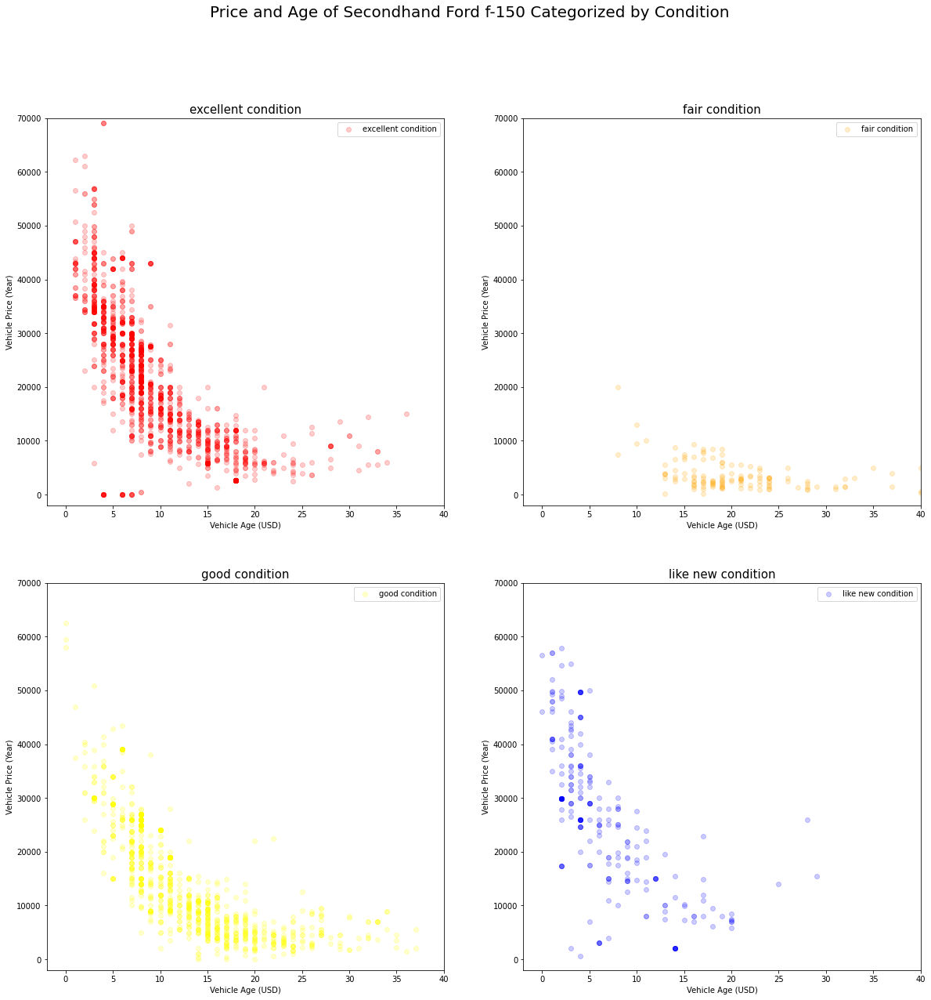

In [155]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
fig.suptitle("Price and Age of Secondhand Ford f-150 Categorized by Condition", fontsize=20)
axs[0, 0].scatter(x="age", y="price",data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.2)
axs[0, 0].set_title('excellent condition', fontsize=15)
axs[0, 0].set_xlabel("Vehicle Age (USD)", fontsize=10)
axs[0, 0].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[0, 0].set_xlim([-2,40])
axs[0, 0].set_ylim([-2000,70000])
axs[0, 0].legend(["excellent condition"],loc="upper right", fontsize=10)
axs[0, 1].scatter(x="age", y="price",data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.2)
axs[0, 1].set_title('fair condition', fontsize=15)
axs[0, 1].set_xlabel("Vehicle Age (USD)", fontsize=10)
axs[0, 1].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[0, 1].set_xlim([-2,40])
axs[0, 1].set_ylim([-2000,70000])
axs[0, 1].legend(["fair condition"],loc="upper right", fontsize=10)
axs[1, 0].scatter(x="age", y="price",data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.2)
axs[1, 0].set_title('good condition', fontsize=15)
axs[1, 0].set_xlabel("Vehicle Age (USD)", fontsize=10)
axs[1, 0].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[1, 0].set_xlim([-2,40])
axs[1, 0].set_ylim([-2000,70000])
axs[1, 0].legend(["good condition"],loc="upper right", fontsize=10)
axs[1, 1].scatter(x="age", y="price",data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.2)
axs[1, 1].set_title('like new condition', fontsize=15)
axs[1, 1].set_xlabel("Vehicle Age (USD)", fontsize=10)
axs[1, 1].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[1, 1].set_xlim([-2,40])
axs[1, 1].set_ylim([-2000,70000])
axs[1, 1].legend(["like new condition"],loc="upper right", fontsize=10)

In [ ]:
plt.xlim([-2,40])
plt.ylim([-5000,350000])

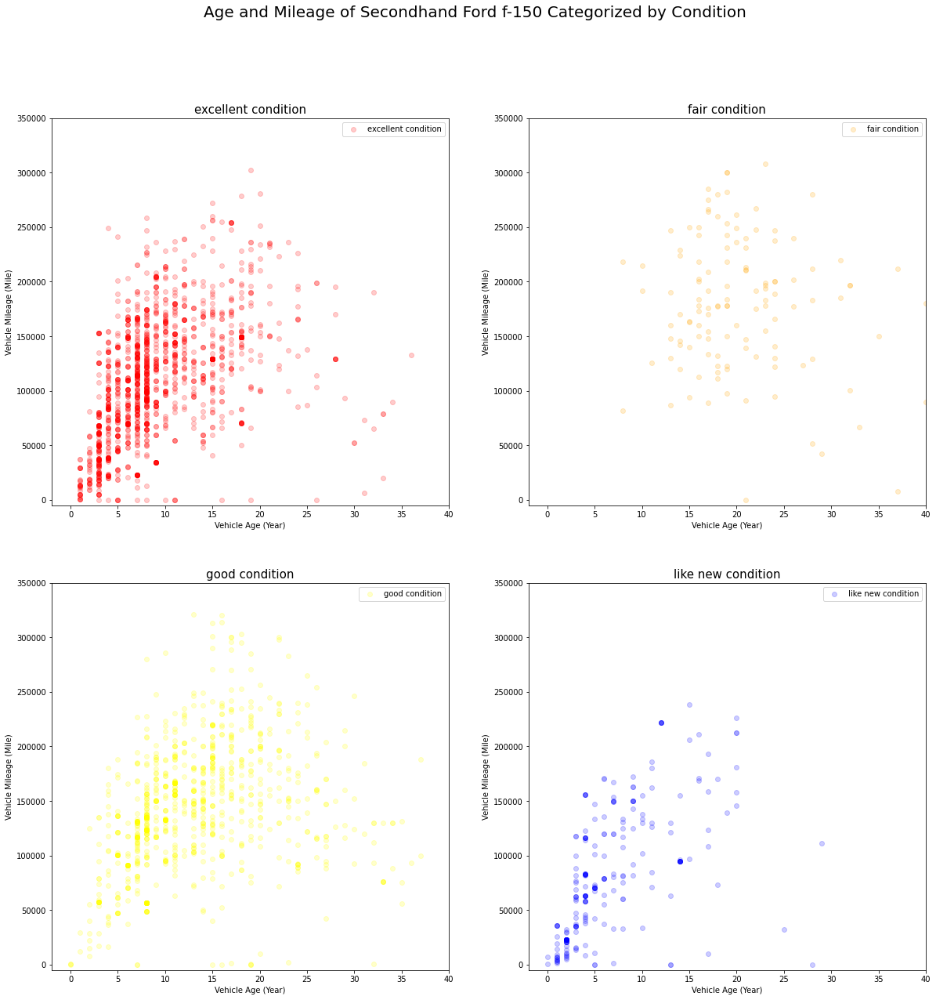

In [156]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
fig.suptitle("Age and Mileage of Secondhand Ford f-150 Categorized by Condition", fontsize=20)
axs[0, 0].scatter(x="age", y="odometer",data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.2)
axs[0, 0].set_title('excellent condition', fontsize=15)
axs[0, 0].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[0, 0].set_ylabel("Vehicle Mileage (Mile)", fontsize=10)
axs[0, 0].set_xlim([-2,40])
axs[0, 0].set_ylim([-5000,350000])
axs[0, 0].legend(["excellent condition"],loc="upper right", fontsize=10)
axs[0, 1].scatter(x="age", y="odometer",data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.2)
axs[0, 1].set_title('fair condition', fontsize=15)
axs[0, 1].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[0, 1].set_ylabel("Vehicle Mileage (Mile)", fontsize=10)
axs[0, 1].set_xlim([-2,40])
axs[0, 1].set_ylim([-5000,350000])
axs[0, 1].legend(["fair condition"],loc="upper right", fontsize=10)
axs[1, 0].scatter(x="age", y="odometer",data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.2)
axs[1, 0].set_title('good condition', fontsize=15)
axs[1, 0].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[1, 0].set_ylabel("Vehicle Mileage (Mile)", fontsize=10)
axs[1, 0].set_xlim([-2,40])
axs[1, 0].set_ylim([-5000,350000])
axs[1, 0].legend(["good condition"],loc="upper right", fontsize=10)
axs[1, 1].scatter(x="age", y="odometer",data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.2)
axs[1, 1].set_title('like new condition', fontsize=15)
axs[1, 1].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[1, 1].set_ylabel("Vehicle Mileage (Mile)", fontsize=10)
axs[1, 1].set_xlim([-2,40])
axs[1, 1].set_ylim([-5000,350000])
axs[1, 1].legend(["like new condition"],loc="upper right", fontsize=10)

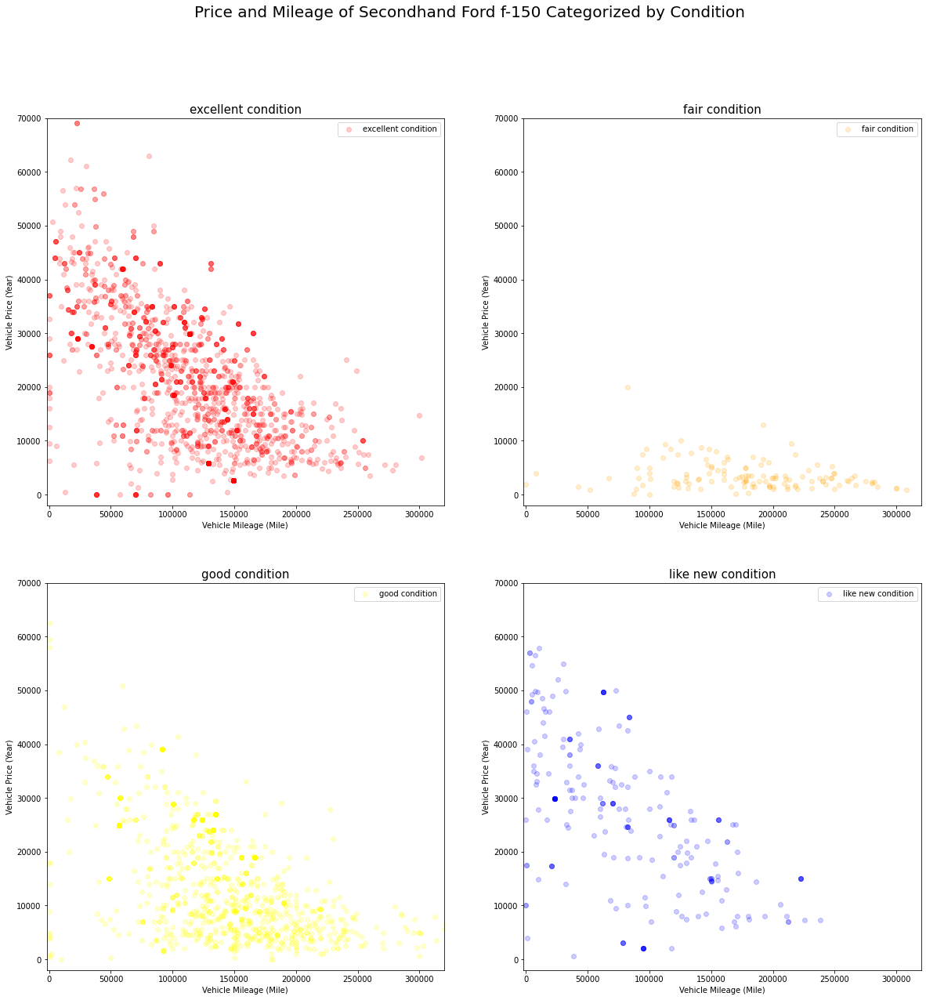

In [157]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
fig.suptitle("Price and Mileage of Secondhand Ford f-150 Categorized by Condition", fontsize=20)
axs[0, 0].scatter(x="odometer", y="price",data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.2)
axs[0, 0].set_title('excellent condition', fontsize=15)
axs[0, 0].set_xlabel("Vehicle Mileage (Mile)", fontsize=10)
axs[0, 0].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[0, 0].set_xlim([-2000,320000])
axs[0, 0].set_ylim([-2000,70000])
axs[0, 0].legend(["excellent condition"],loc="upper right", fontsize=10)
axs[0, 1].scatter(x="odometer", y="price",data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.2)
axs[0, 1].set_title('fair condition', fontsize=15)
axs[0, 1].set_xlabel("Vehicle Mileage (Mile)", fontsize=10)
axs[0, 1].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[0, 1].set_xlim([-2000,320000])
axs[0, 1].set_ylim([-2000,70000])
axs[0, 1].legend(["fair condition"],loc="upper right", fontsize=10)
axs[1, 0].scatter(x="odometer", y="price",data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.2)
axs[1, 0].set_title('good condition', fontsize=15)
axs[1, 0].set_xlabel("Vehicle Mileage (Mile)", fontsize=10)
axs[1, 0].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[1, 0].set_xlim([-2000,320000])
axs[1, 0].set_ylim([-2000,70000])
axs[1, 0].legend(["good condition"],loc="upper right", fontsize=10)
axs[1, 1].scatter(x="odometer", y="price",data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.2)
axs[1, 1].set_title('like new condition', fontsize=15)
axs[1, 1].set_xlabel("Vehicle Mileage (Mile)", fontsize=10)
axs[1, 1].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[1, 1].set_xlim([-2000,320000])
axs[1, 1].set_ylim([-2000,70000])
axs[1, 1].legend(["like new condition"],loc="upper right", fontsize=10)

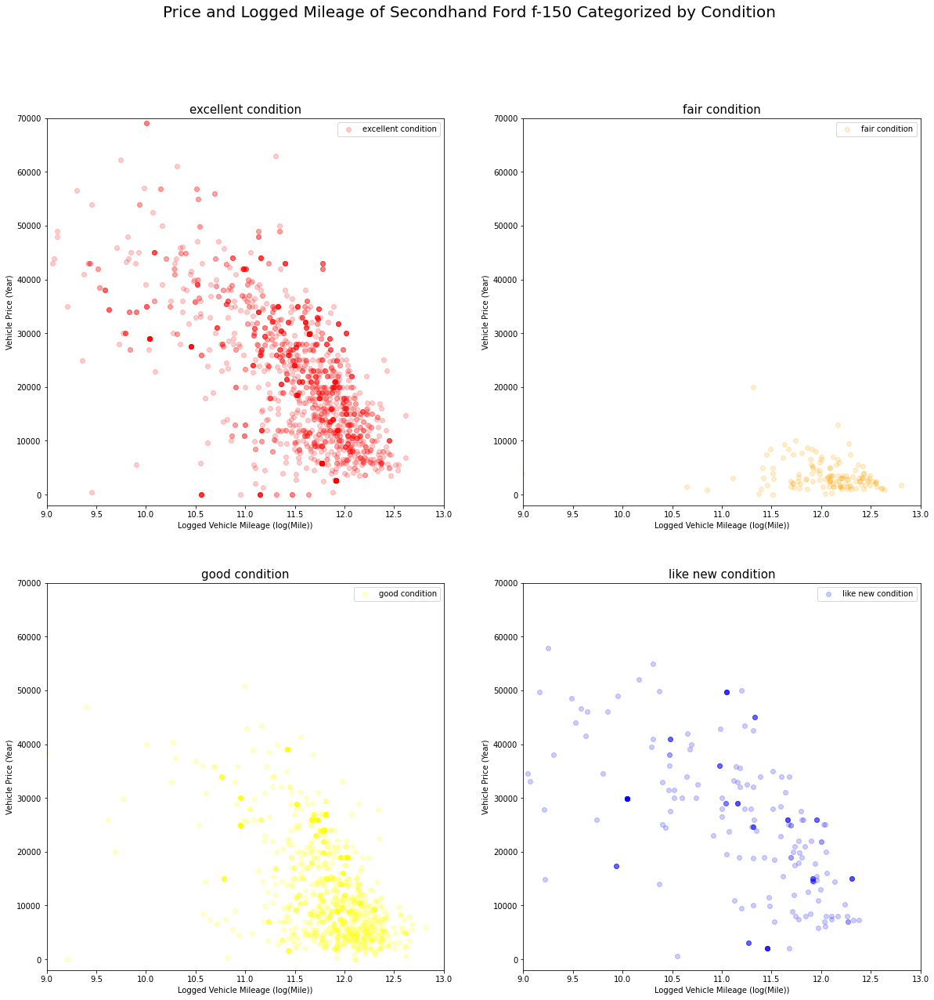

In [158]:
import matplotlib.pyplot as plt
import numpy as np
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
fig.suptitle("Price and Logged Mileage of Secondhand Ford f-150 Categorized by Condition", fontsize=20)
axs[0, 0].scatter(x=np.log(df[df["condition"]=="excellent"]["odometer"]), y="price",\
                  data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.2)
axs[0, 0].set_title('excellent condition', fontsize=15)
axs[0, 0].set_xlabel("Logged Vehicle Mileage (log(Mile))", fontsize=10)
axs[0, 0].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[0, 0].set_xlim([9,13])
axs[0, 0].set_ylim([-2000,70000])
axs[0, 0].legend(["excellent condition"],loc="upper right", fontsize=10)
axs[0, 1].scatter(x=np.log(df[df["condition"]=="fair"]["odometer"]), y="price",\
                  data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.2)
axs[0, 1].set_title('fair condition', fontsize=15)
axs[0, 1].set_xlabel("Logged Vehicle Mileage (log(Mile))", fontsize=10)
axs[0, 1].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[0, 1].set_xlim([9,13])
axs[0, 1].set_ylim([-2000,70000])
axs[0, 1].legend(["fair condition"],loc="upper right", fontsize=10)
axs[1, 0].scatter(x=np.log(df[df["condition"]=="good"]["odometer"]), y="price",\
                  data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.2)
axs[1, 0].set_title('good condition', fontsize=15)
axs[1, 0].set_xlabel("Logged Vehicle Mileage (log(Mile))", fontsize=10)
axs[1, 0].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[1, 0].set_xlim([9,13])
axs[1, 0].set_ylim([-2000,70000])
axs[1, 0].legend(["good condition"],loc="upper right", fontsize=10)
axs[1, 1].scatter(x=np.log(df[df["condition"]=="like new"]["odometer"]), y="price",\
                  data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.2)
axs[1, 1].set_title('like new condition', fontsize=15)
axs[1, 1].set_xlabel("Logged Vehicle Mileage (log(Mile))", fontsize=10)
axs[1, 1].set_ylabel("Vehicle Price (Year)", fontsize=10)
axs[1, 1].set_xlim([9,13])
axs[1, 1].set_ylim([-2000,70000])
axs[1, 1].legend(["like new condition"],loc="upper right", fontsize=10)

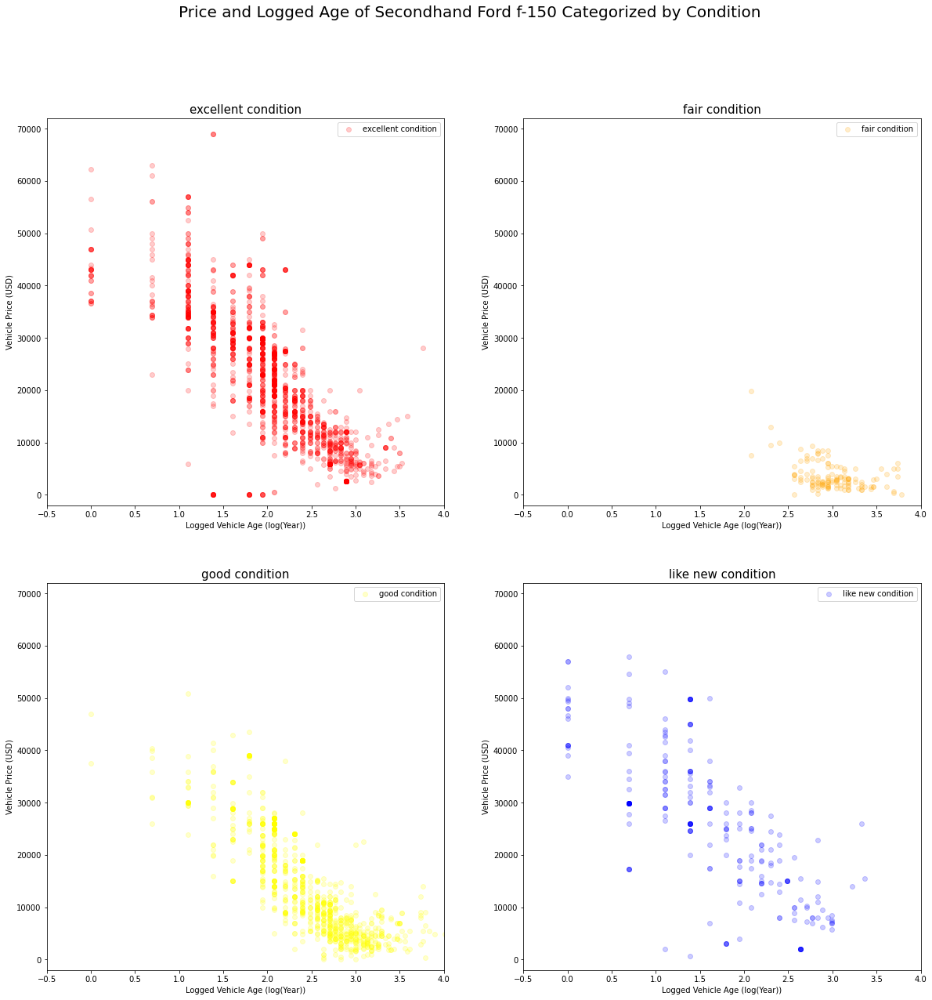

In [159]:
import matplotlib.pyplot as plt
import numpy as np
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
fig.suptitle("Price and Logged Age of Secondhand Ford f-150 Categorized by Condition", fontsize=20)
axs[0, 0].scatter(x=np.log(df[df["condition"]=="excellent"]["age"]), y="price",\
                  data=df[df["condition"]=="excellent"],\
            color=colors["excellent"],alpha=0.2)
axs[0, 0].set_title('excellent condition', fontsize=15)
axs[0, 0].set_xlabel("Logged Vehicle Age (log(Year))", fontsize=10)
axs[0, 0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0, 0].set_xlim([-0.5,4])
axs[0, 0].set_ylim([-2000,72000])
axs[0, 0].legend(["excellent condition"],loc="upper right", fontsize=10)
axs[0, 1].scatter(x=np.log(df[df["condition"]=="fair"]["age"]), y="price",\
                  data=df[df["condition"]=="fair"],\
            color=colors["fair"],alpha=0.2)
axs[0, 1].set_title('fair condition', fontsize=15)
axs[0, 1].set_xlabel("Logged Vehicle Age (log(Year))", fontsize=10)
axs[0, 1].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0, 1].set_xlim([-0.5,4])
axs[0, 1].set_ylim([-2000,72000])
axs[0, 1].legend(["fair condition"],loc="upper right", fontsize=10)
axs[1, 0].scatter(x=np.log(df[df["condition"]=="good"]["age"]), y="price",\
                  data=df[df["condition"]=="good"],\
            color=colors["good"],alpha=0.2)
axs[1, 0].set_title('good condition', fontsize=15)
axs[1, 0].set_xlabel("Logged Vehicle Age (log(Year))", fontsize=10)
axs[1, 0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[1, 0].set_xlim([-0.5,4])
axs[1, 0].set_ylim([-2000,72000])
axs[1, 0].legend(["good condition"],loc="upper right", fontsize=10)
axs[1, 1].scatter(x=np.log(df[df["condition"]=="like new"]["age"]), y="price",\
                  data=df[df["condition"]=="like new"],\
            color=colors["like new"],alpha=0.2)
axs[1, 1].set_title('like new condition', fontsize=15)
axs[1, 1].set_xlabel("Logged Vehicle Age (log(Year))", fontsize=10)
axs[1, 1].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[1, 1].set_xlim([-0.5,4])
axs[1, 1].set_ylim([-2000,72000])
axs[1, 1].legend(["like new condition"],loc="upper right", fontsize=10)

In [79]:
df.columns

Index(['id', 'url', 'region', 'region_url', 'price', 'year', 'manufacturer',
       'model', 'condition', 'cylinders', 'fuel', 'odometer', 'title_status',
       'transmission', 'VIN', 'drive', 'size', 'type', 'paint_color',
       'image_url', 'description', 'county', 'state', 'lat', 'long',
       'posting_date', 'posting_date_time', 'age'],
      dtype='object')

In [80]:
Counter(list(df["title_status"]))

Counter({'clean': 2440,
         'missing': 2,
         'lien': 33,
         'salvage': 22,
         'rebuilt': 34,
         'parts only': 2})

In [66]:
Counter(list(df["type"]))

Counter({'truck': 1404,
         'pickup': 1097,
         'van': 5,
         'other': 13,
         'sedan': 5,
         'offroad': 3,
         'hatchback': 1,
         'coupe': 1,
         'SUV': 4})

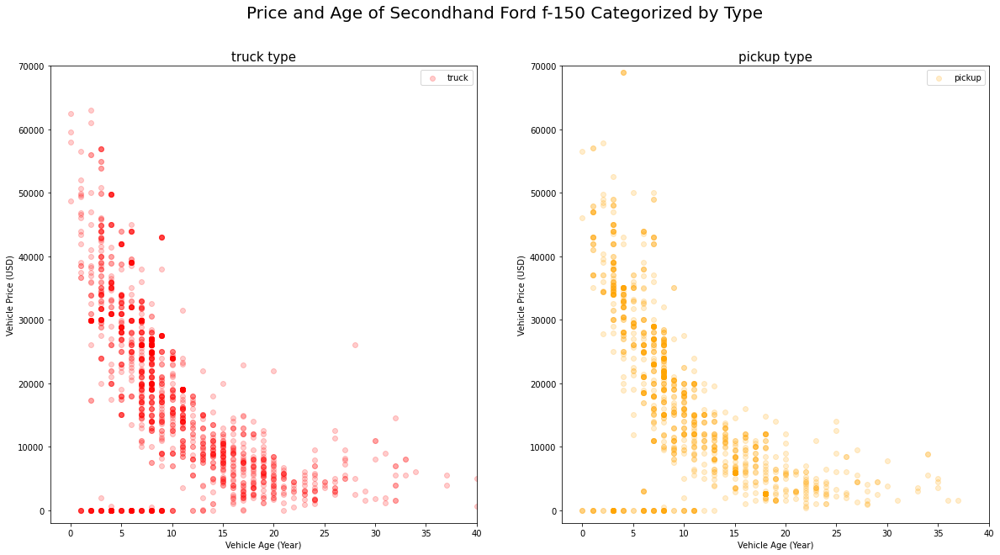

In [11]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
colors = {'truck':'red', 'pickup':'orange'}
fig.suptitle("Price and Age of Secondhand Ford f-150 Categorized by Type", fontsize=20)
axs[0].scatter(x="age", y="price",data=df[df["type"]=="truck"],\
            color=colors["truck"],alpha=0.2)
axs[0].set_title('truck type', fontsize=15)
axs[0].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0].set_xlim([-2,40])
axs[0].set_ylim([-2000,70000])
axs[0].legend(["truck"],loc="upper right", fontsize=10)
axs[1].scatter(x="age", y="price",data=df[df["type"]=="pickup"],\
            color=colors["pickup"],alpha=0.2)
axs[1].set_title('pickup type', fontsize=15)
axs[1].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[1].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[1].set_xlim([-2,40])
axs[1].set_ylim([-2000,70000])
axs[1].legend(["pickup"],loc="upper right", fontsize=10)

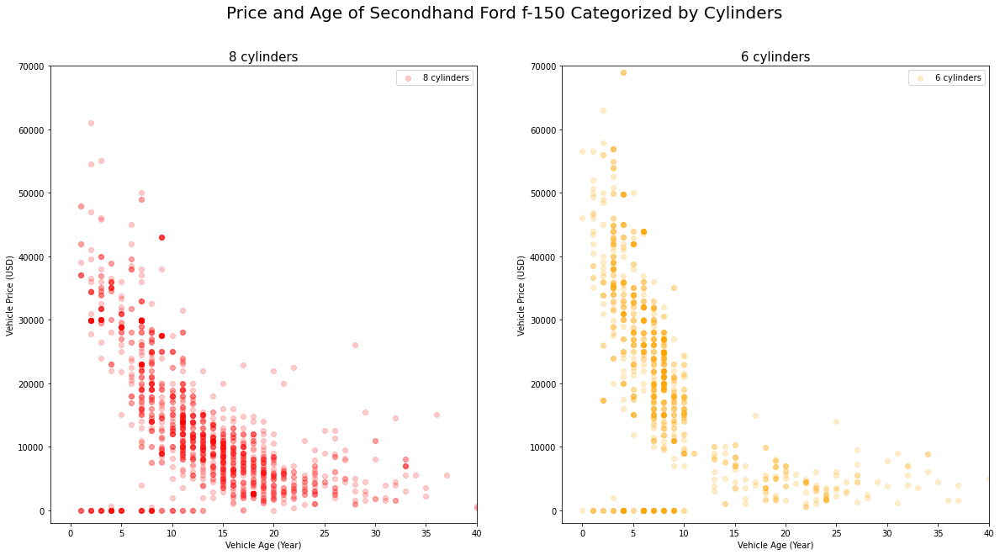

In [18]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
colors = {'8 cylinders':'red', '6 cylinders':'orange'}
fig.suptitle("Price and Age of Secondhand Ford f-150 Categorized by Cylinders", fontsize=20)
axs[0].scatter(x="age", y="price",data=df[df["cylinders"]=="8 cylinders"],\
            color=colors["8 cylinders"],alpha=0.2)
axs[0].set_title('8 cylinders', fontsize=15)
axs[0].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0].set_xlim([-2,40])
axs[0].set_ylim([-2000,70000])
axs[0].legend(["8 cylinders"],loc="upper right", fontsize=10)
axs[1].scatter(x="age", y="price",data=df[df["cylinders"]=="6 cylinders"],\
            color=colors["6 cylinders"],alpha=0.2)
axs[1].set_title('6 cylinders', fontsize=15)
axs[1].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[1].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[1].set_xlim([-2,40])
axs[1].set_ylim([-2000,70000])
axs[1].legend(["6 cylinders"],loc="upper right", fontsize=10)

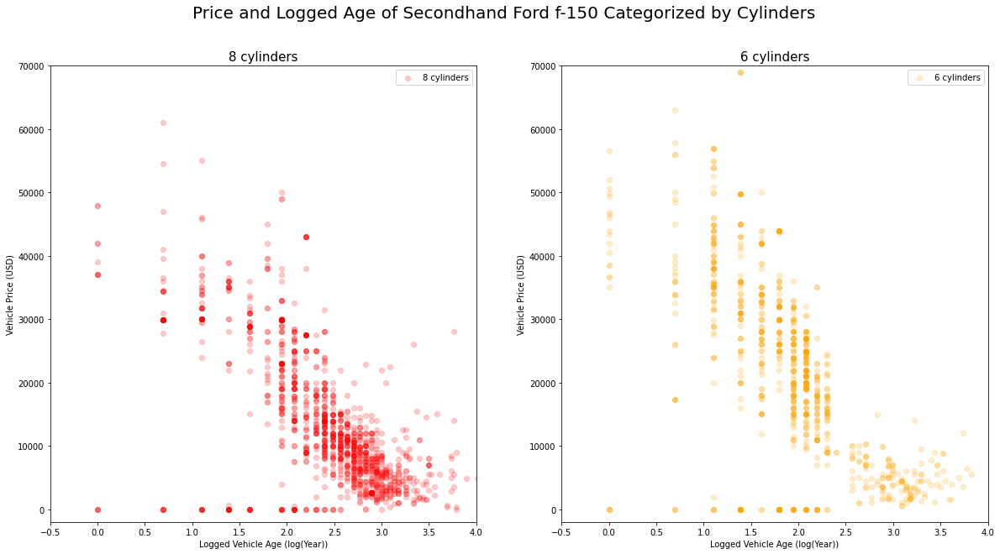

In [19]:
import matplotlib.pyplot as plt
import numpy as np
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
colors = {'truck':'red', 'pickup':'orange'}
fig.suptitle("Price and Logged Age of Secondhand Ford f-150 Categorized by Cylinders", fontsize=20)
axs[0].scatter(x=np.log(df[df["cylinders"]=="8 cylinders"]["age"]), y="price",data=df[df["cylinders"]=="8 cylinders"],\
            color=colors["truck"],alpha=0.2)
axs[0].set_title('8 cylinders', fontsize=15)
axs[0].set_xlabel("Logged Vehicle Age (log(Year))", fontsize=10)
axs[0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0].set_xlim([-0.5,4])
axs[0].set_ylim([-2000,70000])
axs[0].legend(["8 cylinders"],loc="upper right", fontsize=10)
axs[1].scatter(x=np.log(df[df["cylinders"]=="6 cylinders"]["age"]), y="price",data=df[df["cylinders"]=="6 cylinders"],\
            color=colors["pickup"],alpha=0.2)
axs[1].set_title('6 cylinders', fontsize=15)
axs[1].set_xlabel("Logged Vehicle Age (log(Year))", fontsize=10)
axs[1].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[1].set_xlim([-0.5,4])
axs[1].set_ylim([-2000,70000])
axs[1].legend(["6 cylinders"],loc="upper right", fontsize=10)

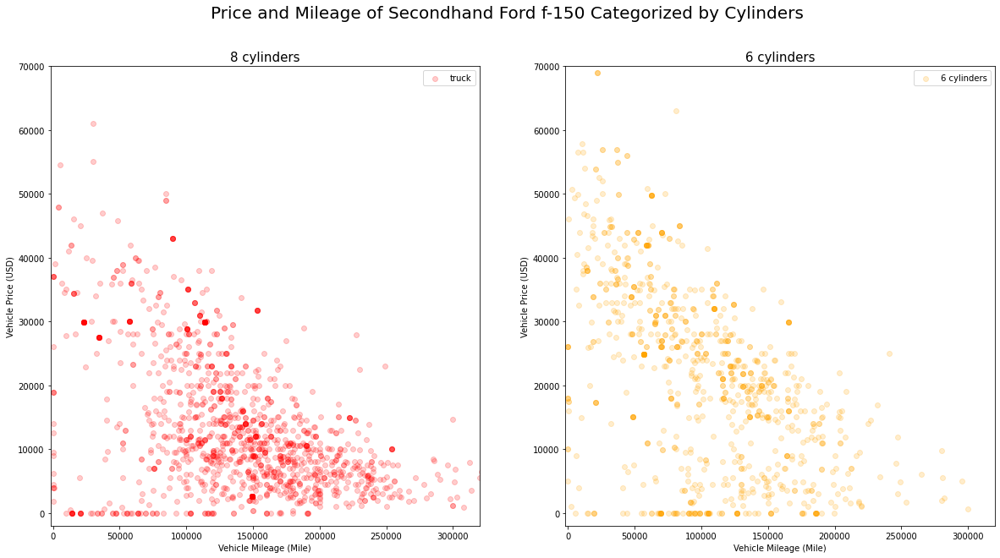

In [21]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
colors = {'8 cylinders':'red', '6 cylinders':'orange'}
fig.suptitle("Price and Mileage of Secondhand Ford f-150 Categorized by Cylinders", fontsize=20)
axs[0].scatter(x="odometer", y="price",data=df[df["cylinders"]=="8 cylinders"],\
            color=colors["8 cylinders"],alpha=0.2)
axs[0].set_title('8 cylinders', fontsize=15)
axs[0].set_xlabel("Vehicle Mileage (Mile)", fontsize=10)
axs[0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0].set_xlim([-2000,320000])
axs[0].set_ylim([-2000,70000])
axs[0].legend(["truck"],loc="upper right", fontsize=10)
axs[1].scatter(x="odometer", y="price",data=df[df["cylinders"]=="6 cylinders"],\
            color=colors["6 cylinders"],alpha=0.2)
axs[1].set_title('6 cylinders', fontsize=15)
axs[1].set_xlabel("Vehicle Mileage (Mile)", fontsize=10)
axs[1].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[1].set_xlim([-2000,320000])
axs[1].set_ylim([-2000,70000])
axs[1].legend(["6 cylinders"],loc="upper right", fontsize=10)

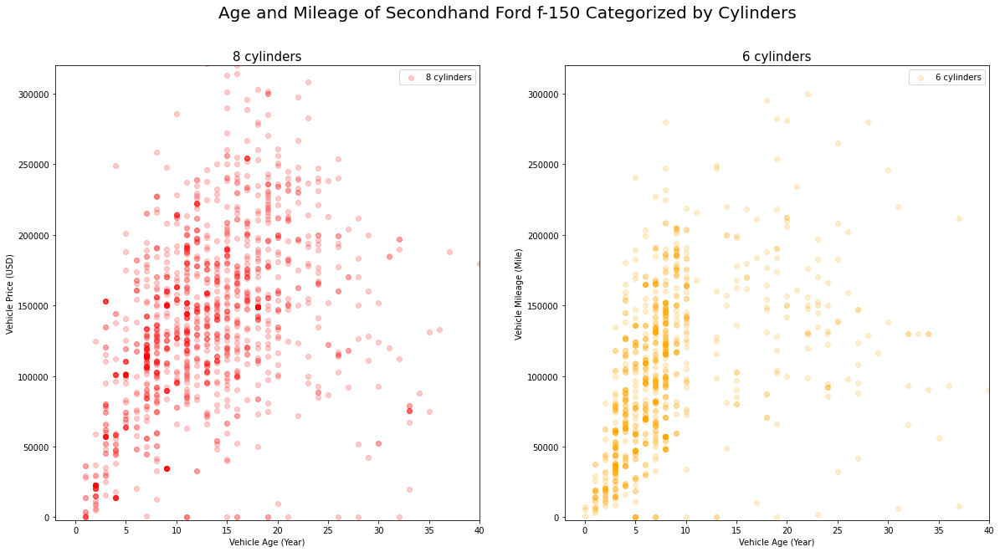

In [22]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
colors = {'8 cylinders':'red', '6 cylinders':'orange'}
fig.suptitle("Age and Mileage of Secondhand Ford f-150 Categorized by Cylinders", fontsize=20)
axs[0].scatter(x="age", y="odometer",data=df[df["cylinders"]=="8 cylinders"],\
            color=colors["8 cylinders"],alpha=0.2)
axs[0].set_title('8 cylinders', fontsize=15)
axs[0].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0].set_xlim([-2,40])
axs[0].set_ylim([-2000,320000])
axs[0].legend(["8 cylinders"],loc="upper right", fontsize=10)
axs[1].scatter(x="age", y="odometer",data=df[df["cylinders"]=="6 cylinders"],\
            color=colors["6 cylinders"],alpha=0.2)
axs[1].set_title('6 cylinders', fontsize=15)
axs[1].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[1].set_ylabel("Vehicle Mileage (Mile)", fontsize=10)
axs[1].set_xlim([-2,40])
axs[1].set_ylim([-2000,320000])
axs[1].legend(["6 cylinders"],loc="upper right", fontsize=10)

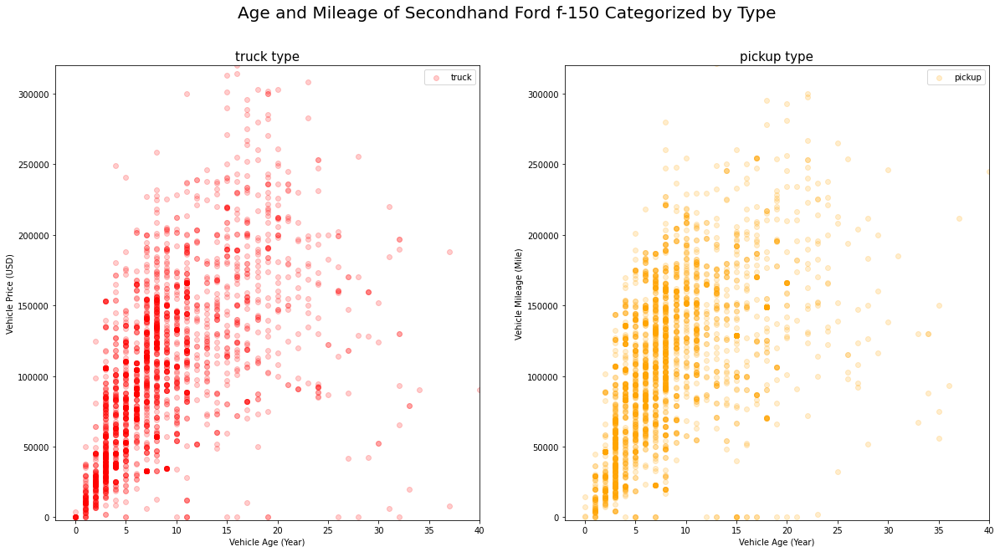

In [161]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
colors = {'truck':'red', 'pickup':'orange'}
fig.suptitle("Age and Mileage of Secondhand Ford f-150 Categorized by Type", fontsize=20)
axs[0].scatter(x="age", y="odometer",data=df[df["type"]=="truck"],\
            color=colors["truck"],alpha=0.2)
axs[0].set_title('truck type', fontsize=15)
axs[0].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0].set_xlim([-2,40])
axs[0].set_ylim([-2000,320000])
axs[0].legend(["truck"],loc="upper right", fontsize=10)
axs[1].scatter(x="age", y="odometer",data=df[df["type"]=="pickup"],\
            color=colors["pickup"],alpha=0.2)
axs[1].set_title('pickup type', fontsize=15)
axs[1].set_xlabel("Vehicle Age (Year)", fontsize=10)
axs[1].set_ylabel("Vehicle Mileage (Mile)", fontsize=10)
axs[1].set_xlim([-2,40])
axs[1].set_ylim([-2000,320000])
axs[1].legend(["pickup"],loc="upper right", fontsize=10)

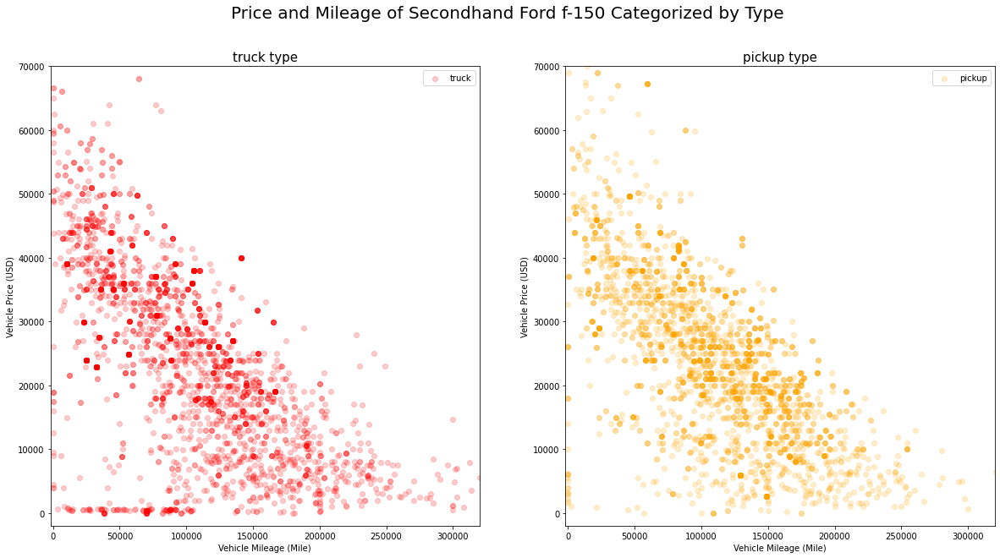

In [162]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
colors = {'truck':'red', 'pickup':'orange'}
fig.suptitle("Price and Mileage of Secondhand Ford f-150 Categorized by Type", fontsize=20)
axs[0].scatter(x="odometer", y="price",data=df[df["type"]=="truck"],\
            color=colors["truck"],alpha=0.2)
axs[0].set_title('truck type', fontsize=15)
axs[0].set_xlabel("Vehicle Mileage (Mile)", fontsize=10)
axs[0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0].set_xlim([-2000,320000])
axs[0].set_ylim([-2000,70000])
axs[0].legend(["truck"],loc="upper right", fontsize=10)
axs[1].scatter(x="odometer", y="price",data=df[df["type"]=="pickup"],\
            color=colors["pickup"],alpha=0.2)
axs[1].set_title('pickup type', fontsize=15)
axs[1].set_xlabel("Vehicle Mileage (Mile)", fontsize=10)
axs[1].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[1].set_xlim([-2000,320000])
axs[1].set_ylim([-2000,70000])
axs[1].legend(["pickup"],loc="upper right", fontsize=10)

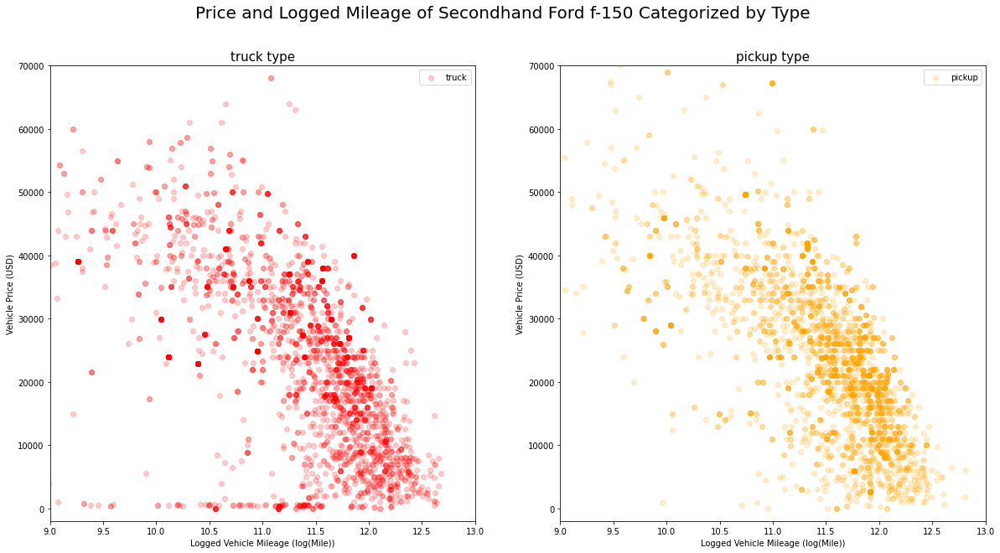

In [163]:
import matplotlib.pyplot as plt
import numpy as np
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
colors = {'truck':'red', 'pickup':'orange'}
fig.suptitle("Price and Logged Mileage of Secondhand Ford f-150 Categorized by Type", fontsize=20)
axs[0].scatter(x=np.log(df[df["type"]=="truck"]["odometer"]), y="price",data=df[df["type"]=="truck"],\
            color=colors["truck"],alpha=0.2)
axs[0].set_title('truck type', fontsize=15)
axs[0].set_xlabel("Logged Vehicle Mileage (log(Mile))", fontsize=10)
axs[0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0].set_xlim([9,13])
axs[0].set_ylim([-2000,70000])
axs[0].legend(["truck"],loc="upper right", fontsize=10)
axs[1].scatter(x=np.log(df[df["type"]=="pickup"]["odometer"]), y="price",data=df[df["type"]=="pickup"],\
            color=colors["pickup"],alpha=0.2)
axs[1].set_title('pickup type', fontsize=15)
axs[1].set_xlabel("Logged Vehicle Mileage (log(Mile))", fontsize=10)
axs[1].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[1].set_xlim([9,13])
axs[1].set_ylim([-2000,70000])
axs[1].legend(["pickup"],loc="upper right", fontsize=10)

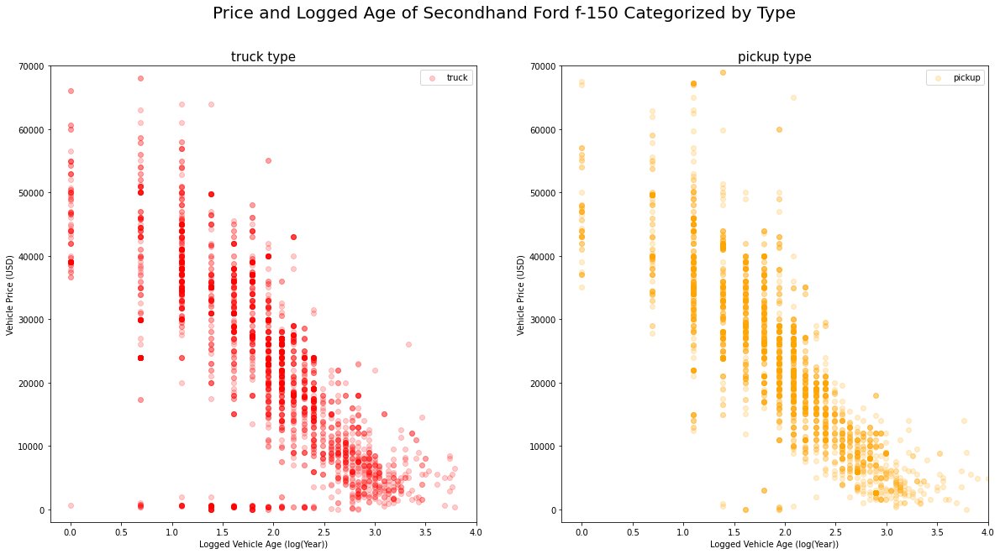

In [164]:
import matplotlib.pyplot as plt
import numpy as np
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
colors = {'truck':'red', 'pickup':'orange'}
fig.suptitle("Price and Logged Age of Secondhand Ford f-150 Categorized by Type", fontsize=20)
axs[0].scatter(x=np.log(df[df["type"]=="truck"]["age"]), y="price",data=df[df["type"]=="truck"],\
            color=colors["truck"],alpha=0.2)
axs[0].set_title('truck type', fontsize=15)
axs[0].set_xlabel("Logged Vehicle Age (log(Year))", fontsize=10)
axs[0].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[0].set_xlim([-0.2,4])
axs[0].set_ylim([-2000,70000])
axs[0].legend(["truck"],loc="upper right", fontsize=10)
axs[1].scatter(x=np.log(df[df["type"]=="pickup"]["age"]), y="price",data=df[df["type"]=="pickup"],\
            color=colors["pickup"],alpha=0.2)
axs[1].set_title('pickup type', fontsize=15)
axs[1].set_xlabel("Logged Vehicle Age (log(Year))", fontsize=10)
axs[1].set_ylabel("Vehicle Price (USD)", fontsize=10)
axs[1].set_xlim([-0.2,4])
axs[1].set_ylim([-2000,70000])
axs[1].legend(["pickup"],loc="upper right", fontsize=10)

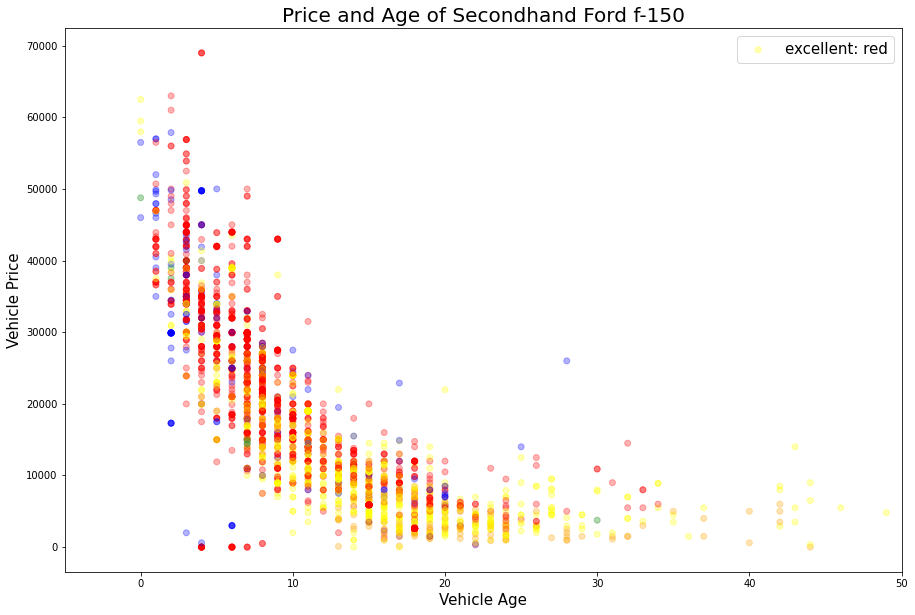

In [40]:
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', \
          'good':'yellow', 'like new':'blue', \
          'new':'green', 'salvage':'purple'}
plt.figure(figsize=(15,10))
plt.scatter(x="age", y="price",data=df, \
            c=df["condition"].astype('category').map(colors),alpha=0.3)
plt.xlabel("Vehicle Age", fontsize=15)
plt.ylabel("Vehicle Price", fontsize=15)
plt.title("Price and Age of Secondhand Ford f-150", fontsize=20)
plt.legend(['excellent: red', 'fair: orange', \
          'good: yellow', 'like new: blue', \
          'new: green', 'salvage: purple'], loc ="upper right", fontsize=15)
plt.xlim([-5,50])
plt.show()  

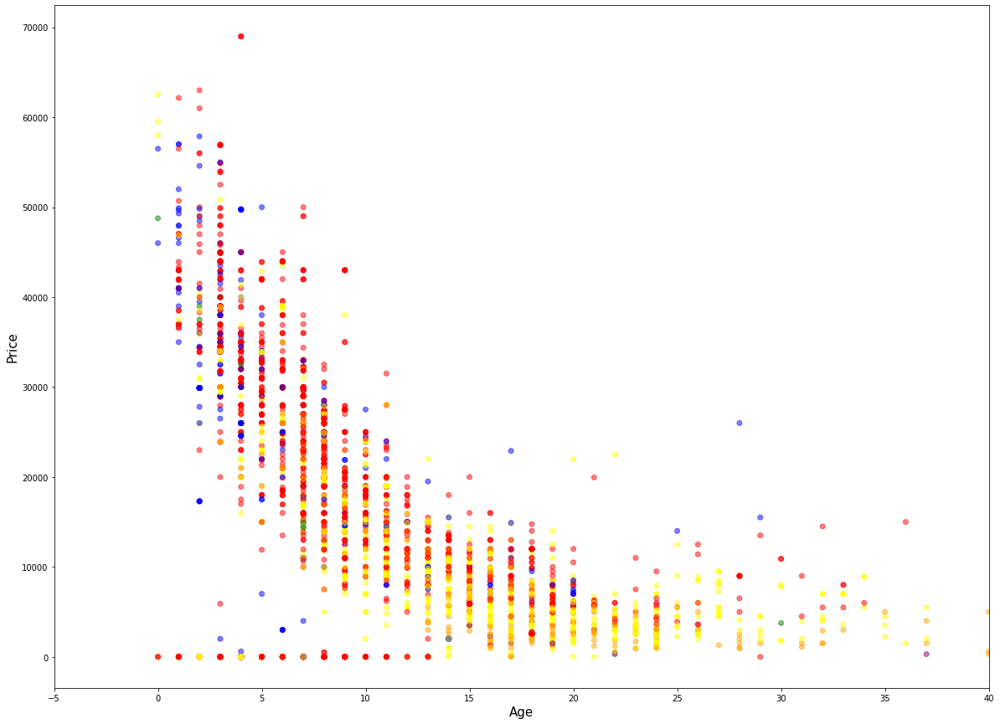

In [12]:
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', 'good':'yellow', 'like new':'blue', 'new':'green', 'salvage':'purple'}
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["price"],c=df["condition"].astype('category').map(colors),alpha=0.5)
plt.xlabel("Age", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5,40])
plt.show()

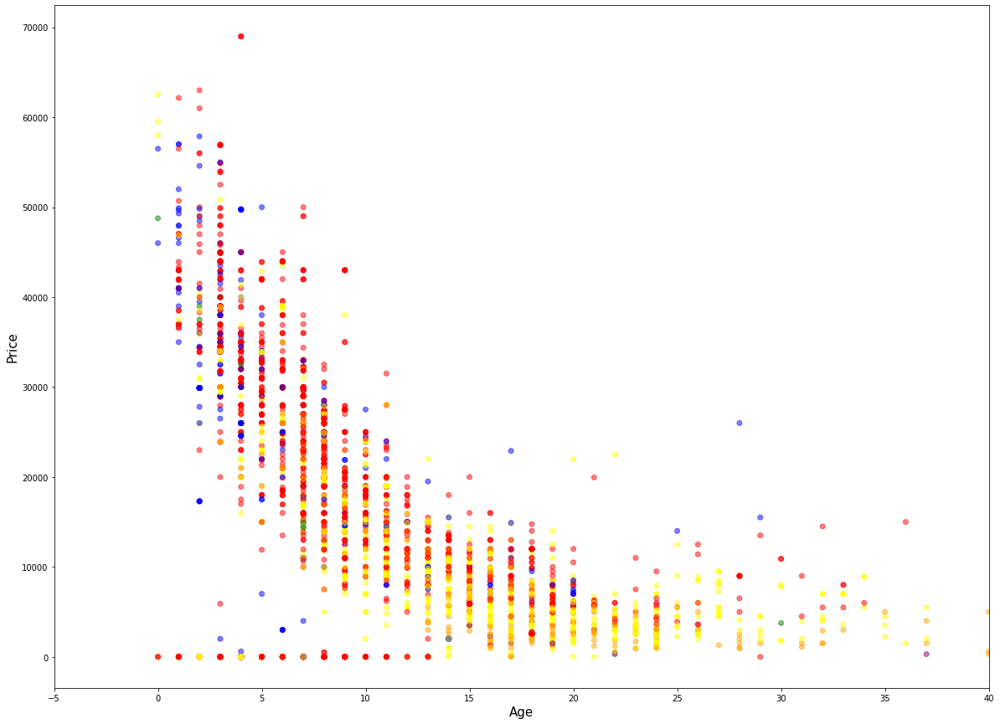

In [53]:
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', 'good':'yellow', 'like new':'blue', 'new':'green', 'salvage':'purple'}
alphas = {'excellent':0.5, 'fair':0.5, 'good':0.5, 'like new':0.5, 'new':0.5, 'salvage':0.5,'none':0}
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["price"],c=df["condition"].astype('category').map(colors),alpha=df["condition"].astype('category').map(alphas))
plt.xlabel("Age", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5,40])
plt.show()

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


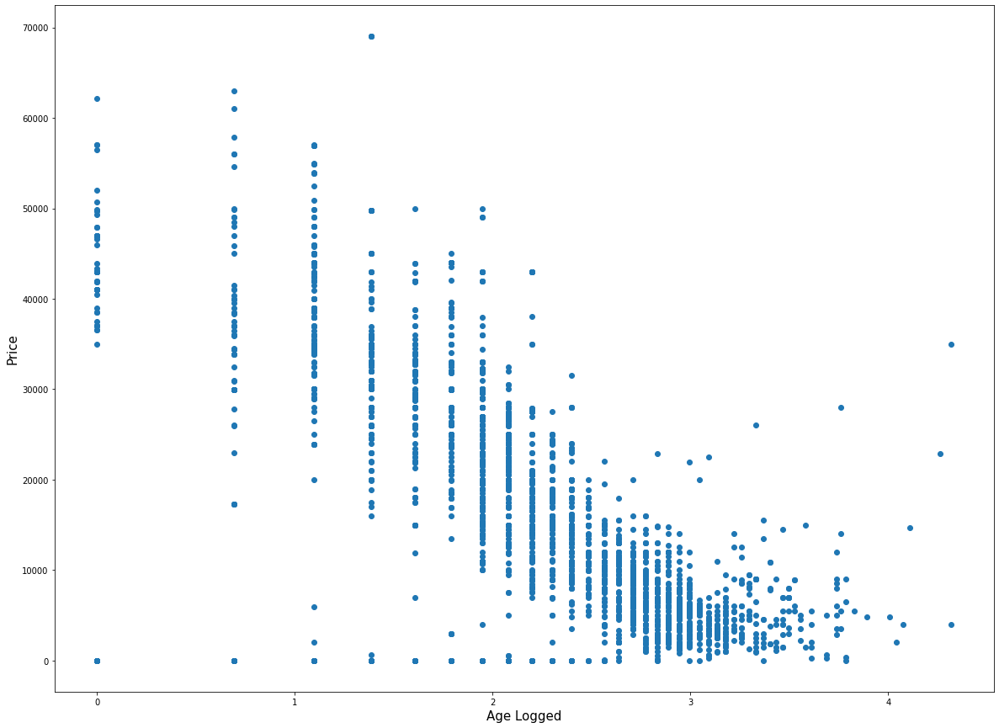

In [54]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["age"]), df["price"])
plt.xlabel("Age Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


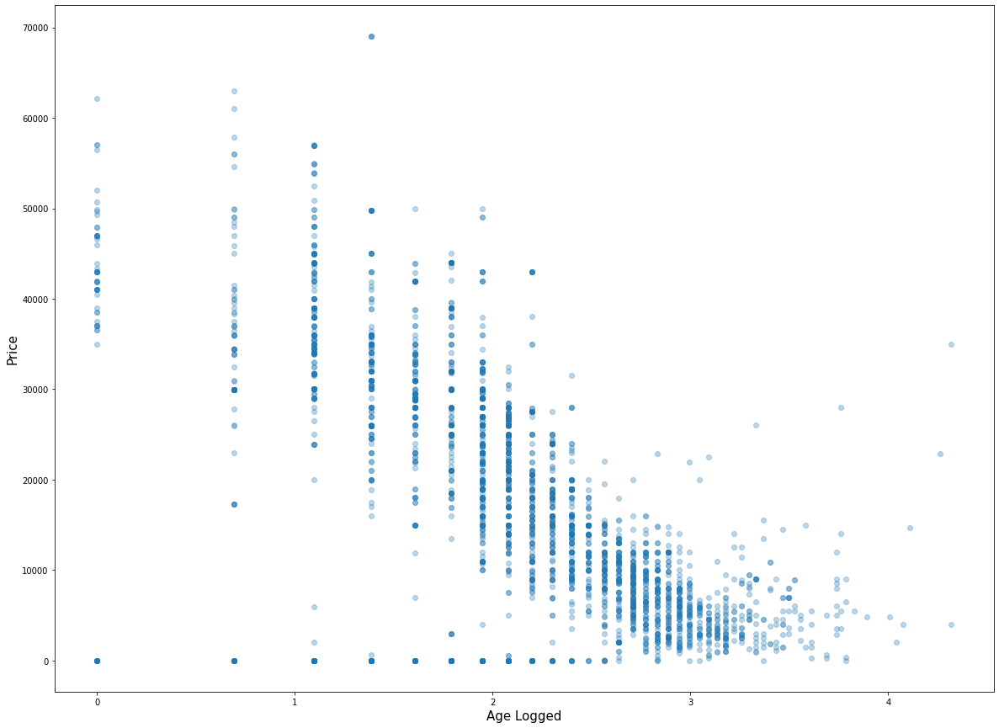

In [16]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["age"]), df["price"],alpha=0.3)
plt.xlabel("Age Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

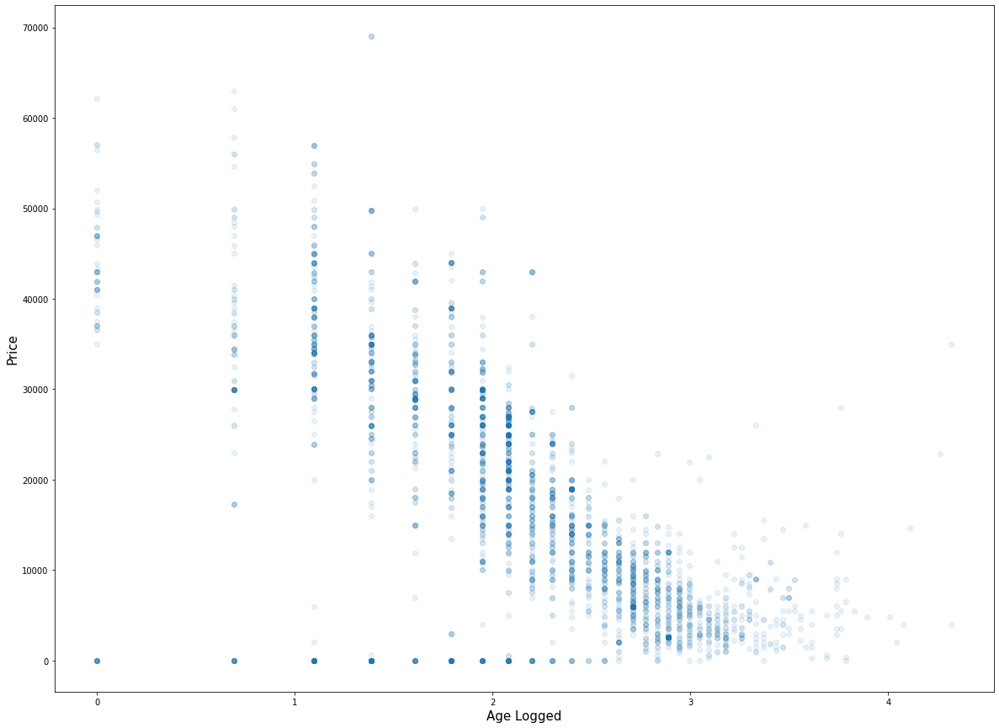

In [17]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["age"]), df["price"],alpha=0.1)
plt.xlabel("Age Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


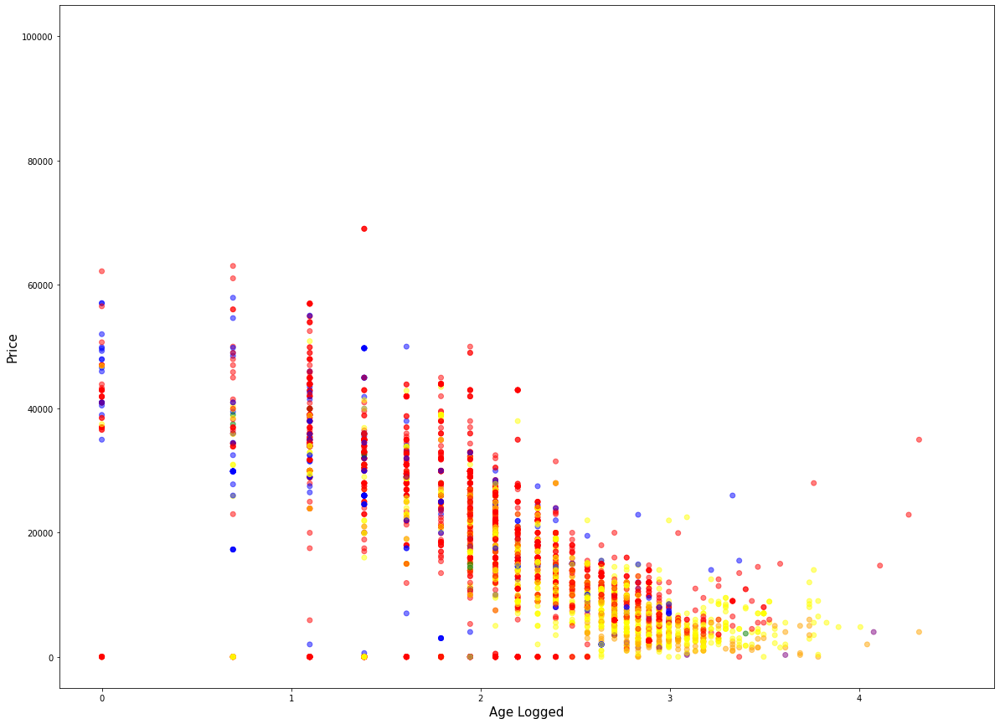

In [57]:
import numpy as np
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', 'good':'yellow', 'like new':'blue', 'new':'green', 'salvage':'purple','none':'pink'}
alphas = {'excellent':0.5, 'fair':0.5, 'good':0.5, 'like new':0.5, 'new':0.5, 'salvage':0.5,'none':0}
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["age"]), df["price"],c=df["condition"].astype('category').map(colors),alpha=df["condition"].astype('category').map(alphas))
plt.xlabel("Age Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


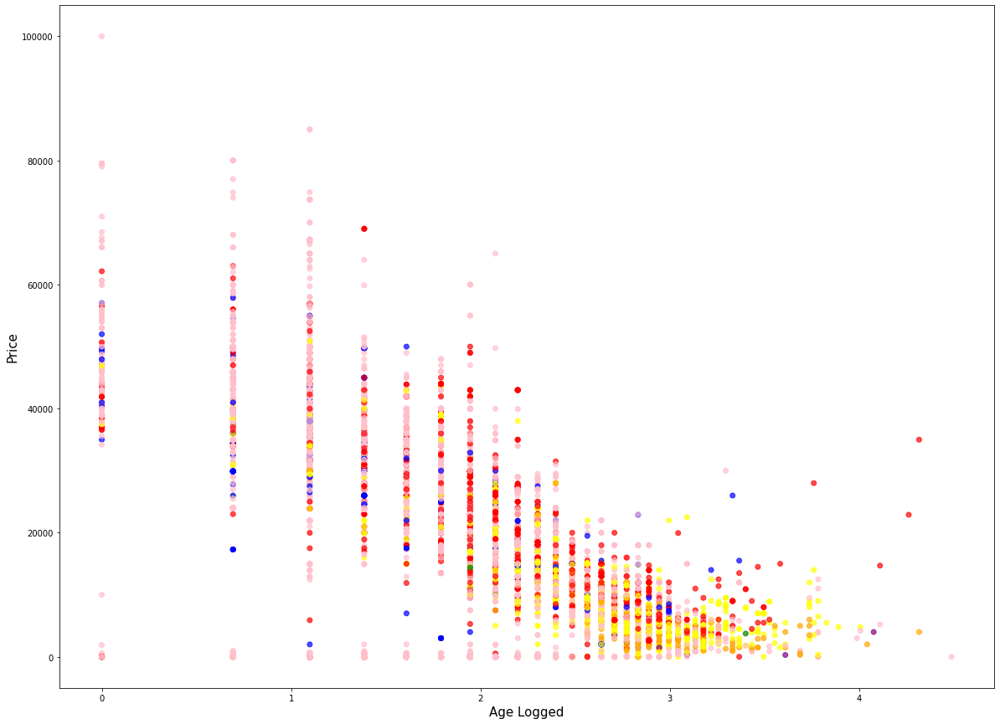

In [58]:
import numpy as np
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', 'good':'yellow', 'like new':'blue', 'new':'green', 'salvage':'purple','none':'pink'}
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["age"]), df["price"],c=df["condition"].astype('category').map(colors),alpha=0.7)
plt.xlabel("Age Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

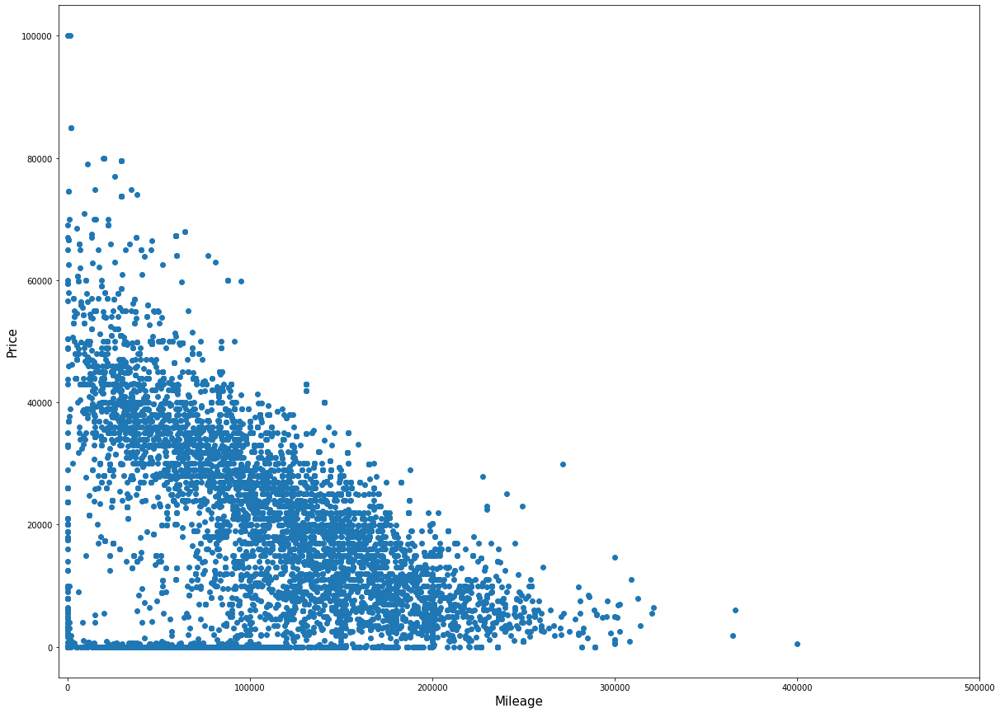

In [12]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["odometer"], df["price"])
plt.xlabel("Mileage", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5000, 500000])
plt.show()

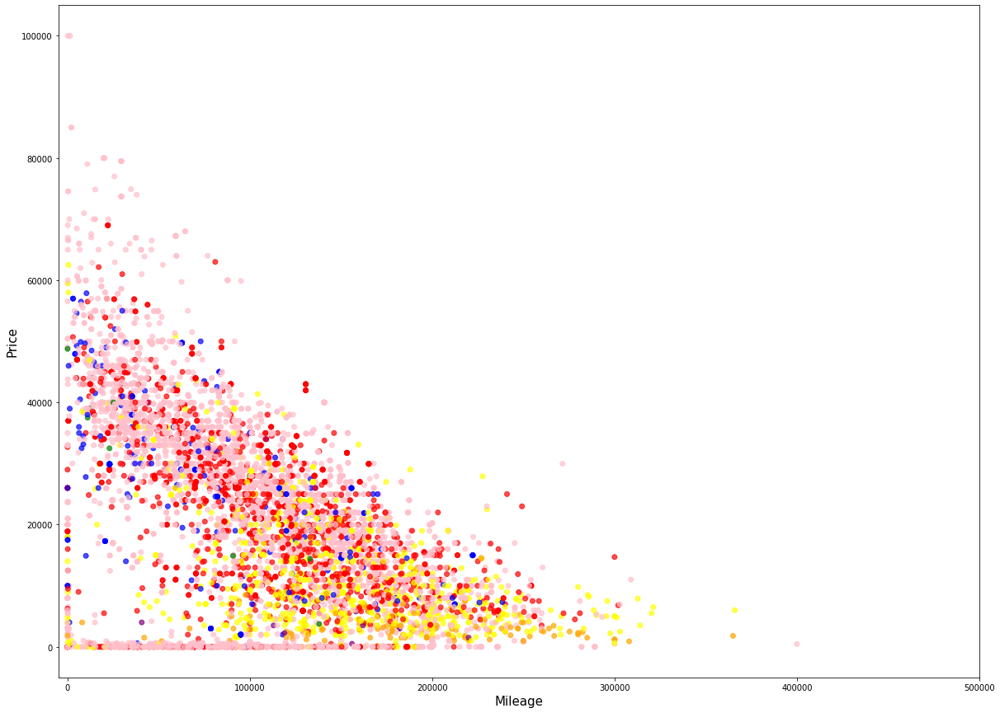

In [50]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
colors = {'excellent':'red', 'fair':'orange', 'good':'yellow', 'like new':'blue', 'new':'green', 'salvage':'purple','none':'pink'}
plt.scatter(df["odometer"], df["price"],c=df["condition"].astype('category').map(colors),alpha=0.7)
plt.xlabel("Mileage", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5000, 500000])
plt.show()

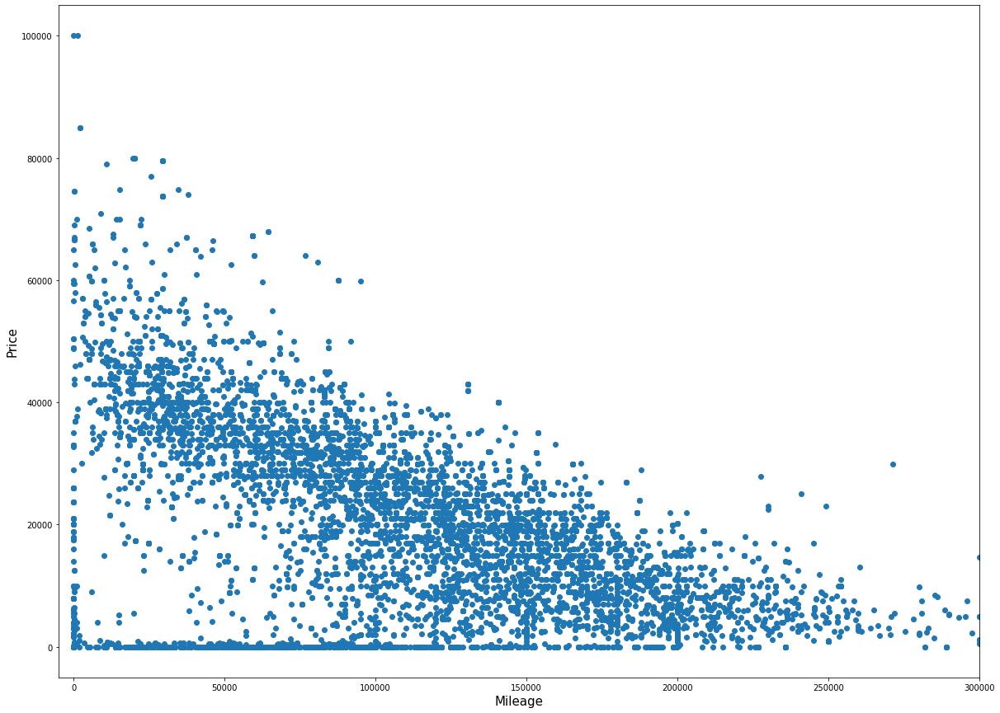

In [32]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["odometer"], df["price"])
plt.xlabel("Mileage", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5000, 300000])
plt.show() 

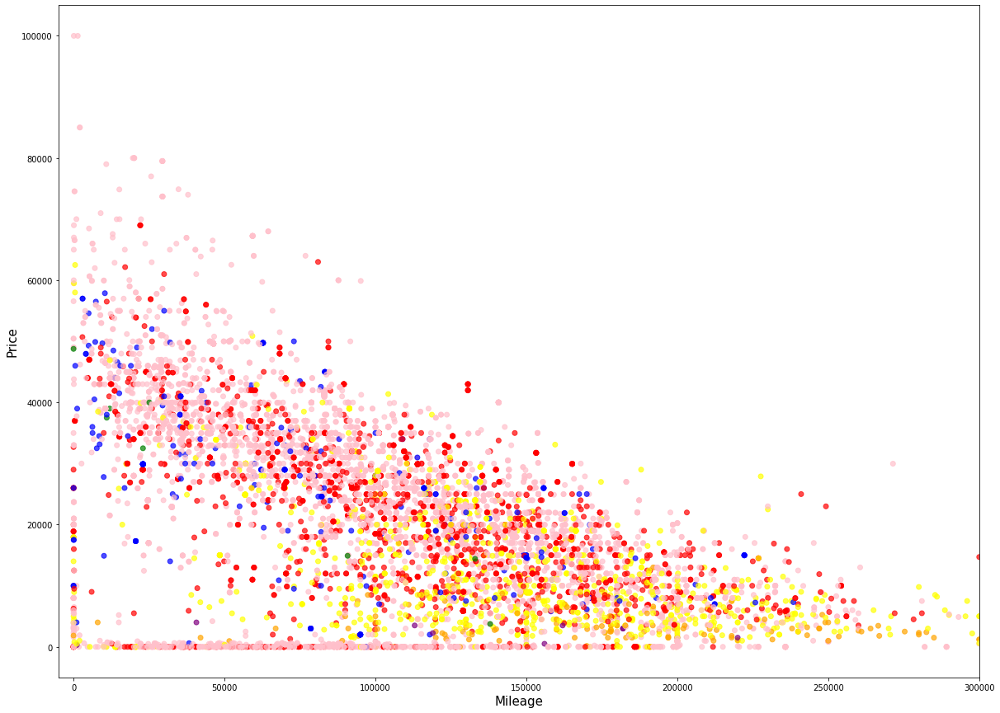

In [51]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
colors = {'excellent':'red', 'fair':'orange', 'good':'yellow', 'like new':'blue', 'new':'green', 'salvage':'purple','none':'pink'}
plt.scatter(df["odometer"], df["price"],c=df["condition"].astype('category').map(colors),alpha=0.7)
plt.xlabel("Mileage", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5000, 300000])
plt.show() 

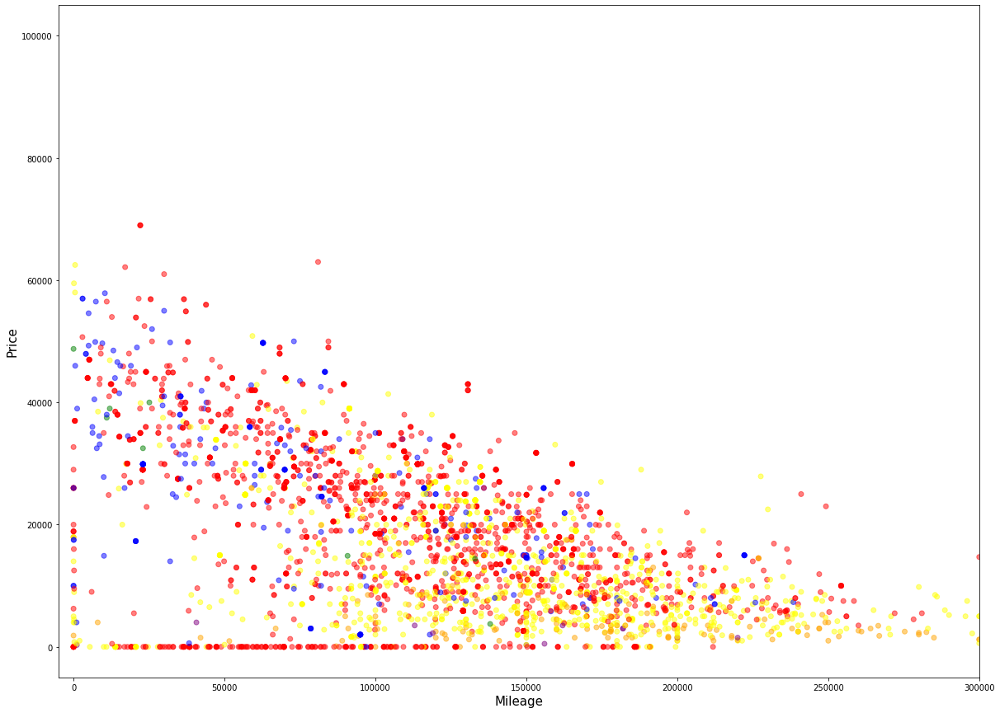

In [55]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
colors = {'excellent':'red', 'fair':'orange', 'good':'yellow', 'like new':'blue', 'new':'green', 'salvage':'purple','none':'pink'}
alphas = {'excellent':0.5, 'fair':0.5, 'good':0.5, 'like new':0.5, 'new':0.5, 'salvage':0.5,'none':0}
plt.scatter(df["odometer"], df["price"],c=df["condition"].astype('category').map(colors),alpha=df["condition"].astype('category').map(alphas))
plt.xlabel("Mileage", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5000, 300000])
plt.show() 

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


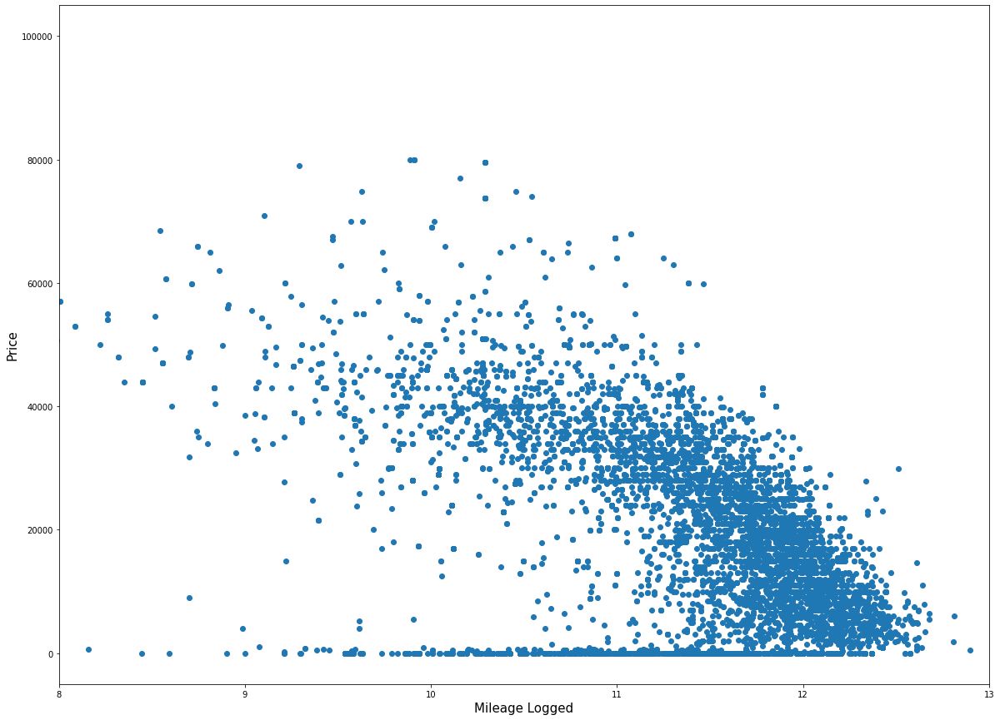

In [41]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["odometer"]), df["price"])
plt.xlabel("Mileage Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([8, 13])
plt.show() 

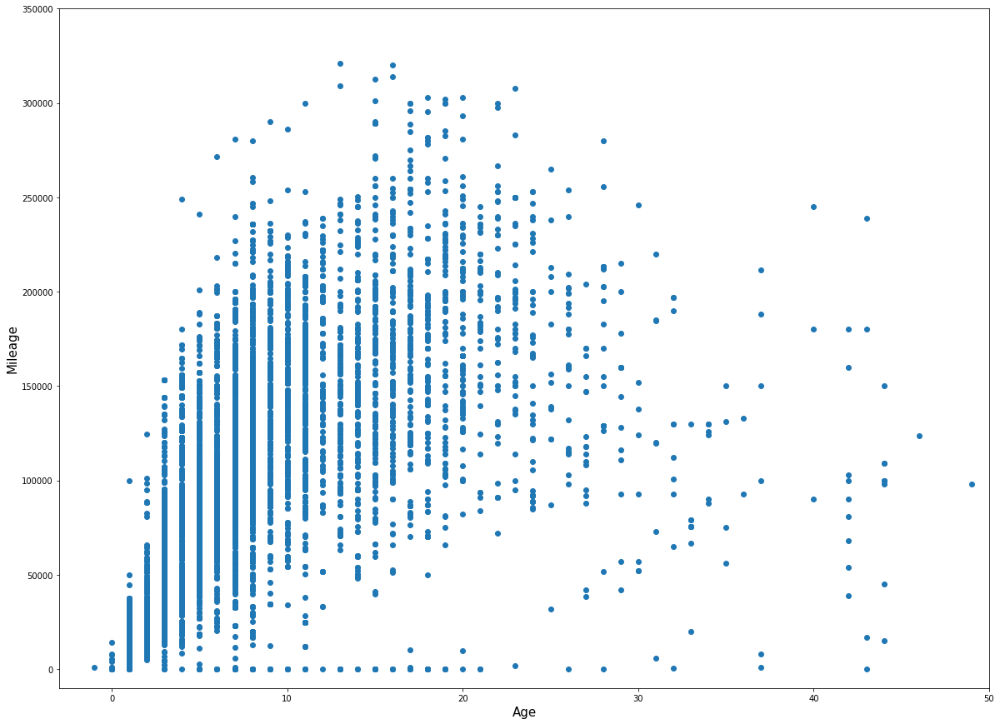

In [55]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["odometer"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Mileage", fontsize=15)
plt.xlim([-3,50])
plt.ylim([-10000,350000])
plt.show() 

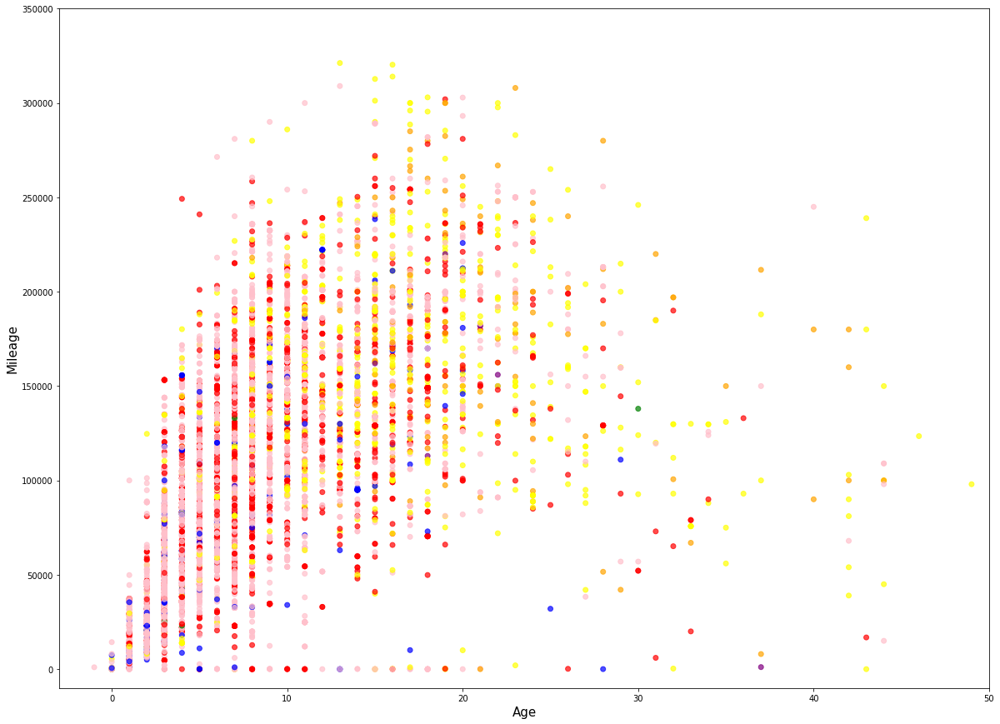

In [52]:
import numpy as np
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', 'good':'yellow', 'like new':'blue', 'new':'green', 'salvage':'purple','none':'pink'}
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["odometer"],c=df["condition"].astype('category').map(colors),alpha=0.7)
plt.xlabel("Age", fontsize=15)
plt.ylabel("Mileage", fontsize=15)
plt.xlim([-3,50])
plt.ylim([-10000,350000])
plt.show() 

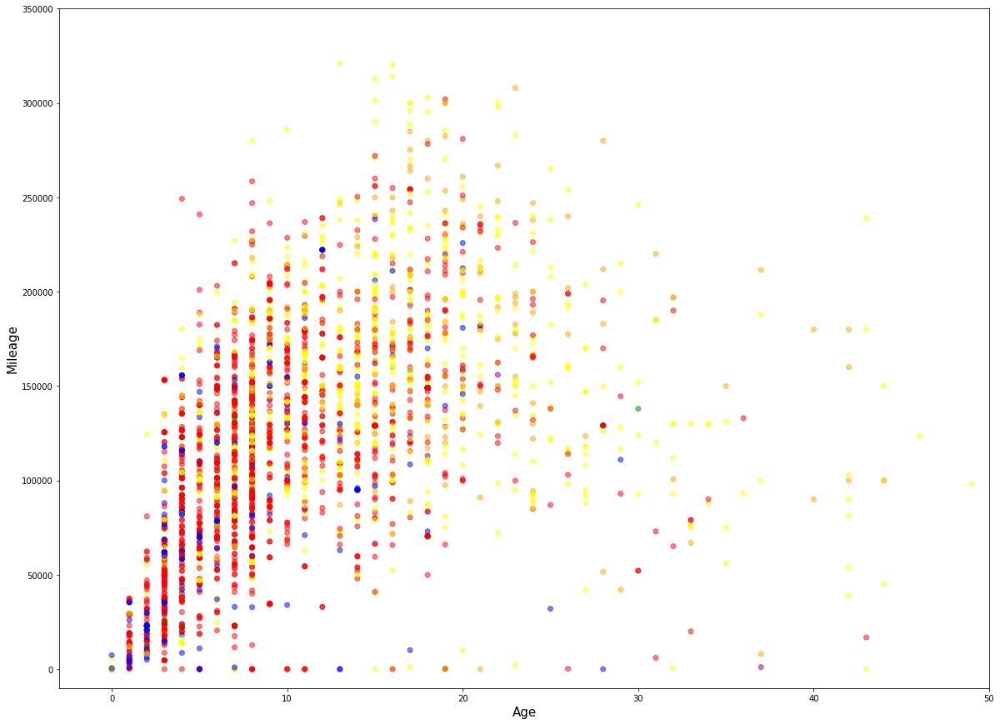

In [54]:
import numpy as np
import matplotlib.pyplot as plt
colors = {'excellent':'red', 'fair':'orange', 'good':'yellow', 'like new':'blue', 'new':'green', 'salvage':'purple','none':'pink'}
alphas = {'excellent':0.5, 'fair':0.5, 'good':0.5, 'like new':0.5, 'new':0.5, 'salvage':0.5,'none':0}
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["odometer"],c=df["condition"].astype('category').map(colors),alpha=df["condition"].astype('category').map(alphas))
plt.xlabel("Age", fontsize=15)
plt.ylabel("Mileage", fontsize=15)
plt.xlim([-3,50])
plt.ylim([-10000,350000])
plt.show() 

In [56]:
df = vehicle_2[vehicle_2["model"]=='silverado 1500']
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)

/tmp/ipykernel_1816880/2323307577.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_1816880/2323307577.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_1816880/2323307577.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

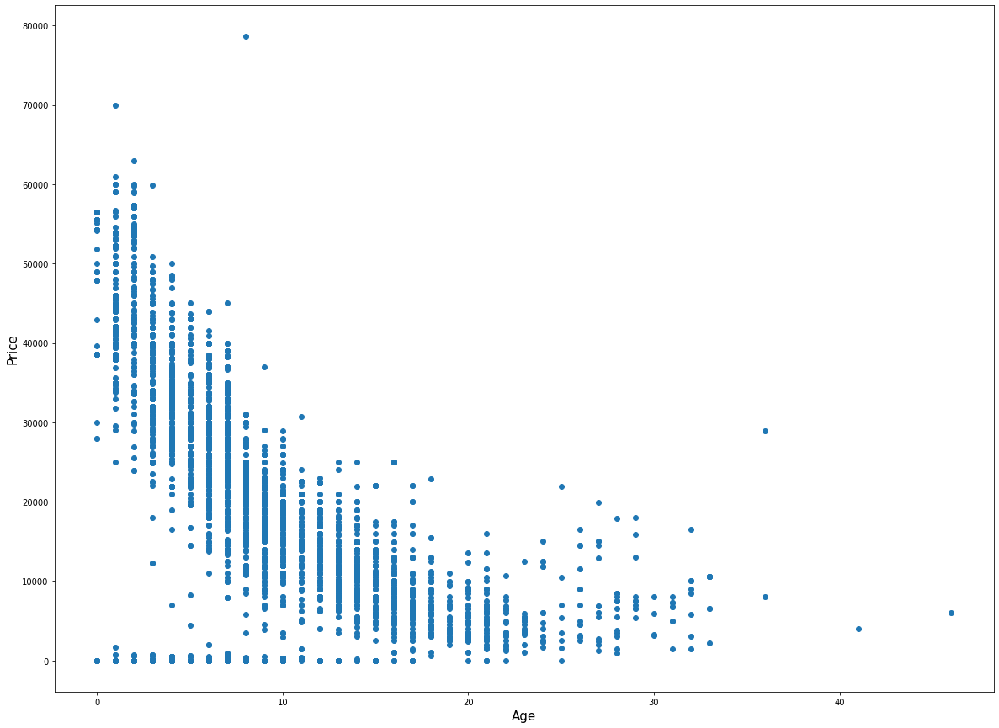

In [34]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["price"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

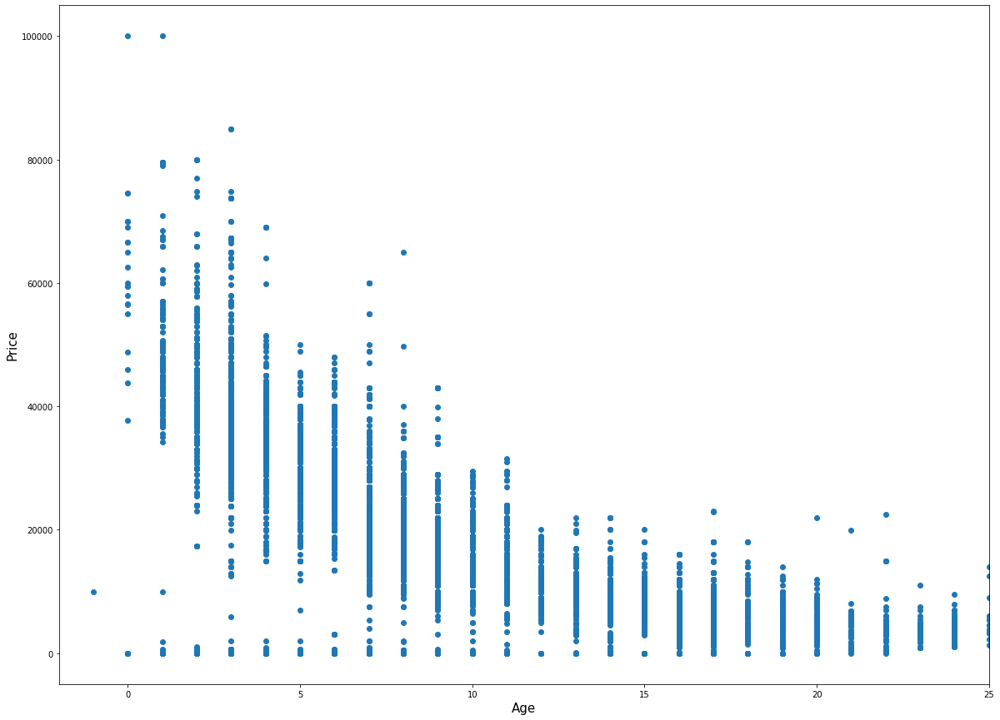

In [14]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["price"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-2,25])
plt.show() 

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


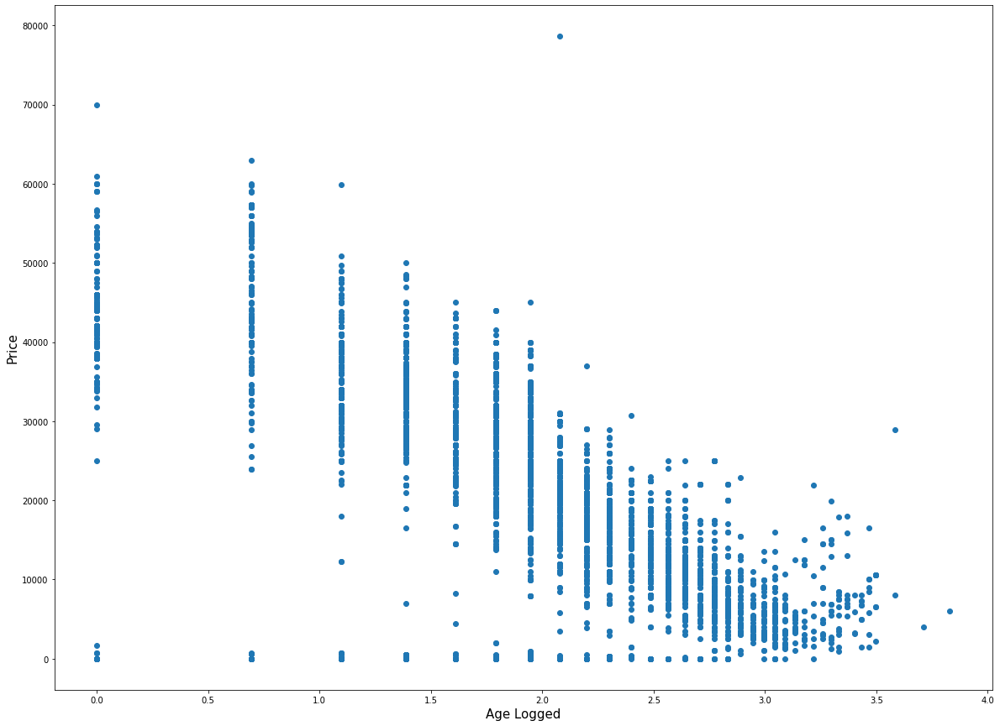

In [35]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["age"]), df["price"])
plt.xlabel("Age Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

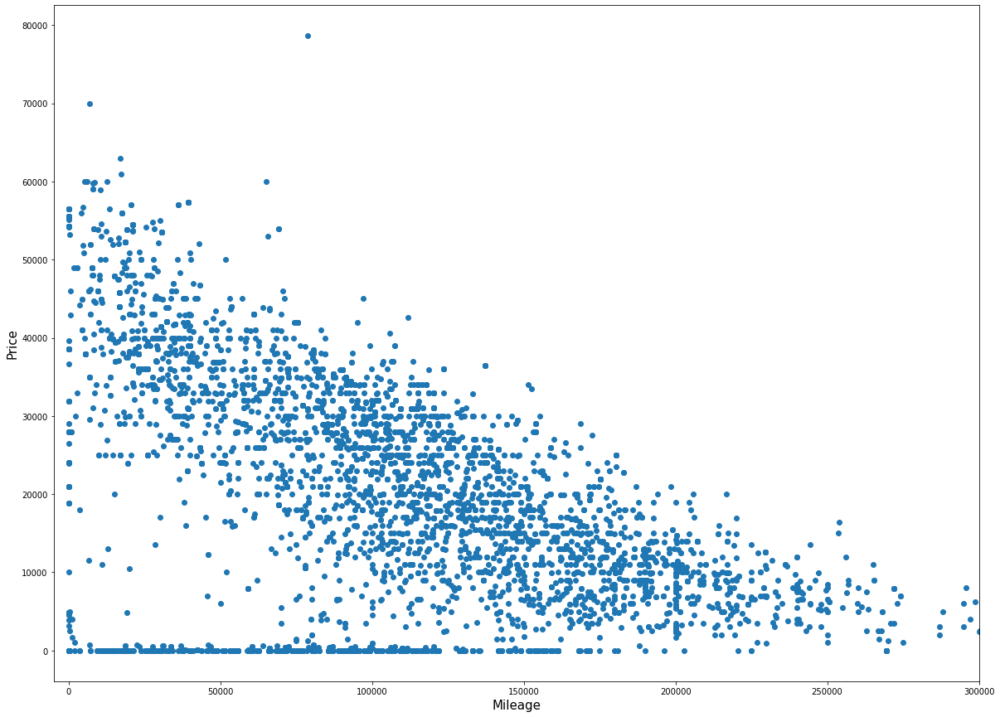

In [36]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["odometer"], df["price"])
plt.xlabel("Mileage", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5000, 300000])
plt.show() 

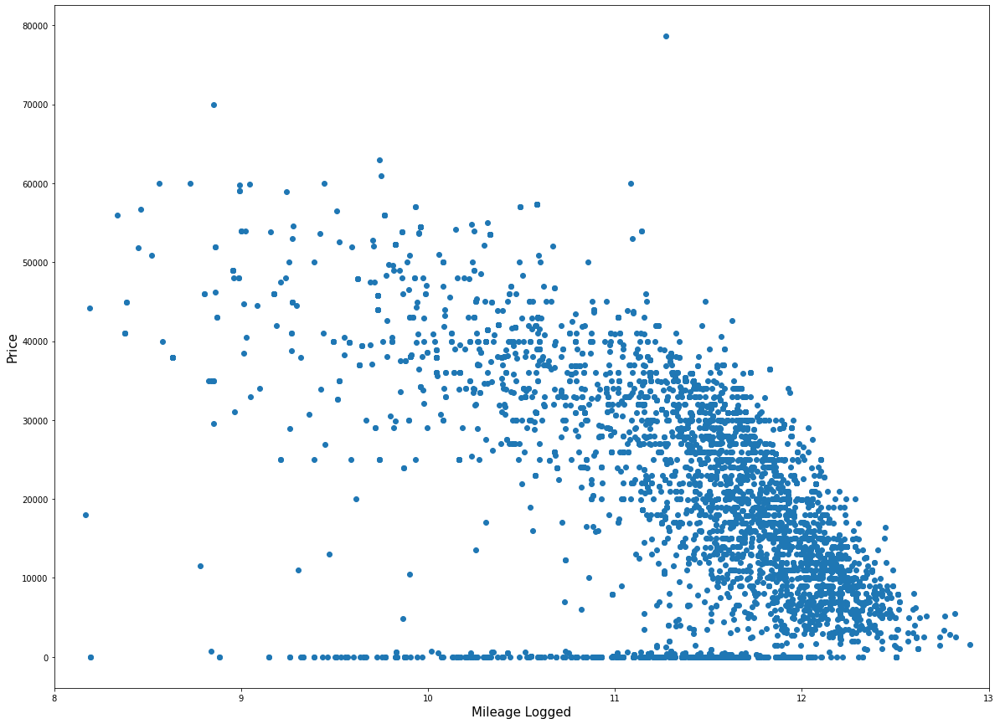

In [39]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["odometer"]), df["price"])
plt.xlabel("Mileage Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([8, 13])
plt.show() 

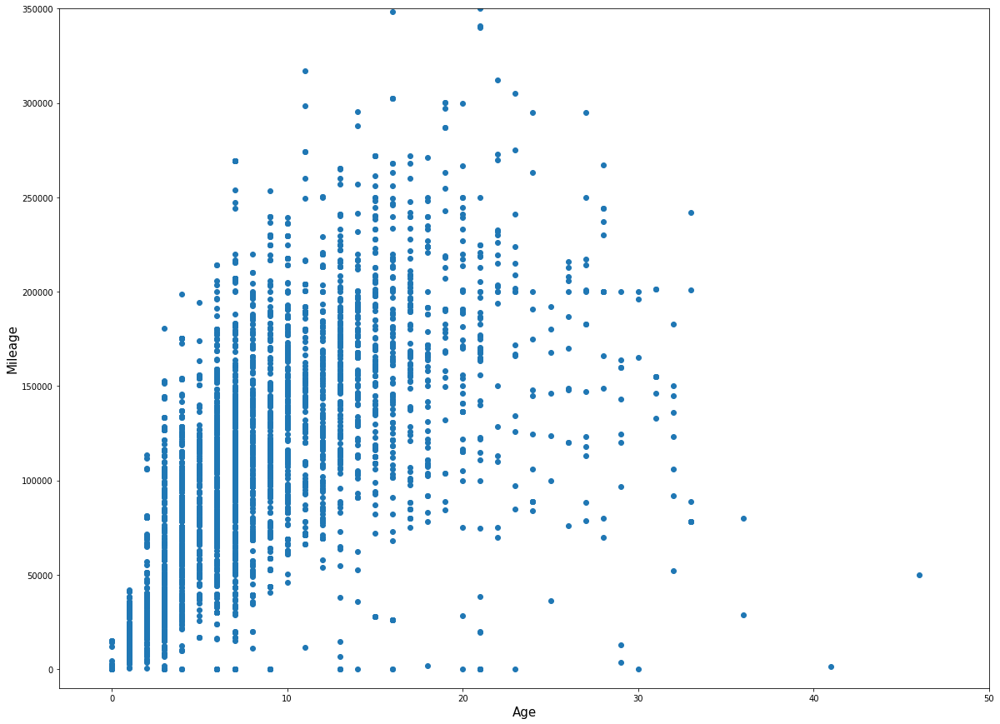

In [57]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["odometer"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Mileage", fontsize=15)
plt.xlim([-3,50])
plt.ylim([-10000,350000])
plt.show() 

In [58]:
df = vehicle_2[vehicle_2["model"]=='1500']
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)

/tmp/ipykernel_1816880/2848382175.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_1816880/2848382175.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_1816880/2848382175.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

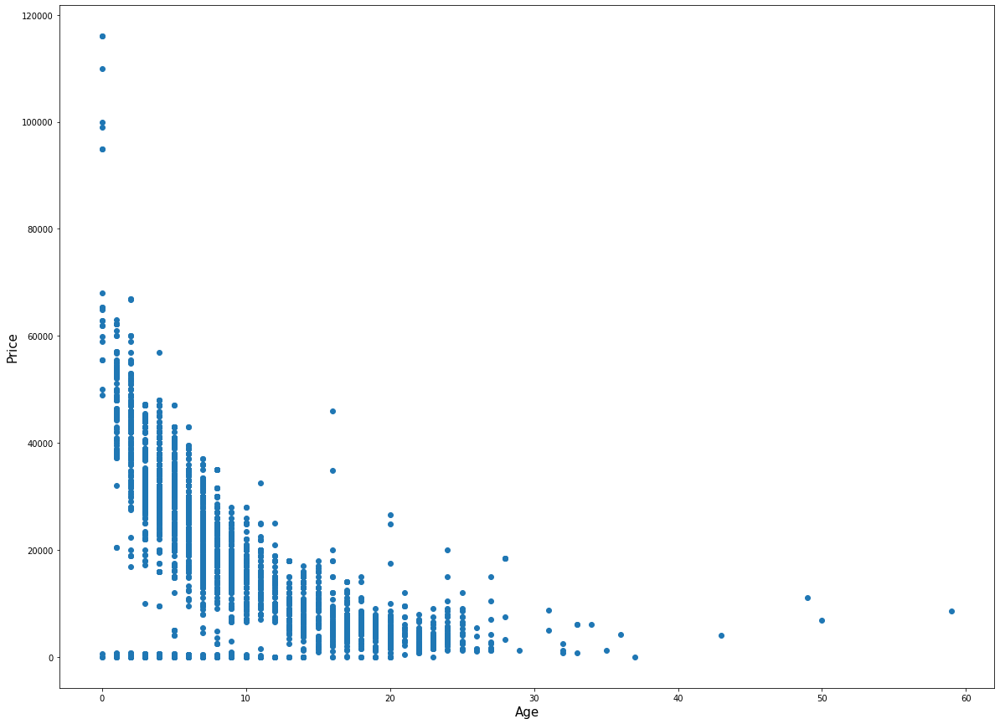

In [43]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["price"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


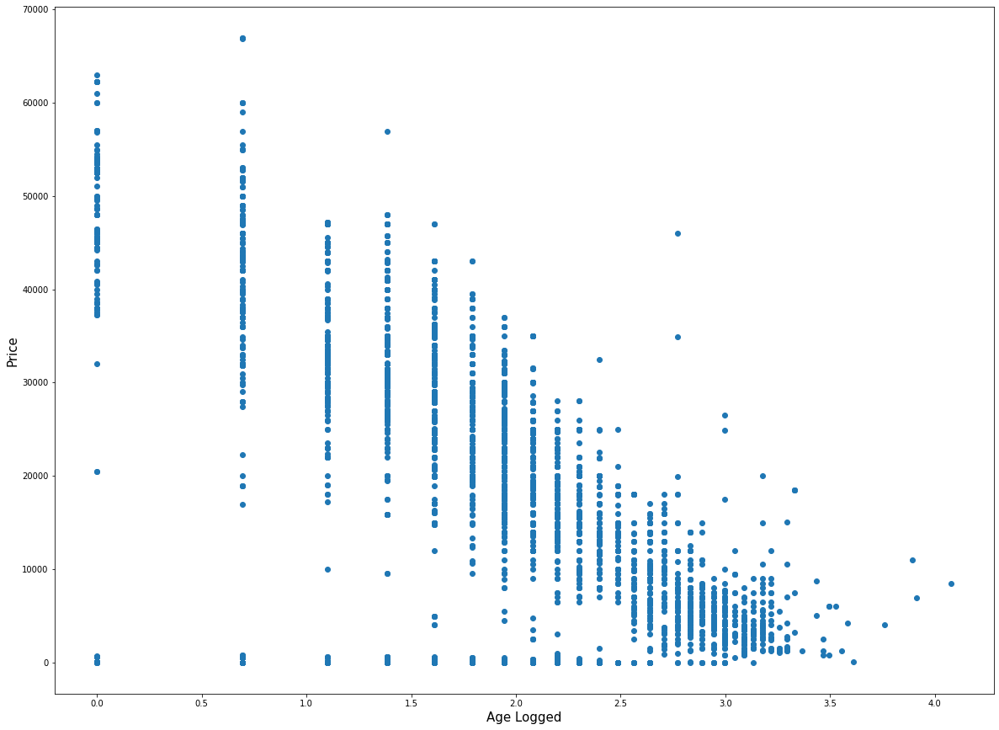

In [44]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["age"]), df["price"])
plt.xlabel("Age Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

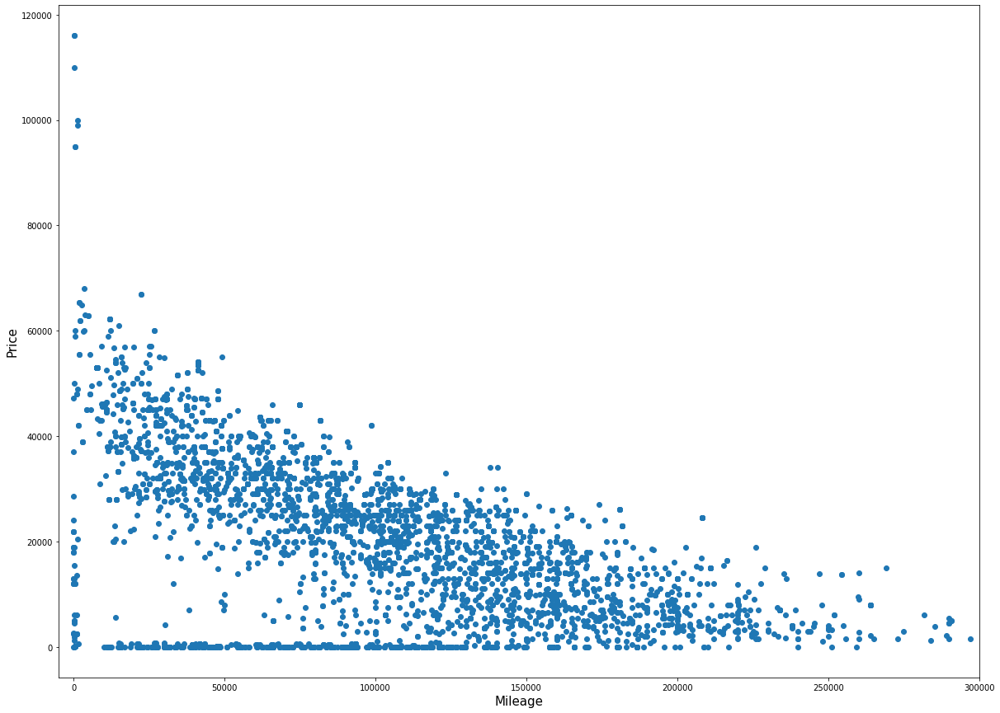

In [45]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["odometer"], df["price"])
plt.xlabel("Mileage", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5000, 300000])
plt.show() 

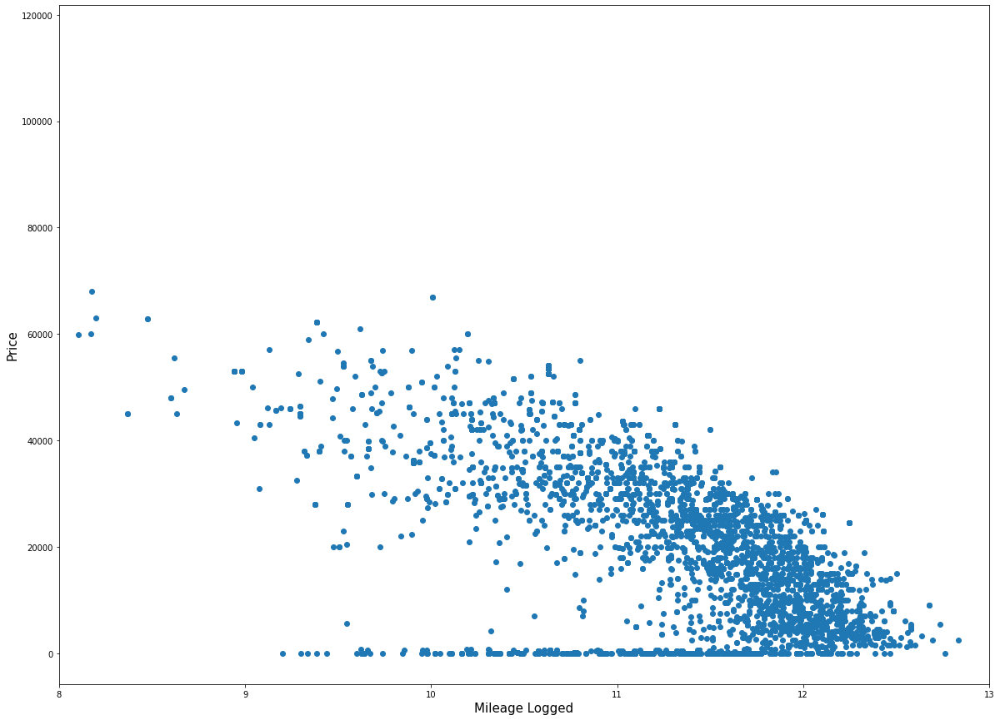

In [46]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["odometer"]), df["price"])
plt.xlabel("Mileage Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([8, 13])
plt.show() 

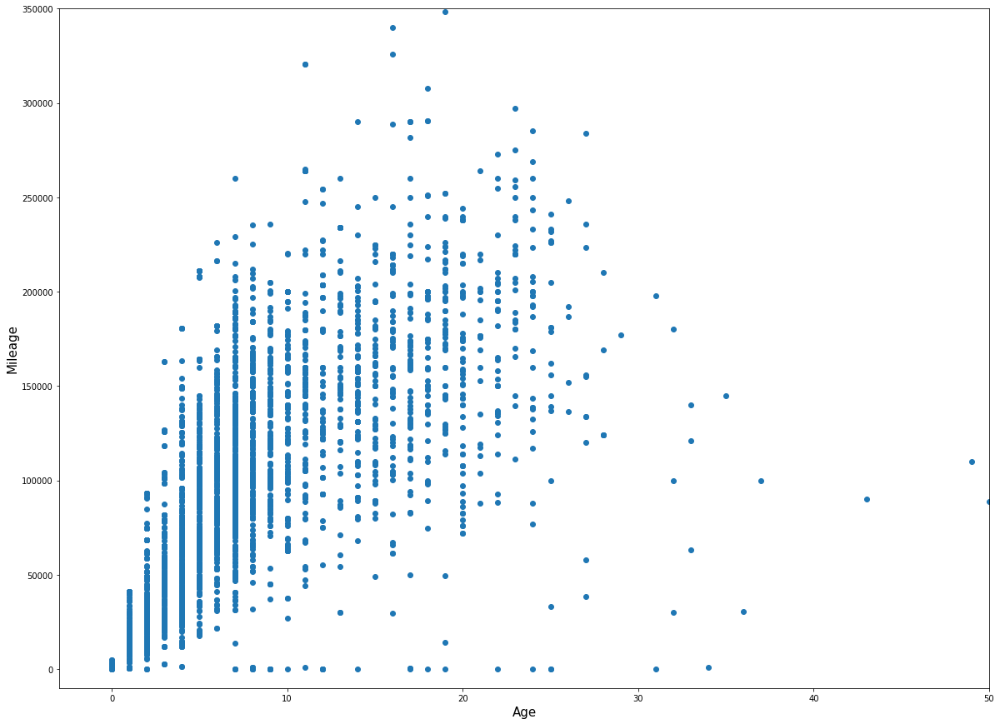

In [59]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["odometer"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Mileage", fontsize=15)
plt.xlim([-3,50])
plt.ylim([-10000,350000])
plt.show() 

In [60]:
df = vehicle_2[vehicle_2["model"]=='camry']
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)

/tmp/ipykernel_1816880/1492278436.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_1816880/1492278436.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_1816880/1492278436.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

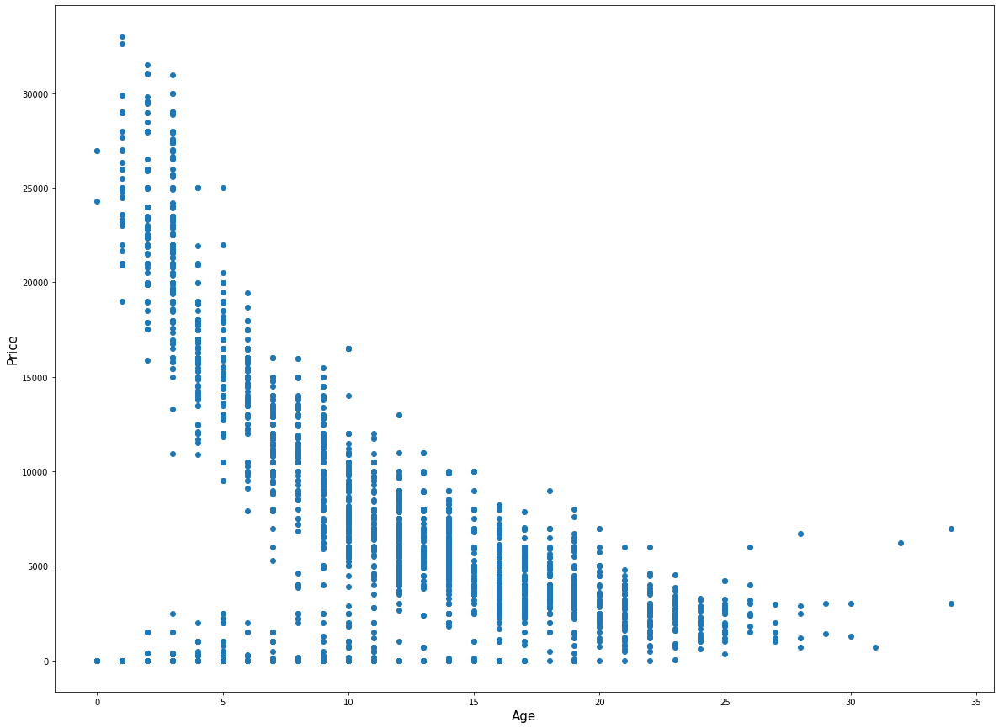

In [61]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["price"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


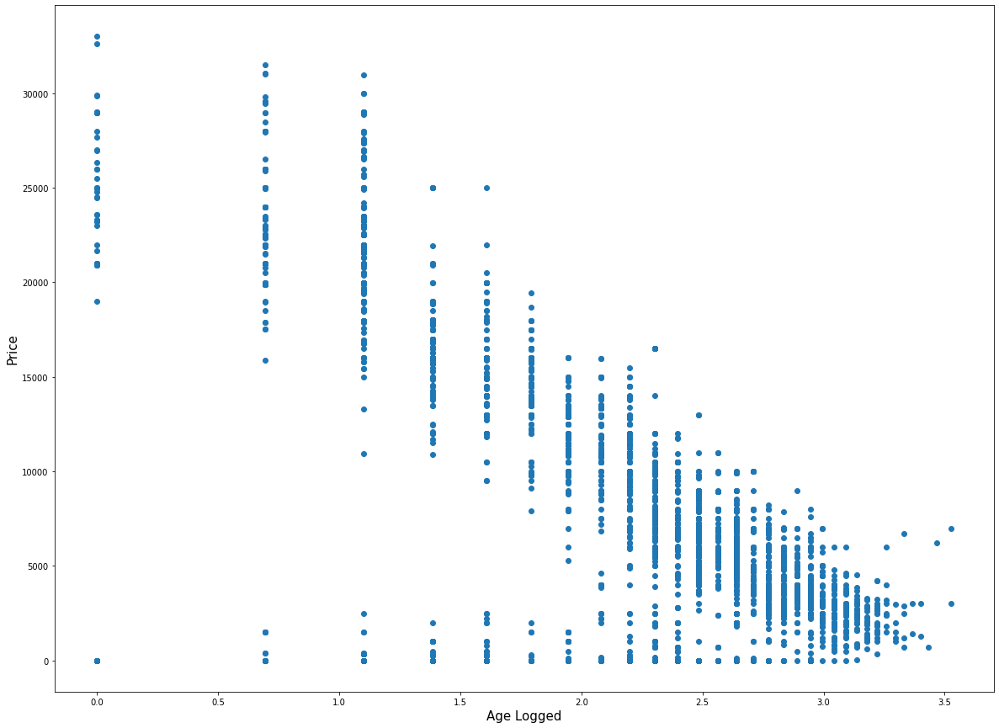

In [62]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["age"]), df["price"])
plt.xlabel("Age Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show()

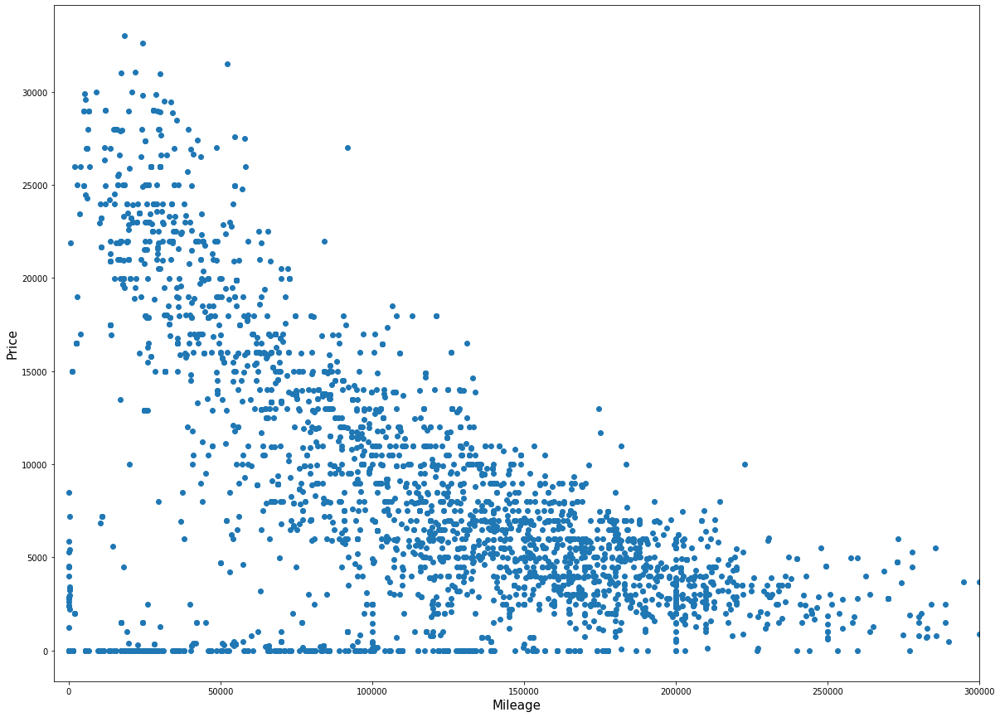

In [63]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["odometer"], df["price"])
plt.xlabel("Mileage", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5000, 300000])
plt.show() 

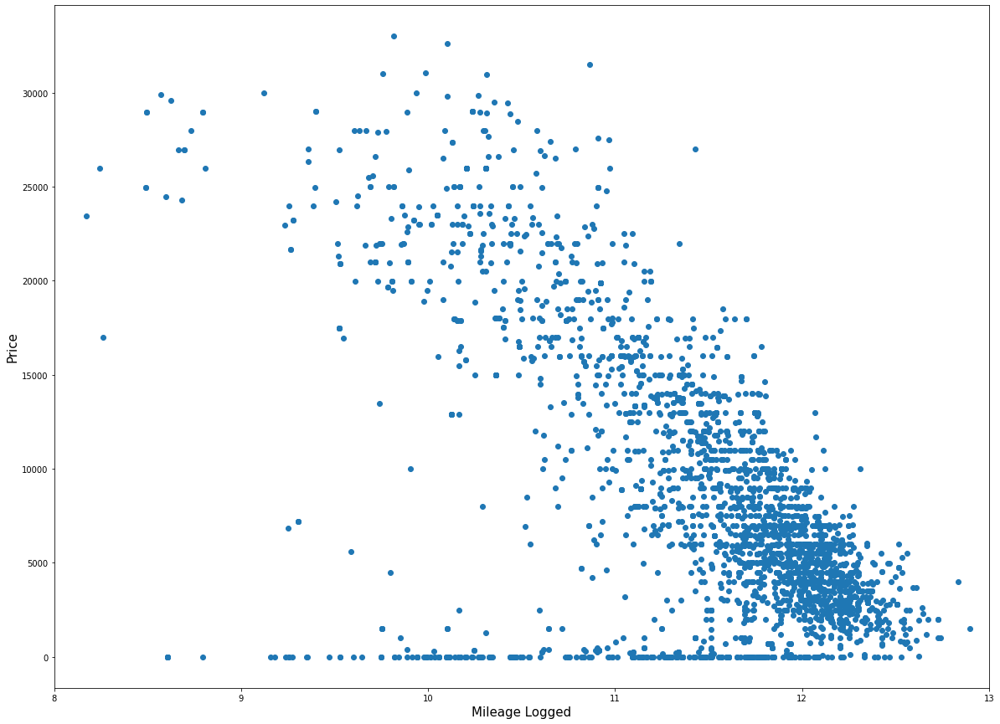

In [64]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["odometer"]), df["price"])
plt.xlabel("Mileage Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([8, 13])
plt.show() 

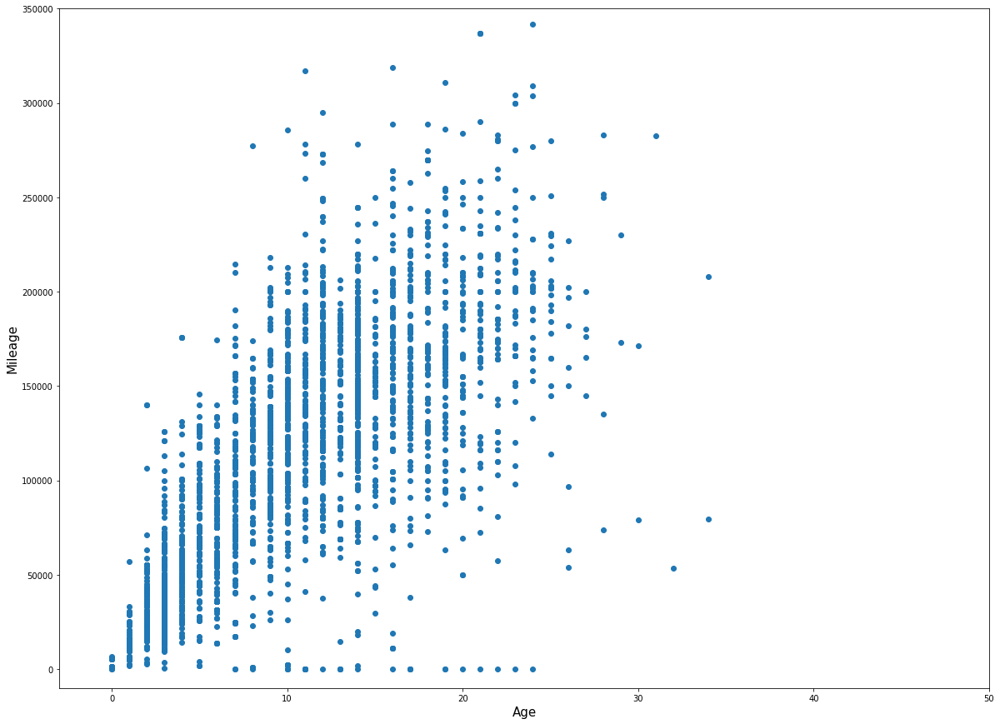

In [65]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["odometer"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Mileage", fontsize=15)
plt.xlim([-3,50])
plt.ylim([-10000,350000])
plt.show() 

In [66]:
df = vehicle_2[vehicle_2["model"]=='silverado']
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)

/tmp/ipykernel_1816880/3604883723.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_1816880/3604883723.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_1816880/3604883723.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

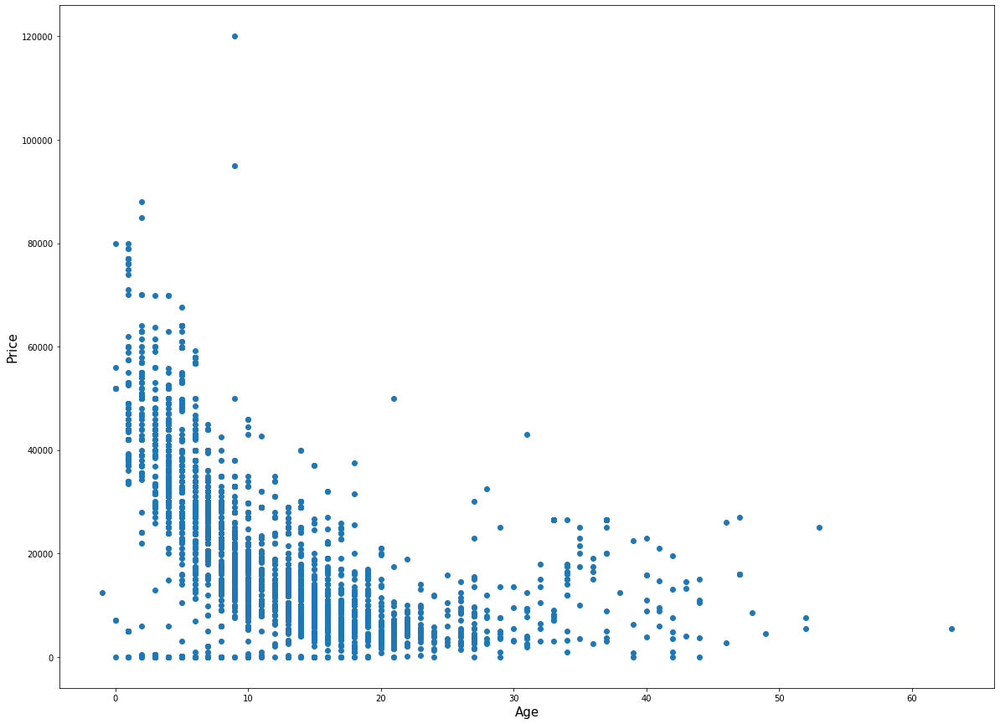

In [67]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["price"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


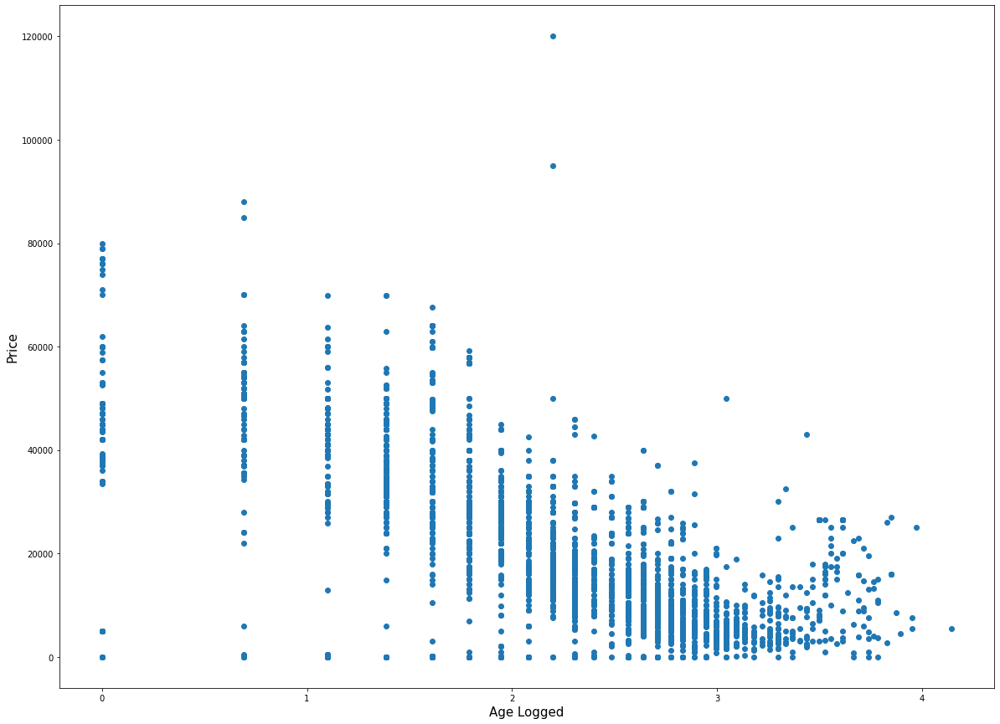

In [68]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["age"]), df["price"])
plt.xlabel("Age Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show()

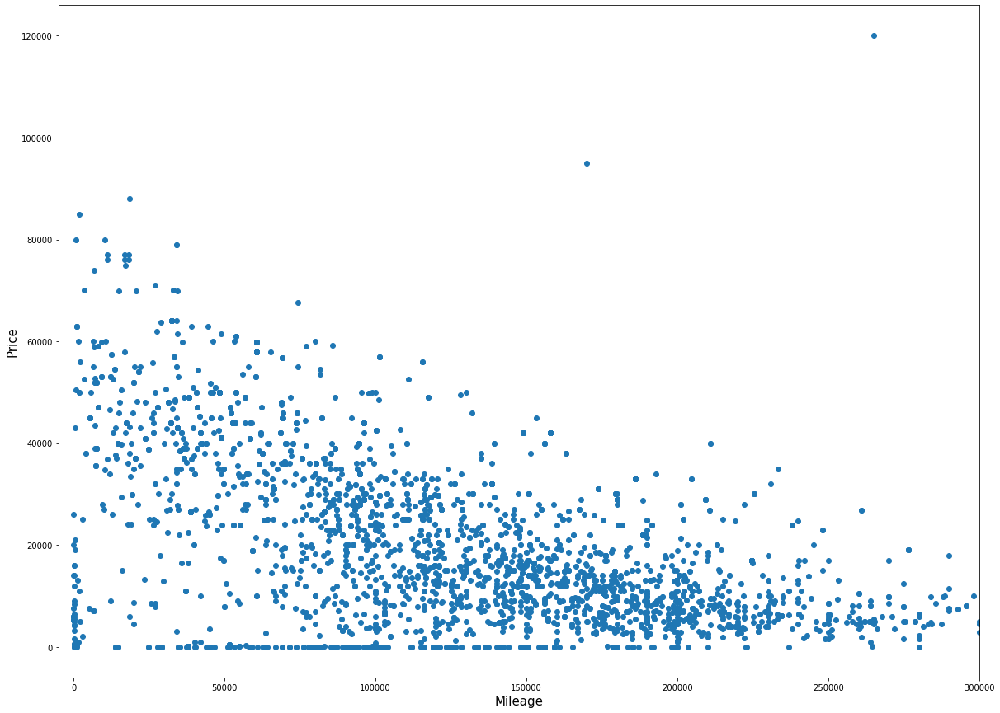

In [69]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["odometer"], df["price"])
plt.xlabel("Mileage", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5000, 300000])
plt.show() 

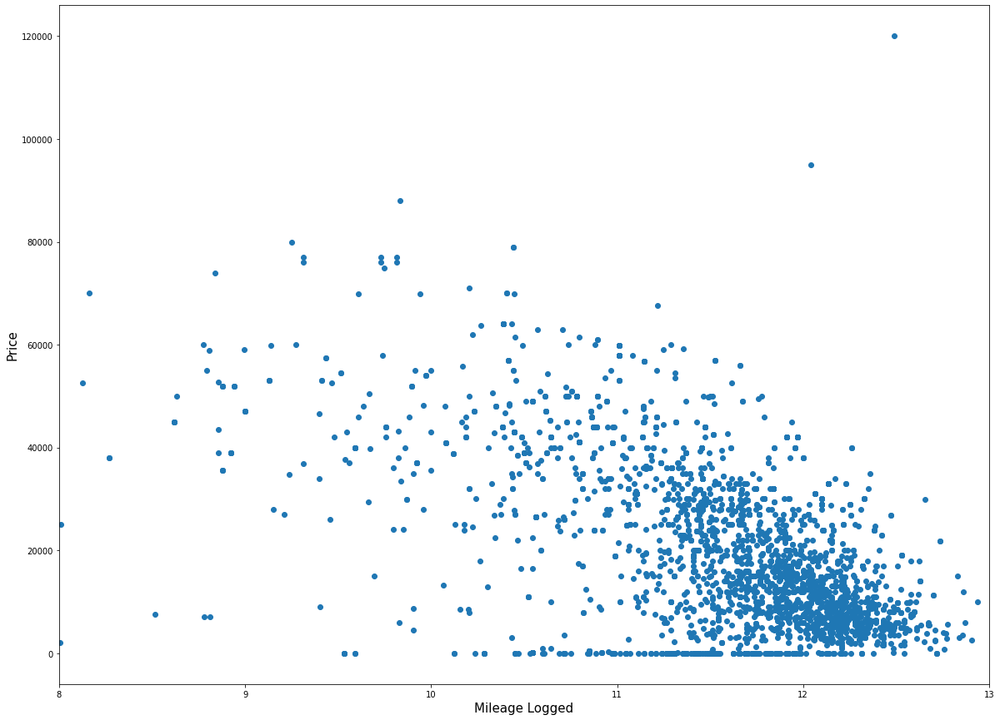

In [70]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["odometer"]), df["price"])
plt.xlabel("Mileage Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([8, 13])
plt.show() 

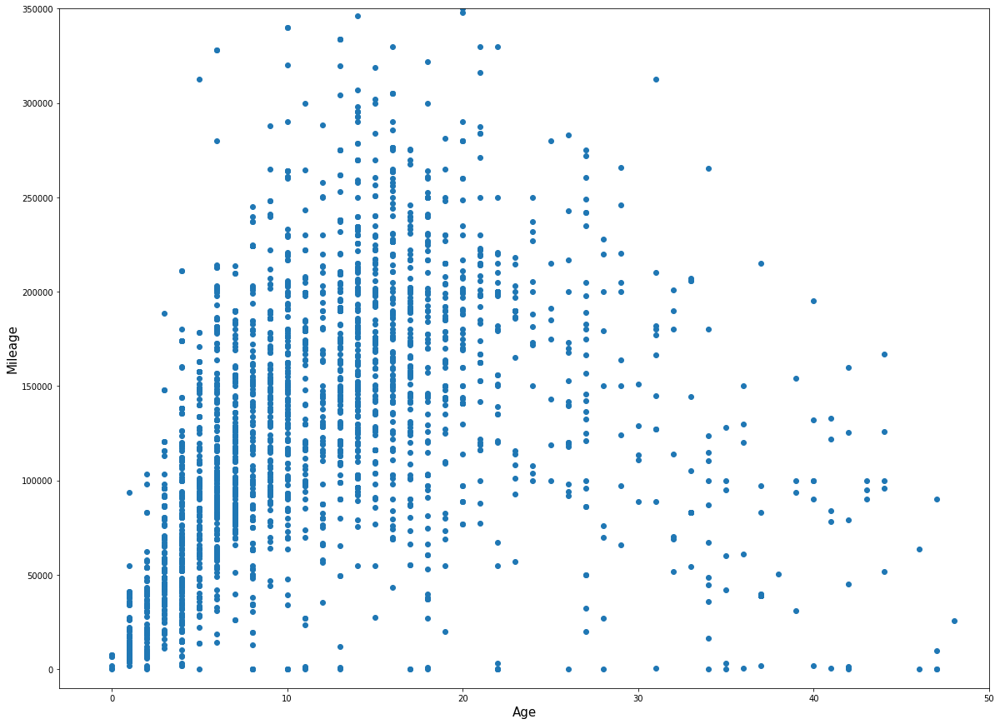

In [71]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["odometer"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Mileage", fontsize=15)
plt.xlim([-3,50])
plt.ylim([-10000,350000])
plt.show() 

In [73]:
df = vehicle_2[vehicle_2["model"]=='accord']
df["year"] = df["year"].astype(int)
df["age"] = 2021 - df["year"]
df["price"] = df["price"].astype(float)

/tmp/ipykernel_1816880/1156269704.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_1816880/1156269704.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_1816880/1156269704.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

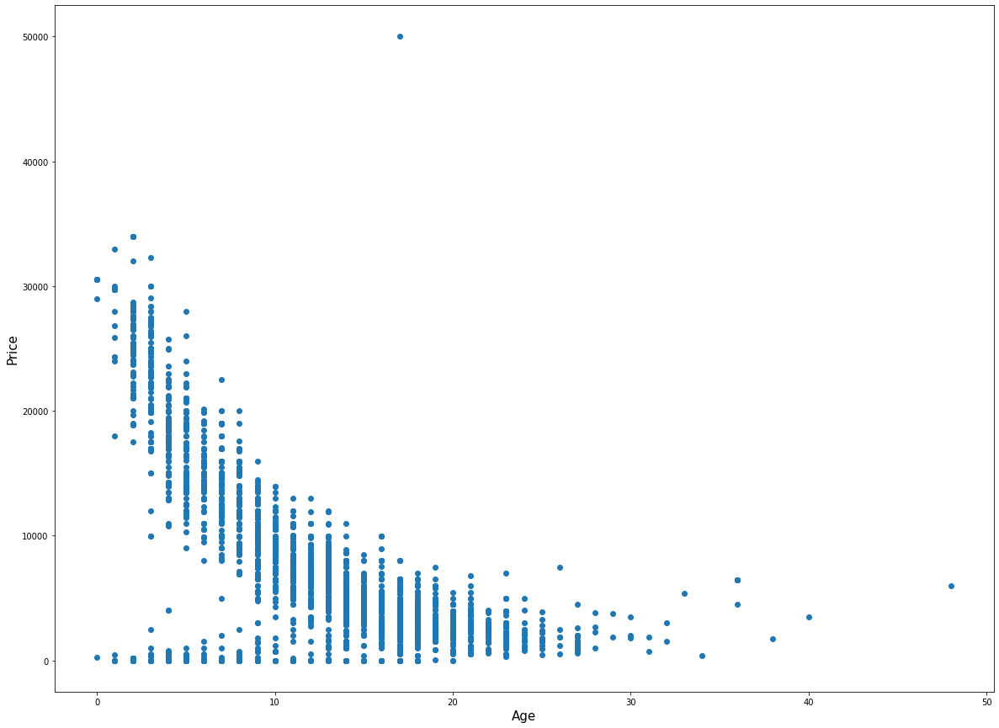

In [74]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["price"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show() 

/home/yifeisun/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


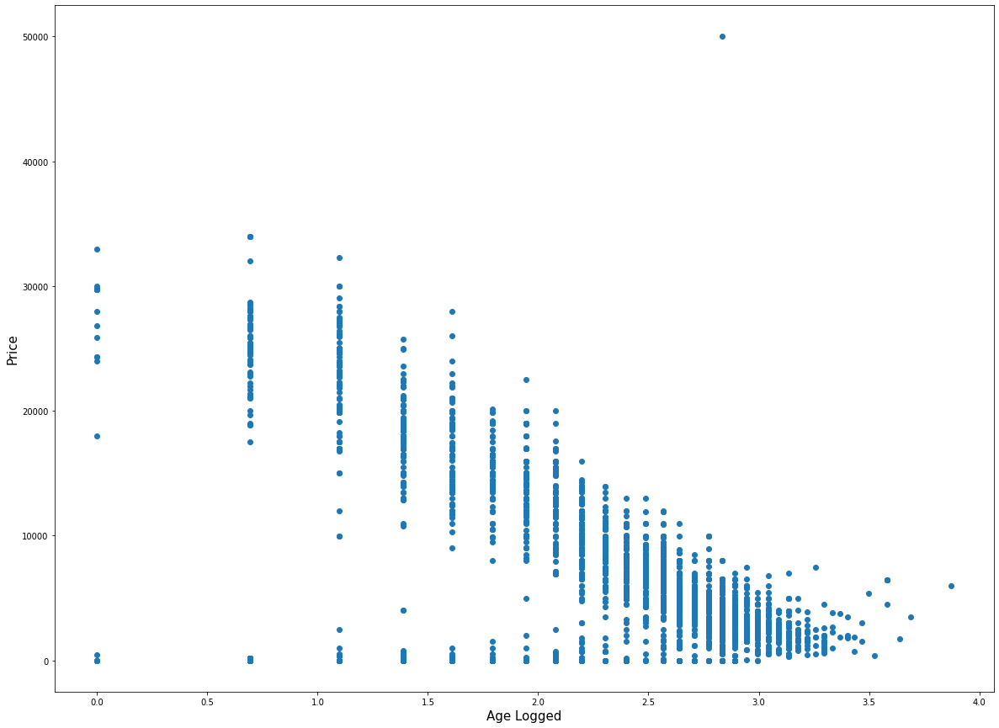

In [75]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["age"]), df["price"])
plt.xlabel("Age Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.show()

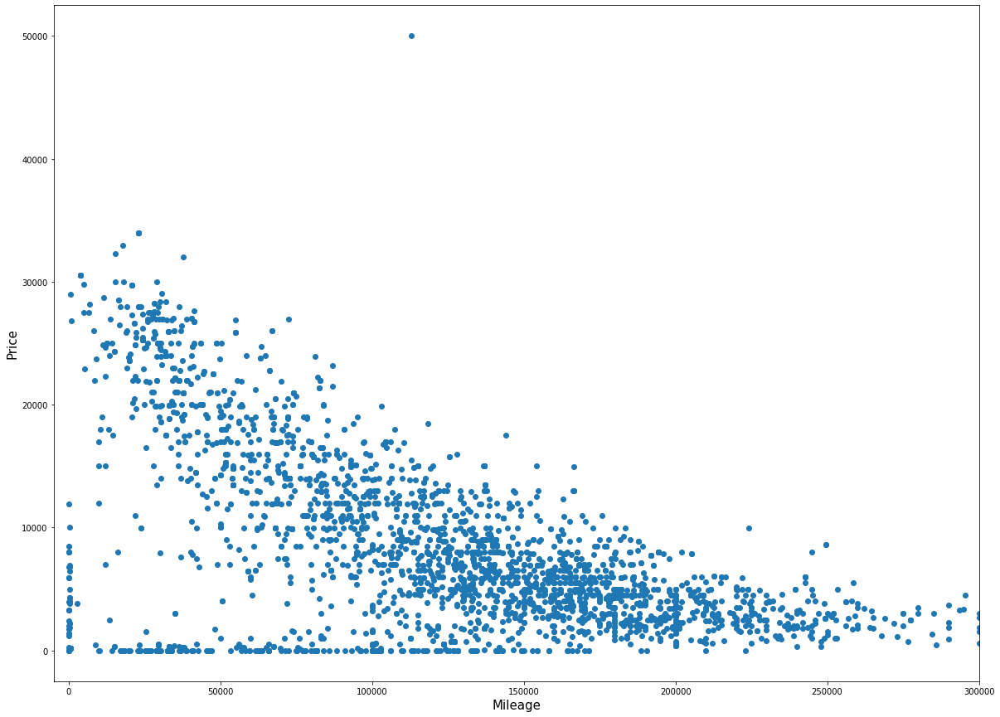

In [76]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["odometer"], df["price"])
plt.xlabel("Mileage", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-5000, 300000])
plt.show() 

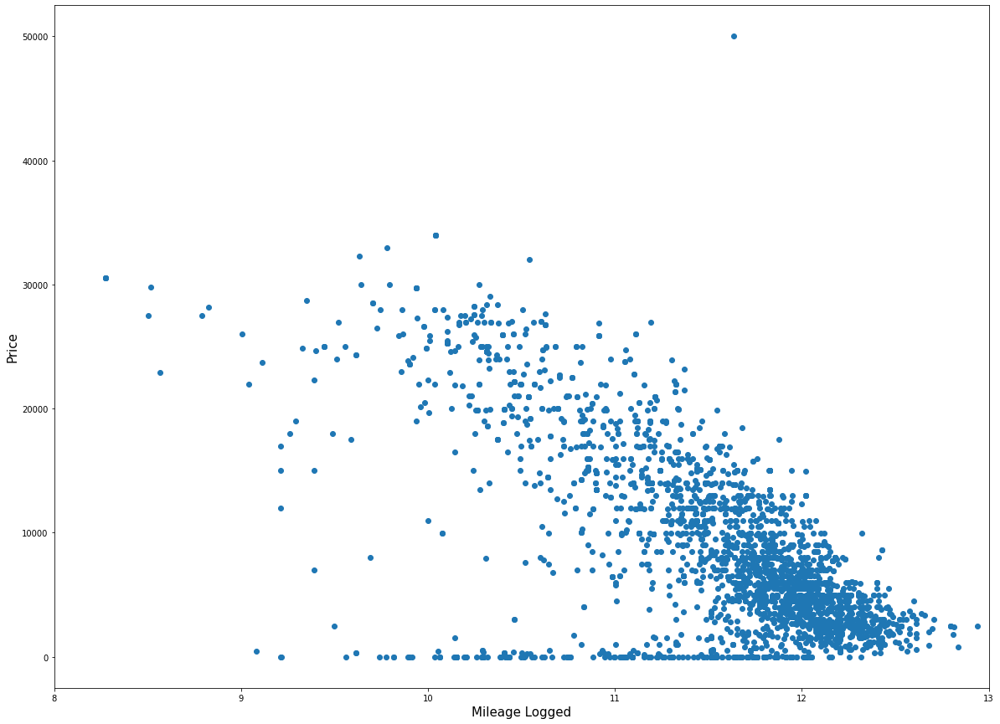

In [77]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(np.log(df["odometer"]), df["price"])
plt.xlabel("Mileage Logged", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([8, 13])
plt.show() 

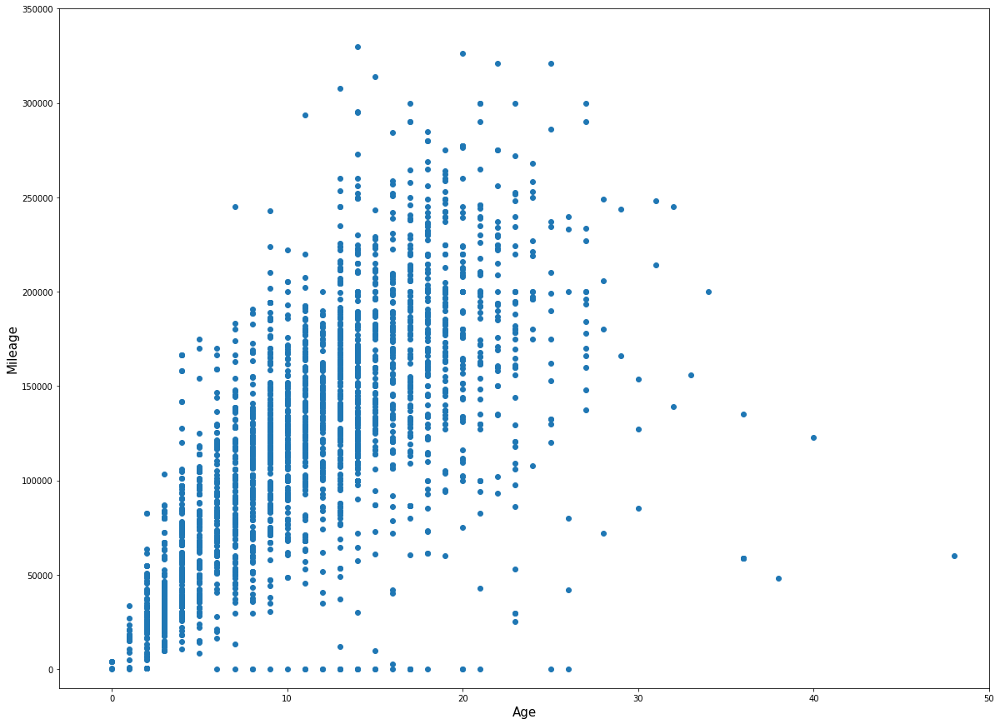

In [78]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.scatter(df["age"], df["odometer"])
plt.xlabel("Age", fontsize=15)
plt.ylabel("Mileage", fontsize=15)
plt.xlim([-3,50])
plt.ylim([-10000,350000])
plt.show() 

/tmp/ipykernel_1816880/16990256.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_1816880/16990256.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_1816880/16990256.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

TypeError: 'value' must be an instance of str or bytes, not a float

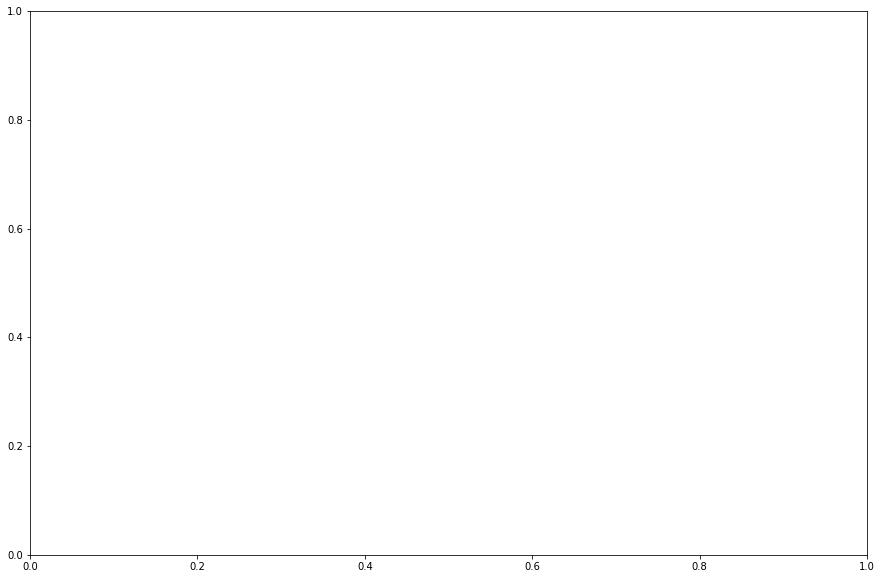

In [19]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,10))
for i in ['f-150']:
    df = vehicle_2[vehicle_2["model"]==i]
    df["year"] = df["year"].astype(int)
    df["age"] = 2021 - df["year"]
    df["price"] = df["price"].astype(float)
    plt.plot(df["age"], df["price"], vehicle_2["model"])
plt.title("Count Percentage of Movies of Different Genres through the years (First 5 Genres)", fontsize=20)
plt.xlabel("Year", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-1, 30])
plt.legend()
plt.show()  

/tmp/ipykernel_1816880/4170661589.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"] = df["year"].astype(int)
/tmp/ipykernel_1816880/4170661589.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["age"] = 2021 - df["year"]
/tmp/ipykernel_1816880/4170661589.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

TypeError: 'value' must be an instance of str or bytes, not a float

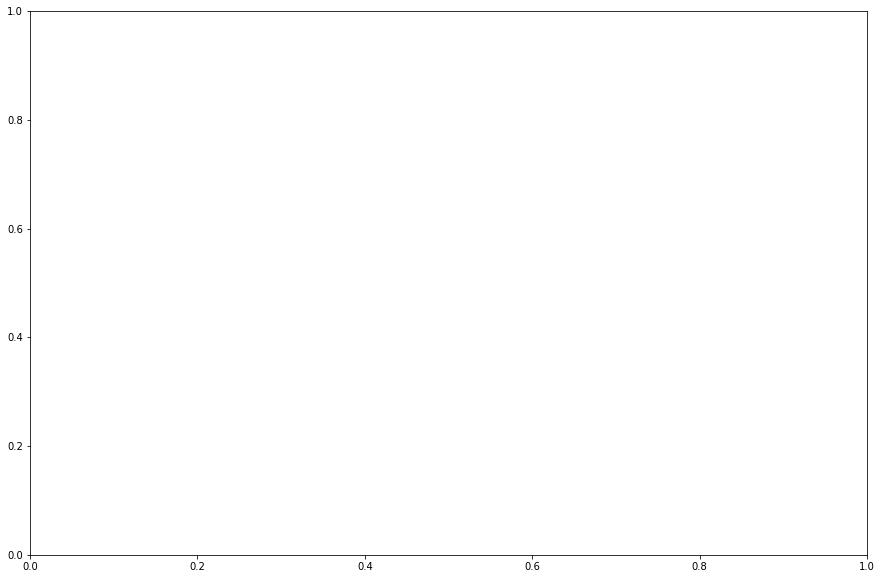

In [9]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,10))
for i in list(set(vehicle_2["model"]))[:1]:
    df = vehicle_2[vehicle_2["model"]==i]
    df["year"] = df["year"].astype(int)
    df["age"] = 2021 - df["year"]
    df["price"] = df["price"].astype(float)
    plt.plot(df["age"], df["price"], vehicle_2["model"])
plt.title("Count Percentage of Movies of Different Genres through the years (First 5 Genres)", fontsize=20)
plt.xlabel("Year", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xlim([-1, 30])
plt.legend()
plt.show()  

In [22]:
pd.to_datetime(vehicle_2["posting_date"])

27        2021-05-04 12:31:18-05:00
28        2021-05-04 12:31:08-05:00
29        2021-05-04 12:31:25-05:00
30        2021-05-04 10:41:31-05:00
31        2021-05-03 14:02:03-05:00
                    ...            
426875    2021-04-04 03:21:31-06:00
426876    2021-04-04 03:21:29-06:00
426877    2021-04-04 03:21:17-06:00
426878    2021-04-04 03:21:11-06:00
426879    2021-04-04 03:21:07-06:00
Name: posting_date, Length: 409234, dtype: object

In [24]:
pd.to_datetime(vehicle_2["posting_date"]).sort_values()

271444    2021-04-04 03:00:25-04:00
271443    2021-04-04 03:00:51-04:00
271442    2021-04-04 03:01:16-04:00
419122    2021-04-04 02:03:15-05:00
263503    2021-04-04 01:10:12-06:00
                    ...            
406982    2021-05-04 20:58:48-07:00
414522    2021-05-04 23:59:45-04:00
422031    2021-05-04 23:07:07-05:00
418366    2021-05-04 23:12:08-05:00
422030    2021-05-04 23:24:09-05:00
Name: posting_date, Length: 409234, dtype: object

In [23]:
set(pd.to_datetime(vehicle_2["posting_date"]).year)

AttributeError: 'Series' object has no attribute 'year'

In [6]:
set(vehicle["region"].tolist())

{'SF bay area',
 'abilene',
 'akron / canton',
 'albany',
 'albuquerque',
 'altoona-johnstown',
 'amarillo',
 'ames',
 'anchorage / mat-su',
 'ann arbor',
 'annapolis',
 'appleton-oshkosh-FDL',
 'asheville',
 'ashtabula',
 'athens',
 'atlanta',
 'auburn',
 'augusta',
 'austin',
 'bakersfield',
 'baltimore',
 'baton rouge',
 'battle creek',
 'beaumont / port arthur',
 'bellingham',
 'bemidji',
 'bend',
 'billings',
 'binghamton',
 'birmingham',
 'bismarck',
 'bloomington',
 'bloomington-normal',
 'boise',
 'boone',
 'boston',
 'boulder',
 'bowling green',
 'bozeman',
 'brainerd',
 'brownsville',
 'brunswick',
 'buffalo',
 'butte',
 'cape cod / islands',
 'catskills',
 'cedar rapids',
 'central NJ',
 'central louisiana',
 'central michigan',
 'champaign urbana',
 'charleston',
 'charlotte',
 'charlottesville',
 'chattanooga',
 'chautauqua',
 'chicago',
 'chico',
 'chillicothe',
 'cincinnati',
 'clarksville',
 'cleveland',
 'clovis / portales',
 'college station',
 'colorado springs',
 'c

In [7]:
len(set(vehicle["region"].tolist()))

404

In [14]:
vehicle_2["url"].iloc[4567]

'https://tuscaloosa.craigslist.org/cto/d/tuscaloosa-1968-chevrolet-caprice/7312092765.html'

In [15]:
carprice = pd.read_csv("CarPrice_Assignment.csv")
carprice

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,201,-1,volvo 145e (sw),gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845.0
201,202,-1,volvo 144ea,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045.0
202,203,-1,volvo 244dl,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485.0
203,204,-1,volvo 246,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.40,23.0,106,4800,26,27,22470.0
